
<br>
<font face="Times New Roman">
<div dir=ltr align=center>
<!-- <font color=0F5298 size=7> -->
<font color=0F5298 size=6>
    NLP Text Analysis <br> <br>
<!-- <font color=2565AE size=5> -->
<font size=5>
    Computer Engineering Department <br>
    HW1 <br>
     <br>

    
____

### Full Name : Pardis Sadat Zahraei
### Student Number : 99109777
___

# Introduction
Our goal is to explore and extract features from a text for analysis. To achieve this, I will utilize a sentiment analysis dataset known as "Tweet Sentiment Extraction". This dataset is freely available online and I found it on Kaggle and was generated using tweepy and twitter api. The choice of this dataset was influenced by its size of 3Mb, which falls within the desired limit and the nature of tweets. A task as complex as sentiment analysis presents numerous challenges. As we progress, these challenges will be addressed and we will strive to execute the task in the most effective manner. Let's begin!

## import packages and libraries

In [ ]:
!pip install beautifulsoup4

!pip install contractions



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.9/289.9 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.8/110.8 kB 13.3 MB/s eta 0:00:00


In [ ]:
!pip install pyspellchecker

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 11.7 MB/s eta 0:00:00


In [ ]:
from spellchecker import SpellChecker

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
import string
import numpy as np
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

from tqdm import tqdm
tqdm.pandas()


import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from spellchecker import SpellChecker
import contractions
from bs4 import BeautifulSoup


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


## Exploring the dataset

In [ ]:
df = pd.read_csv('train.csv')
print(df.shape)

(27481, 4)


We have 27,481 tweets

First 5 rows of the DataFrame

In [ ]:
df.head()

,textID,text,selected_text,sentiment
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative
2,088c60f138,my boss is bullying me...,bullying me,negative
3,9642c003ef,what interview! leave me alone,leave me alone,negative
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative


Check for the existence of NaN values in the DataFrame

In [ ]:
print("\nNaN values in the DataFrame:")
print(df.isna().sum())


NaN values in the DataFrame:
textID                                      0
text                                        0
selected_text                               0
sentiment                                   0
tweet_length                                0
word_count                                  0
sentiment_score_TextBlob                    0
sentiment_score_TextBlob_selected           0
sentiment_score_Vader                       0
sentiment_score_Vader_selected              0
sentiment_score_TextBlob_0.05               0
sentiment_score_TextBlob_0.3                0
sentiment_score_TextBlob_0.5                0
sentiment_score_Vader_0.05                  0
sentiment_score_Vader_0.3                   0
sentiment_score_Vader_0.5                   0
sentiment_score_Vader_selected_0.05         0
sentiment_score_Vader_selected_0.3          0
sentiment_score_Vader_selected_0.5          0
sentiment_score_TextBlob_selected_0.05      0
sentiment_score_TextBlob_selected_0.3       0
sent

In [ ]:
print("\nNaN values in the DataFrame:")
print(df.isna().sum())


NaN values in the DataFrame:
textID           0
text             1
selected_text    1
sentiment        0
dtype: int64


We found some Nan values lets see what it was and how can we replace it

In [ ]:
print("Rows with NaN values:")
print(df[df.isna().any(axis=1)])

Rows with NaN values:
           textID                                               text  \
8      e050245fbd                                        Both of you   
46     ddf296dffa  egh blah and boooooooooooo i dunno wanna go to...   
118    87fbf14655    holy smokes! star trek was freaking awesomeeeee   
327    be8544ffb1                                             There!   
390    47990d2312                                        BRAINFREEZE   
...           ...                                                ...   
26587  c0704fd61e   **** girl I`m so down but ya gotta let me kno...   
26660  f5c91fd937     SON OF A ****!!!! ARGGGHHHHHHHHHHH SO OVER IT.   
26692  7dc13f50d8                                       yessssssir!!   
26938  a33cec15dd                                              I did   
27060  7f97ffc651                          Bruno arghhhh i cant wait   

          selected_text sentiment  tweet_length  word_count  \
8           Both of you   neutral            12   

In [ ]:
print("Rows with NaN values:")
print(df[df.isna().any(axis=1)])

Rows with NaN values:
         textID text selected_text sentiment
314  fdb77c3752  NaN           NaN   neutral


we dont have the Text and it is not a numerical value (if it was we could replace it with the mean or median value) and we have many more rows to do the analysis so we remove this Nan value from our dataset

In [ ]:
df.dropna(inplace=True)
print("\nDataFrame after removing NaN values:")
print(df.isna().sum())


DataFrame after removing NaN values:
textID           0
text             0
selected_text    0
sentiment        0
dtype: int64


In [ ]:
print(df.shape)

(27480, 4)


Now we have 27,480 tweets, lets see the histograms for the detected sentiments

In [ ]:
df.describe()

,textID,text,selected_text,sentiment
count,27480,27480,27480,27480
unique,27480,27480,22463,3
top,cb774db0d1,"I`d have responded, if I were going",good,neutral
freq,1,1,199,11117


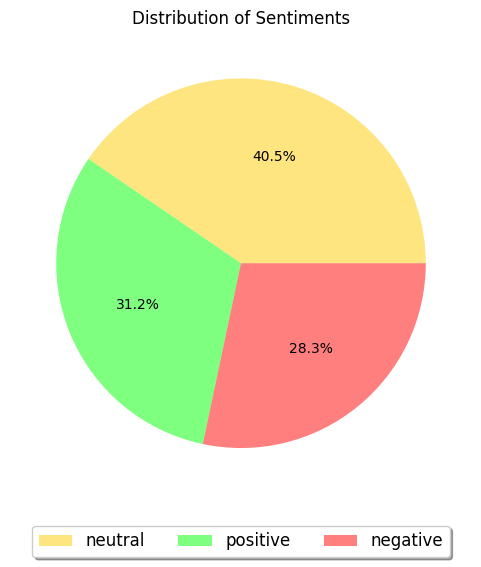

In [ ]:

sentiment_counts = df['sentiment'].value_counts(normalize=True)

colors = [(1, 0.8, 0, 0.5), (0, 1, 0, 0.5), (1, 0, 0, 0.5)]

plt.figure(figsize=(7, 6))
patches, _, _ = plt.pie(sentiment_counts, autopct='%1.1f%%', colors=colors)

plt.legend(patches, sentiment_counts.index, loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=5, fontsize=12)

plt.title('Distribution of Sentiments')
plt.show()


So we have a fair share of rach sentiment and our data wouldnt have much bias, lets have a word cloud to see the top words o each sentiment

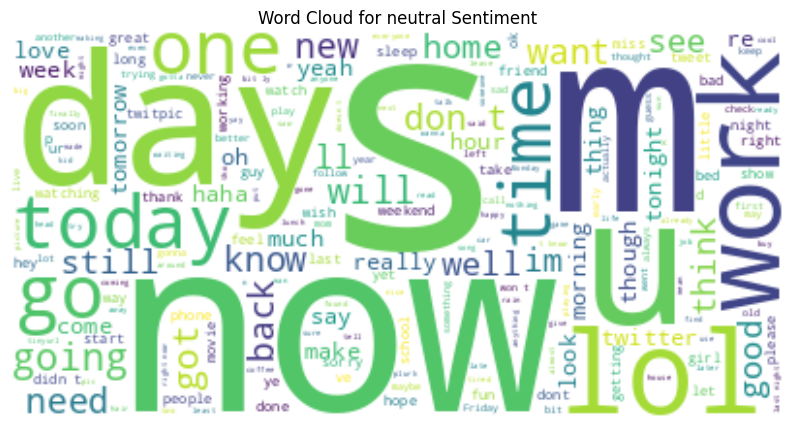

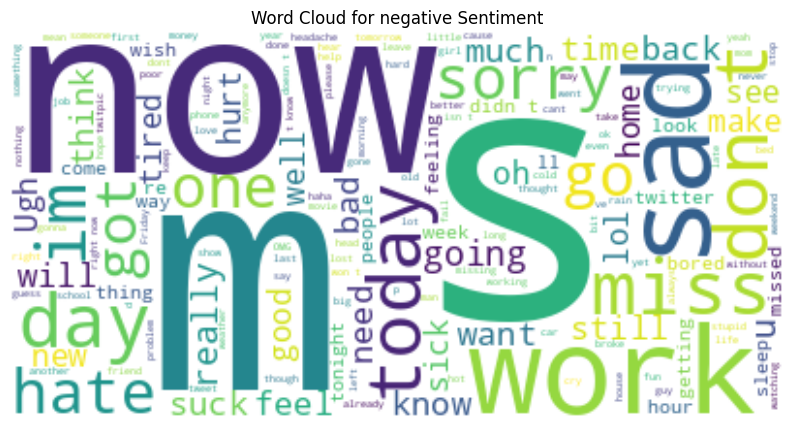

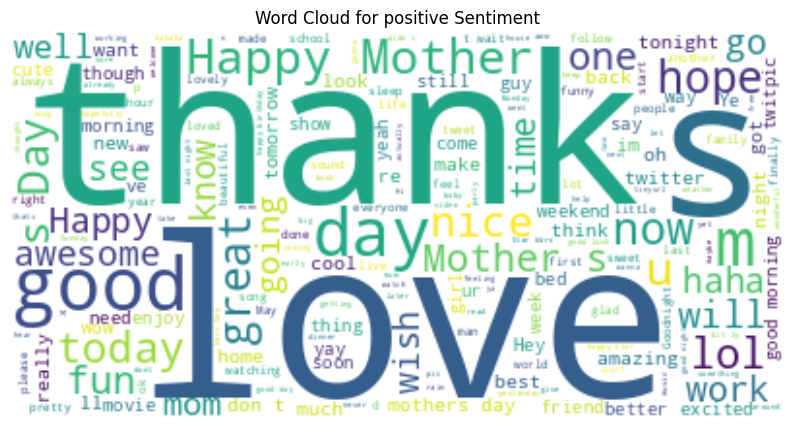

In [ ]:
# Word Cloud for each sentiment
sentiments = df['sentiment'].unique()
for sentiment in sentiments:
    wc = WordCloud(background_color='white').generate(' '.join(df[df['sentiment'] == sentiment]['text']))
    plt.figure(figsize=(10, 6))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {sentiment} Sentiment')
    plt.show()

In [ ]:
# Top Words in each sentiment
for sentiment in sentiments:
    top_words = pd.Series(' '.join(df[df['sentiment'] == sentiment]['text']).split()).value_counts()[:10]
    print(f'Top words for {sentiment} sentiment:\n{top_words}\n')

Top words for neutral sentiment:
to     4057
I      3365
the    3329
a      2438
my     1800
and    1713
i      1507
in     1501
you    1433
for    1412
dtype: int64

Top words for negative sentiment:
I      2956
to     2838
the    2301
my     1778
a      1758
i      1550
and    1442
is     1245
in     1045
it      889
dtype: int64

Top words for positive sentiment:
to     2914
the    2758
I      2481
a      2305
you    1583
and    1522
my     1354
for    1308
i      1206
is     1065
dtype: int64



We can see that it looks messy and bad because we need to do some preprocessing on the text for example normalization, removal of stop words,stemming,lemmitization,... But lets continue our EDA and see more like length of tweets and number of words

In [ ]:
df['tweet_length'] = df['text'].apply(len)
df['word_count'] = df['text'].apply(lambda x: len(str(x).split()))

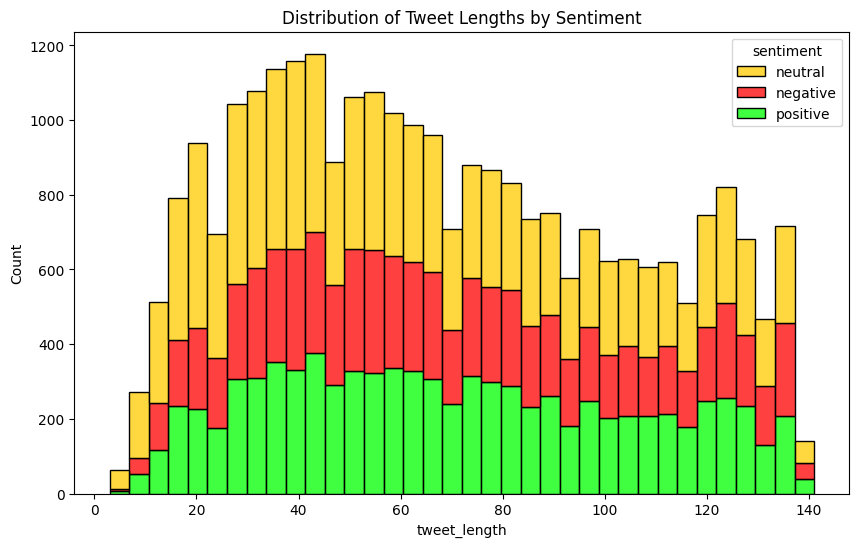

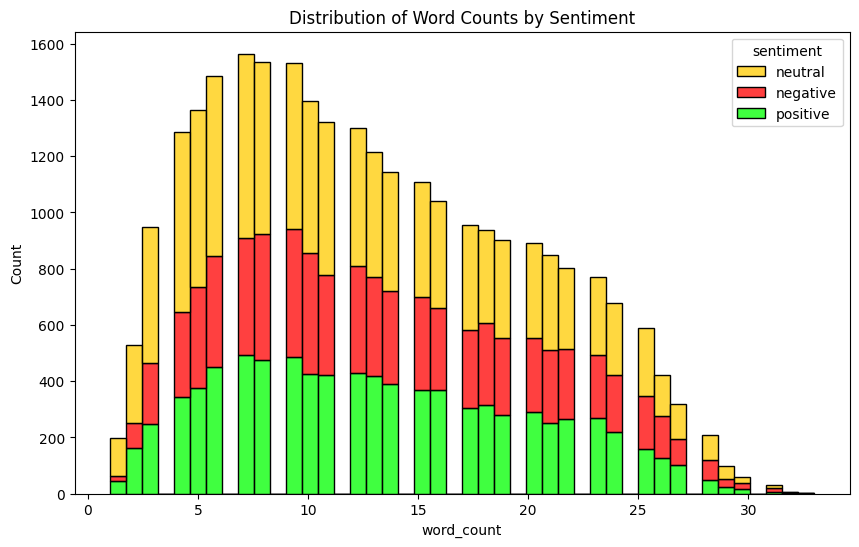

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from textblob import TextBlob

colors = [(1, 0.8, 0, 0.4), (1, 0, 0, 0.4), (0, 1, 0, 0.4)]

# Length of Tweets
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='tweet_length', hue='sentiment', multiple='stack', palette=colors)
plt.title('Distribution of Tweet Lengths by Sentiment')
plt.show()

# Number of Words
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='word_count', hue='sentiment', multiple='stack', palette=colors)
plt.title('Distribution of Word Counts by Sentiment')
plt.show()


Thats really interesting!! but lets see what happens when we see if there is a pattern in here

We have the distribution of word_count and text_length we can see the peak frequency is in 3-12 words and 20-60 text_length. Analyzing both word_count and tweet_length can give a more comprehensive understanding of my text data. For example, if we have two tweets with the same word count, but one has a much larger tweet length, that could indicate that one tweet uses longer words on average.

In [ ]:
import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df, *['word_count'], **{})
chart

In [ ]:
import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df, *['tweet_length'], **{})
chart

Lets draw faceted plots as well

In [ ]:
import numpy as np
from google.colab import autoviz

def violin_plot(df, value_colname, facet_colname, figscale=1, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (12 * figscale, 1.2 * figscale * len(df[facet_colname].unique()))
  plt.figure(figsize=figsize)
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(df, *['word_count', 'sentiment'], **{'inner': 'box'})
chart

In [ ]:
import numpy as np
from google.colab import autoviz

def violin_plot(df, value_colname, facet_colname, figscale=1, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (12 * figscale, 1.2 * figscale * len(df[facet_colname].unique()))
  plt.figure(figsize=figsize)
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(df, *['tweet_length', 'sentiment'], **{'inner': 'box'})
chart

Calculate the average tweet length for each sentiment

In [ ]:
average_lengths = df.groupby('sentiment')['tweet_length'].mean()
print("Average tweet lengths for each sentiment:\n", average_lengths)

Average tweet lengths for each sentiment:
 sentiment
negative    70.488112
neutral     65.206800
positive    70.419133
Name: tweet_length, dtype: float64


Now we want to see if a pattern exists between the length and sentiment or not

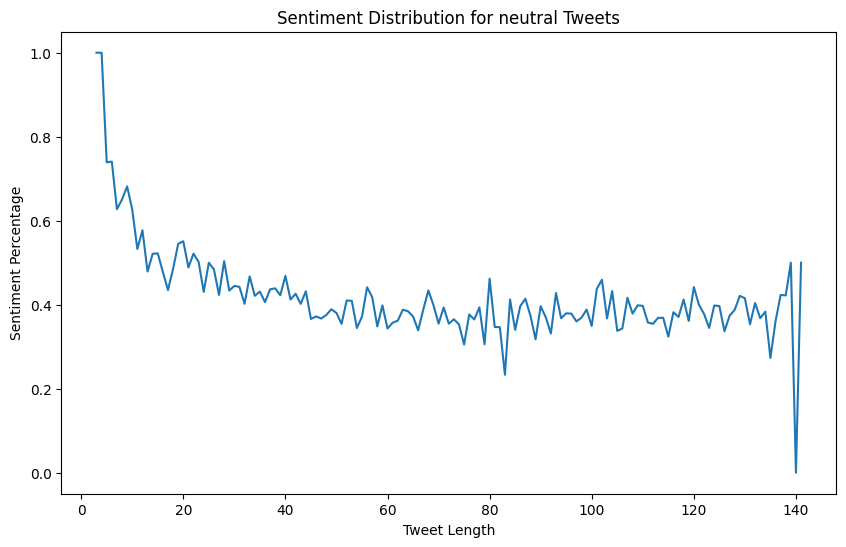

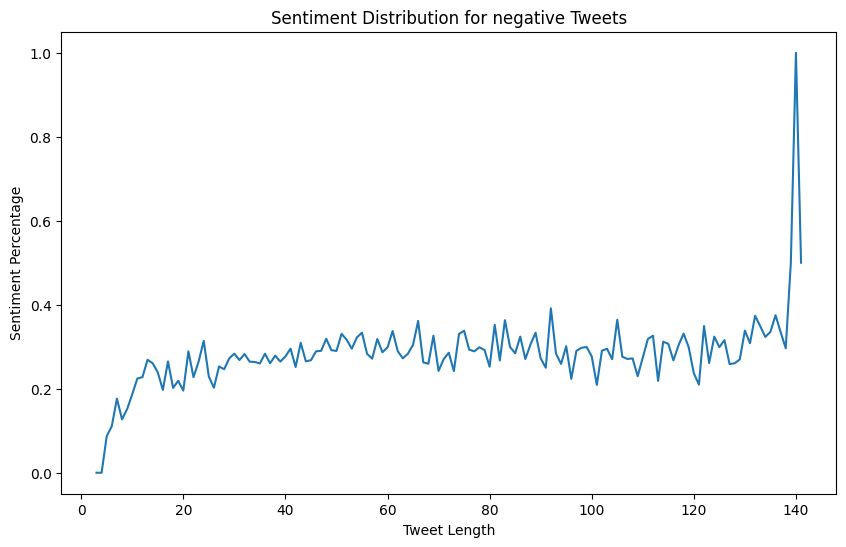

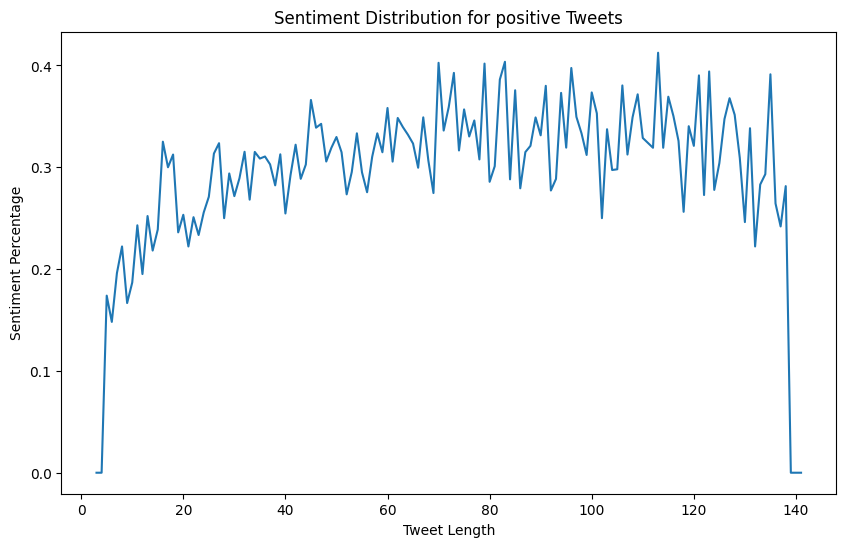

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


df['tweet_length'] = df['text'].apply(len)

length_sentiment = df.groupby(['tweet_length', 'sentiment']).size().unstack(fill_value=0)

length_sentiment_percentage = length_sentiment.divide(length_sentiment.sum(axis=1), axis=0)

sentiments = df['sentiment'].unique()

for sentiment in sentiments:
    plt.figure(figsize=(10, 6))
    plt.plot(length_sentiment_percentage.index, length_sentiment_percentage[sentiment])
    plt.title(f'Sentiment Distribution for {sentiment} Tweets')
    plt.xlabel('Tweet Length')
    plt.ylabel('Sentiment Percentage')
    plt.show()


Amazing!!! \\
There is a pattern!! \\
neutral tweets seems to happen more in smaller tweets but negative tweets are a bit longer.

Lets see the relation between tweet_length and word_count

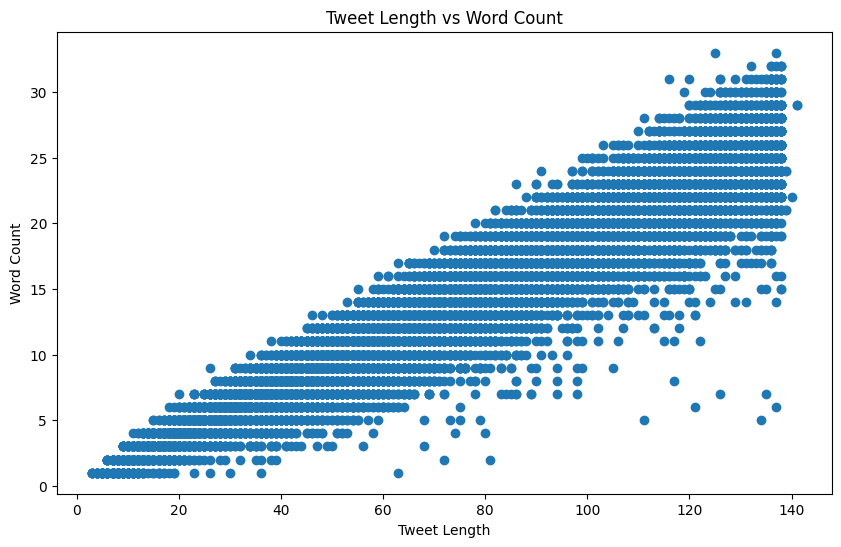

In [ ]:
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 6))
plt.scatter(df['tweet_length'], df['word_count'])
plt.title('Tweet Length vs Word Count')
plt.xlabel('Tweet Length')
plt.ylabel('Word Count')
plt.show()


In [ ]:
filtered_df = df[(df['tweet_length'] >= 120) & (df['tweet_length'] <= 140) & (df['word_count'] >= 0) & (df['word_count'] <= 10)]

filtered_df

,textID,text,selected_text,sentiment,tweet_length,word_count
1587,3b50246867,Link per my daughter us.mobile.reuters.com/mo...,Link per my daughter us.mobile.reuters.com/mo...,neutral,134,5
6787,9e55909005,"YESSS, FLASH IS BEING **** TONIGHT! It..........",FLASH IS BEING **** TONIGHT!,negative,135,7
11560,70adfb7cef,THE VIDEO IS FINALLY DONE WOOOOOOOOOOOOOOOOOOO...,WOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOO...,neutral,137,6
12809,86fb8984c4,yes indeed ...,yes indeed,neutral,121,6
24999,add398ab57,"???? ? ??????, ?????? ????????,Basquash,K-ON...","???? ? ??????, ?????? ????????,Basquash,K-ON,...",neutral,126,7


these are the exact data:


*    Link per my daughter  us.mobile.reuters.com/mobile/m/AnyArticle/p.rdt?URL=http://www.reuters.com/article/bigMoney/idUS1284981420090508
*   YESSS, FLASH IS BEING **** TONIGHT!  It.........takes.................time...........to.........open...........a..........webpage......
*   THE VIDEO IS FINALLY DONE WOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOO!

*    ????  ? ??????, ?????? ????????,Basquash,K-ON,07-Ghost,Sengoku Basara,Valkyria Chronicles,RequiemForThePhantom,EdenOfTheEast.




We definitely need preprocessing :)

lets have a Sentiment Score as well, Sentiment scores are continuous numbers that range from -1 to 1, where -1 represents extremely negative sentiment, 1 represents extremely positive sentiment, and 0 represents neutral sentiment. This allows us to capture varying degrees of positivity or negativity in the text, which might not be possible with categorical sentiment labels alone.

A sentiment scoring tool like TextBlob would capture this difference.

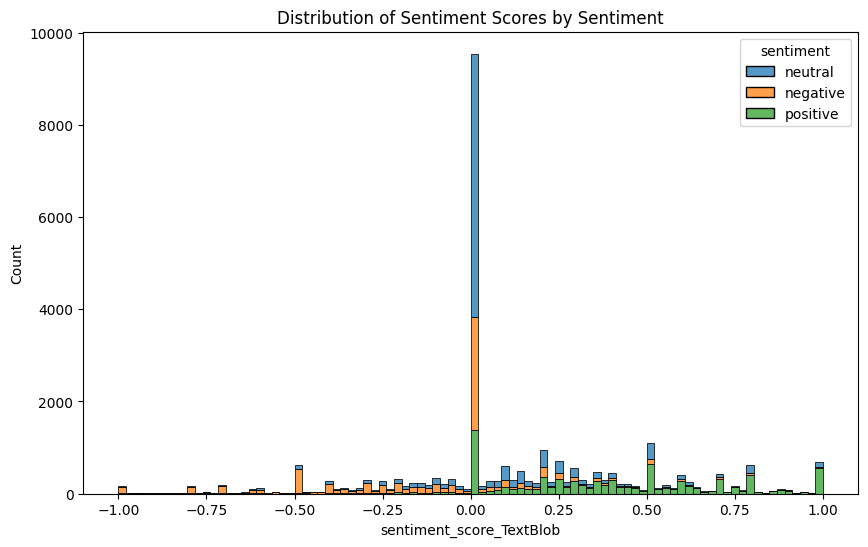

In [ ]:
# Sentiment Score
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from textblob import TextBlob
df['sentiment_score_TextBlob'] = df['text'].apply(lambda x: TextBlob(x).sentiment.polarity)
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='sentiment_score_TextBlob', hue='sentiment', multiple='stack')
plt.title('Distribution of Sentiment Scores by Sentiment')
plt.show()


Lets do a sentiment score for selected text as well

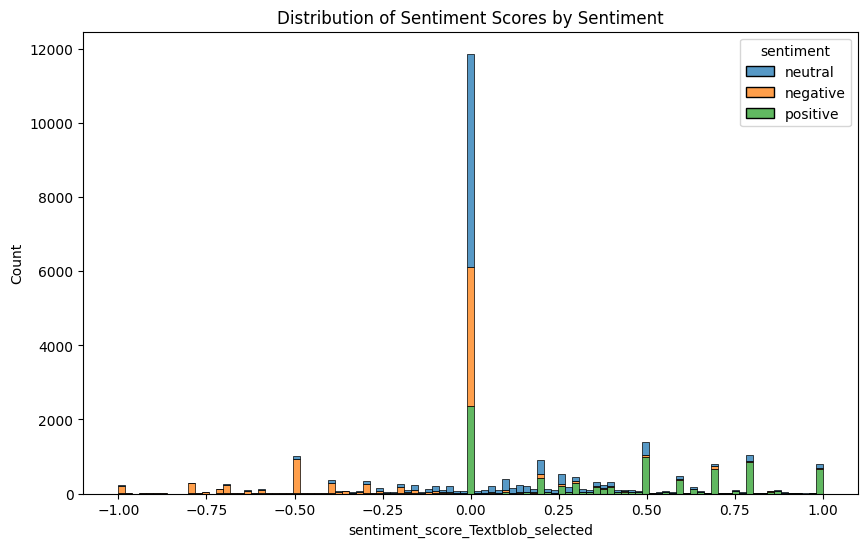

In [ ]:
# Sentiment Score
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from textblob import TextBlob
df['sentiment_score_TextBlob_selected'] = df['selected_text'].apply(lambda x: TextBlob(x).sentiment.polarity)
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='sentiment_score_Textblob_selected', hue='sentiment', multiple='stack')
plt.title('Distribution of Sentiment Scores by Sentiment')
plt.show()


Funny how Sentiment scores doesnt completly align with our predefined sentiments, lets see some cases:

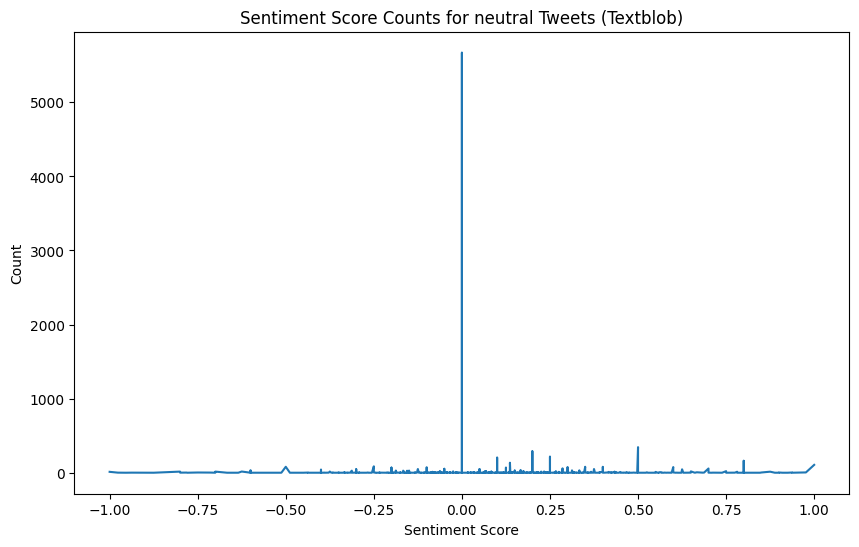

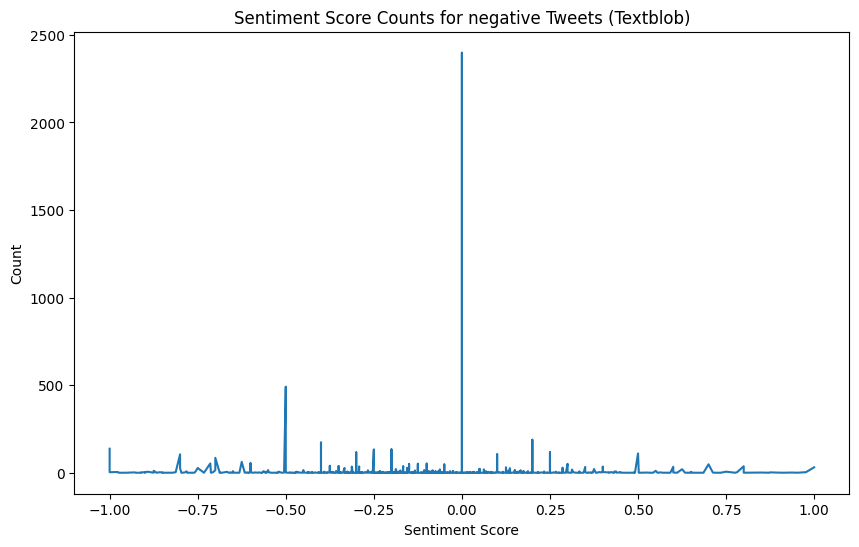

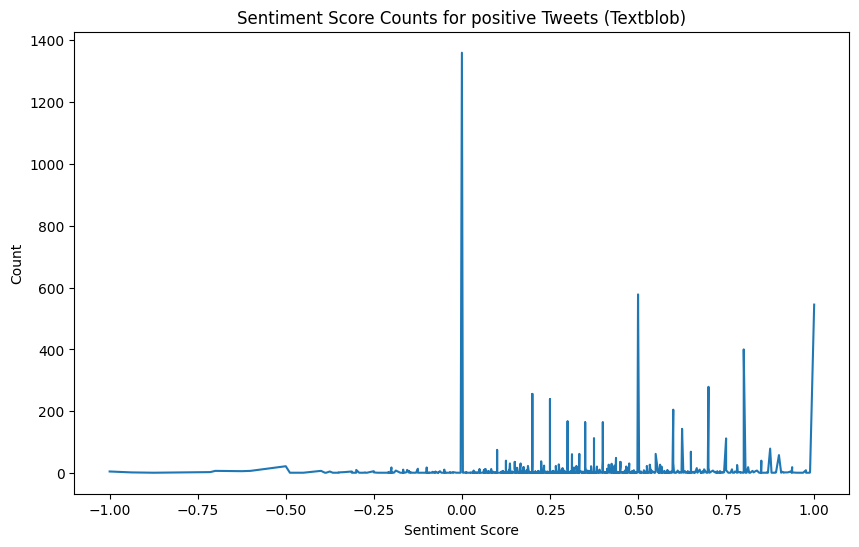

In [ ]:
import matplotlib.pyplot as plt

sentiments = df['sentiment'].unique()

for sentiment in sentiments:
    df_sentiment = df[df['sentiment'] == sentiment]


    score_counts = df_sentiment['sentiment_score_TextBlob'].value_counts().sort_index()

    plt.figure(figsize=(10, 6))
    plt.plot(score_counts.index, score_counts.values)
    plt.title(f'Sentiment Score Counts for {sentiment} Tweets (Textblob)')
    plt.xlabel('Sentiment Score')
    plt.ylabel('Count')
    plt.show()


now for selected text:

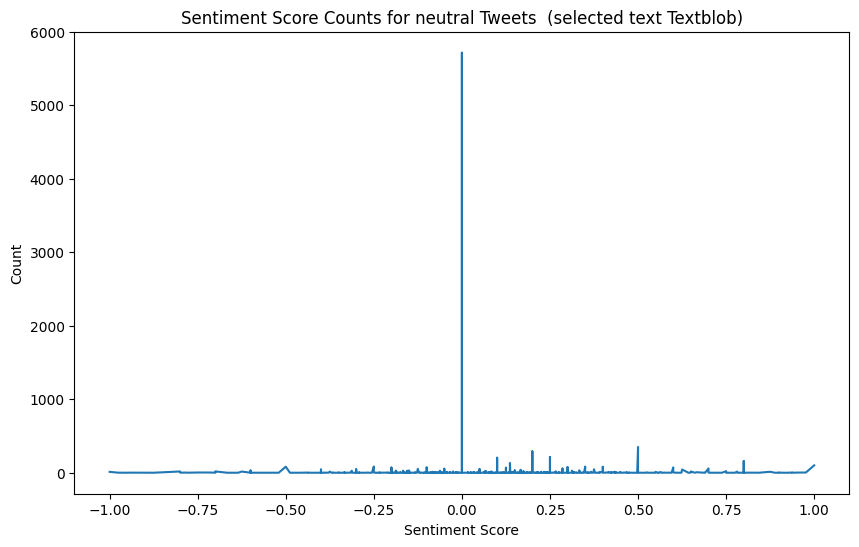

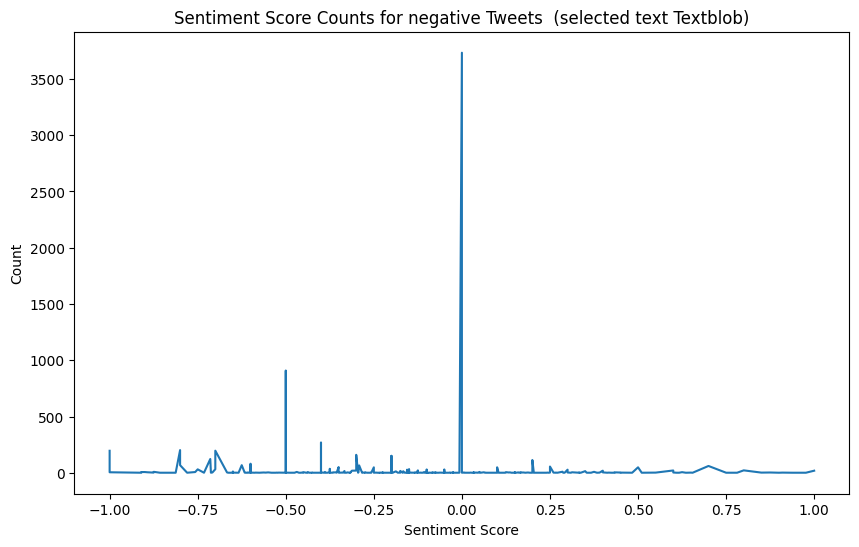

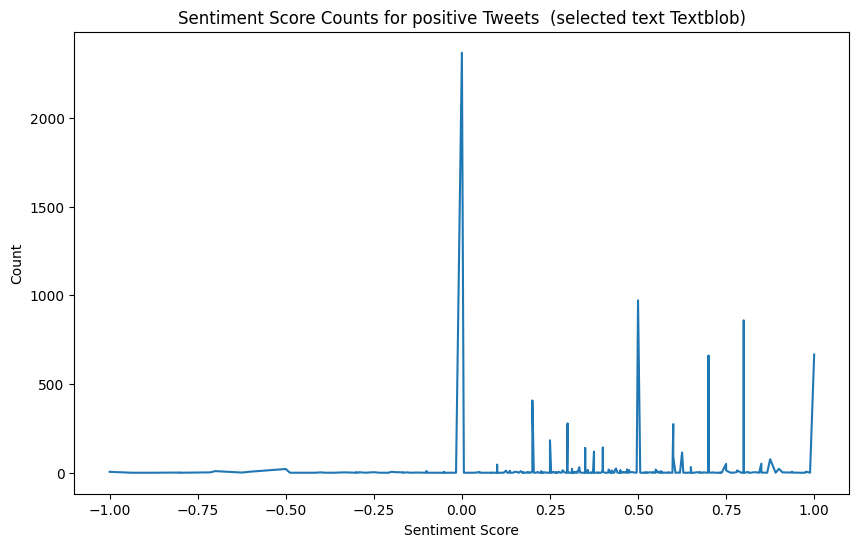

In [ ]:
import matplotlib.pyplot as plt


sentiments = df['sentiment'].unique()

for sentiment in sentiments:
    df_sentiment = df[df['sentiment'] == sentiment]

    score_counts = df_sentiment['sentiment_score_TextBlob_selected'].value_counts().sort_index()

    plt.figure(figsize=(10, 6))
    plt.plot(score_counts.index, score_counts.values)
    plt.title(f'Sentiment Score Counts for {sentiment} Tweets  (selected text Textblob)')
    plt.xlabel('Sentiment Score')
    plt.ylabel('Count')
    plt.show()


We can defintly see the diffrence for the selected text vs the whole text and this shows how important extracting the selected text is

We can see Sentiment scores are mostly 0 (detecting as neutral) while the dataset suggest other wise

really interesting how Sentiment score isnt working !!!

In [ ]:
!pip install vaderSentiment

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 3.0 MB/s eta 0:00:00


In [ ]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

analyzer = SentimentIntensityAnalyzer()

# Calculate VADER sentiment scores
df['sentiment_score_Vader'] = df['text'].apply(lambda x: analyzer.polarity_scores(x)['compound'])

df


,textID,text,selected_text,sentiment,tweet_length,word_count,sentiment_score_TextBlob,sentiment_score_Textblob_selected,sentiment_score_Vader
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,36,7,0.000000,0.0,0.0000
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,46,10,-0.976562,-0.5,-0.7437
2,088c60f138,my boss is bullying me...,bullying me,negative,25,5,0.000000,0.0,-0.5994
3,9642c003ef,what interview! leave me alone,leave me alone,negative,31,5,0.000000,0.0,-0.3595
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,75,14,0.000000,0.0,0.0000
...,...,...,...,...,...,...,...,...,...
27476,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,77,16,0.000000,0.0,0.1027
27477,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,122,23,0.184091,0.0,0.3818
27478,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,111,22,0.366667,0.7,0.9136
27479,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,27,6,0.300000,0.3,0.3291


In [ ]:

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer


analyzer = SentimentIntensityAnalyzer()

# Calculate VADER sentiment scores
df['sentiment_score_Vader_selected'] = df['selected_text'].apply(lambda x: analyzer.polarity_scores(x)['compound'])
df


,textID,text,selected_text,sentiment,tweet_length,word_count,sentiment_score_TextBlob,sentiment_score_Textblob_selected,sentiment_score_Vader,sentiment_score_Vader_selected
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,36,7,0.000000,0.0,0.0000,0.0000
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,46,10,-0.976562,-0.5,-0.7437,-0.5904
2,088c60f138,my boss is bullying me...,bullying me,negative,25,5,0.000000,0.0,-0.5994,-0.5994
3,9642c003ef,what interview! leave me alone,leave me alone,negative,31,5,0.000000,0.0,-0.3595,-0.2960
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,75,14,0.000000,0.0,0.0000,0.0000
...,...,...,...,...,...,...,...,...,...,...
27476,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,77,16,0.000000,0.0,0.1027,-0.3182
27477,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,122,23,0.184091,0.0,0.3818,0.0000
27478,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,111,22,0.366667,0.7,0.9136,0.7430
27479,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,27,6,0.300000,0.3,0.3291,0.3291


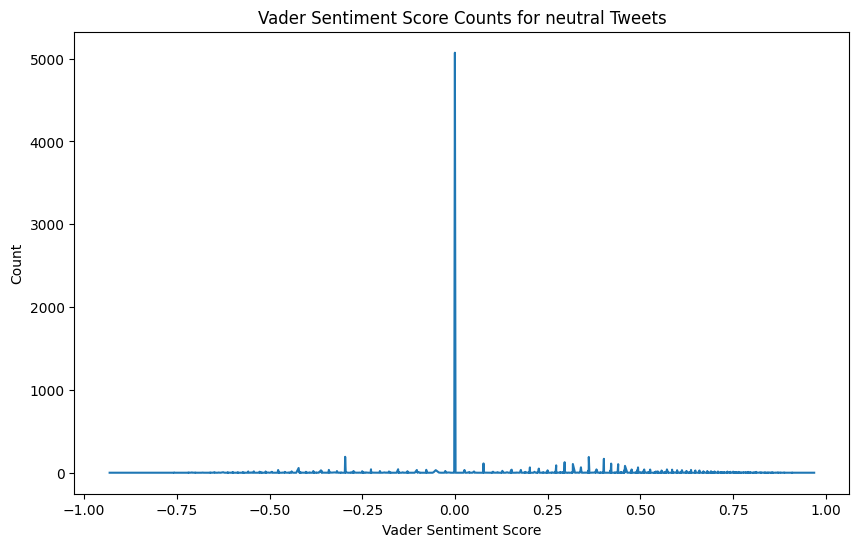

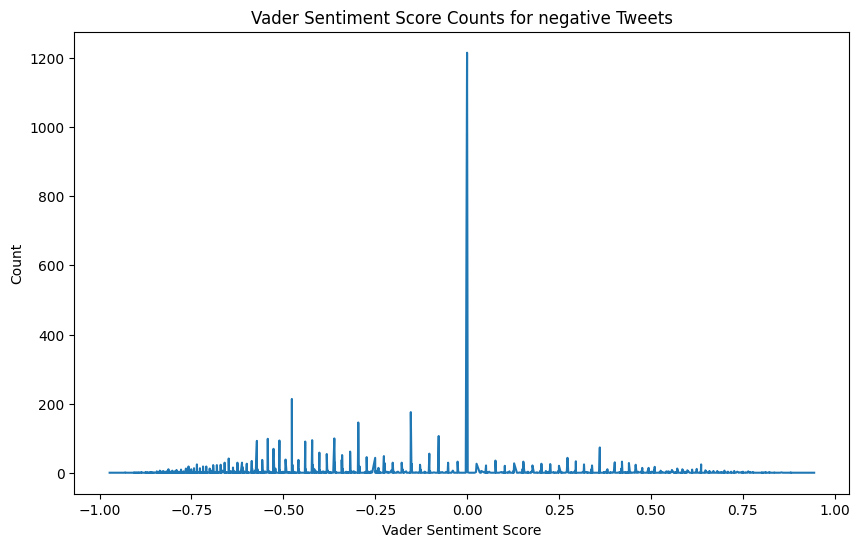

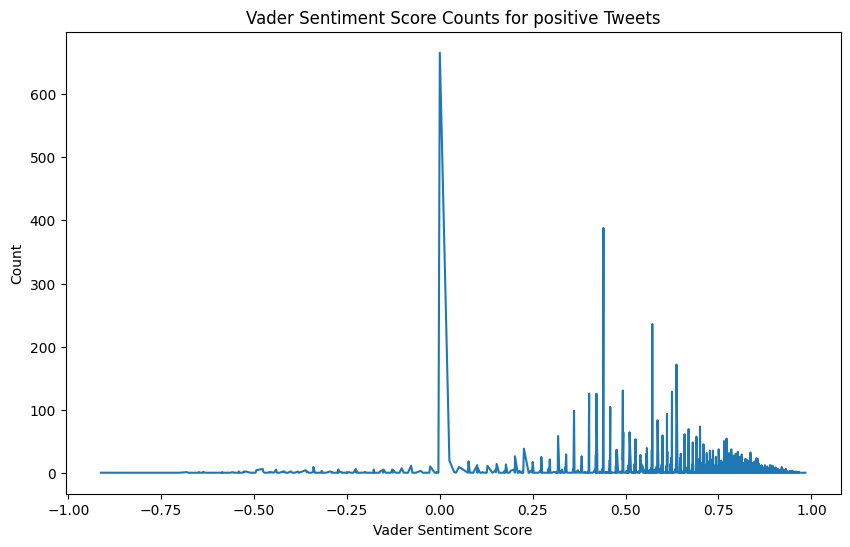

In [ ]:
import matplotlib.pyplot as plt

sentiments = df['sentiment'].unique()

for sentiment in sentiments:
    # Filter the DataFrame for the current sentiment
    df_sentiment = df[df['sentiment'] == sentiment]

    score_counts = df_sentiment['sentiment_score_Vader'].value_counts().sort_index()

    plt.figure(figsize=(10, 6))
    plt.plot(score_counts.index, score_counts.values)
    plt.title(f'Vader Sentiment Score Counts for {sentiment} Tweets')
    plt.xlabel('Vader Sentiment Score')
    plt.ylabel('Count')
    plt.show()


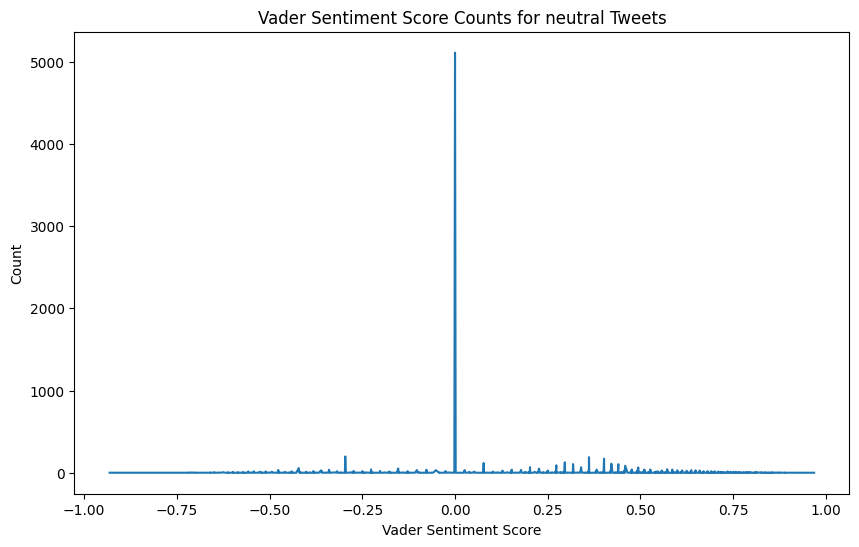

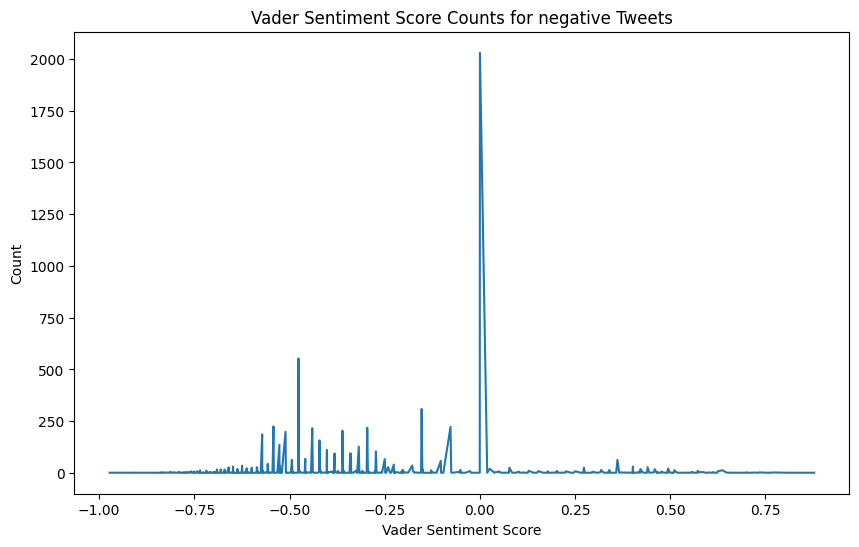

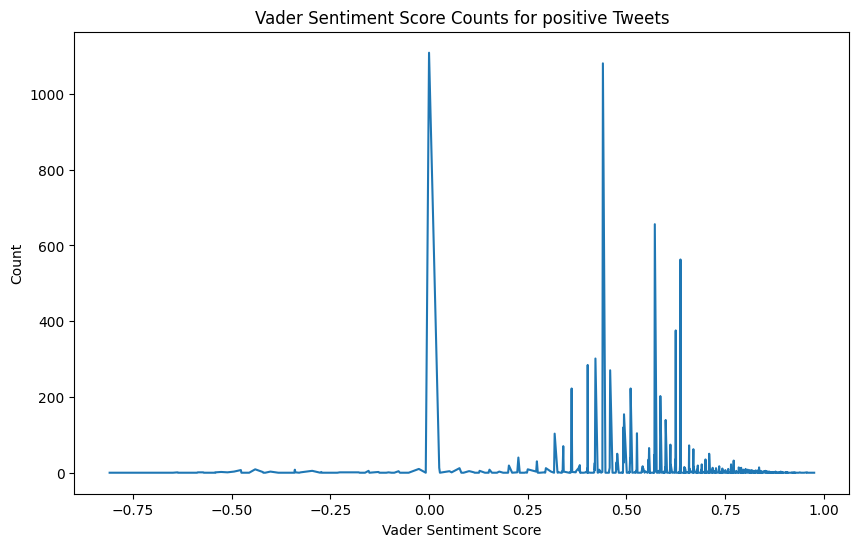

In [ ]:
import matplotlib.pyplot as plt

sentiments = df['sentiment'].unique()

for sentiment in sentiments:

    df_sentiment = df[df['sentiment'] == sentiment]

    score_counts = df_sentiment['sentiment_score_Vader_selected'].value_counts().sort_index()

    plt.figure(figsize=(10, 6))
    plt.plot(score_counts.index, score_counts.values)
    plt.title(f'Vader Sentiment Score Counts for {sentiment} Tweets')
    plt.xlabel('Vader Sentiment Score')
    plt.ylabel('Count')
    plt.show()


wow!! Vader works much better than textBlob lets see the accuracy as well

For this part I am using 3 thresholds, 0.05,0.3,0.5

In [ ]:
df

,textID,text,selected_text,sentiment,tweet_length,word_count,sentiment_score_TextBlob,sentiment_score_TextBlob_selected,sentiment_score_Vader,sentiment_score_Vader_selected
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,36,7,0.000000,0.0,0.0000,0.0000
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,46,10,-0.976562,-0.5,-0.7437,-0.5904
2,088c60f138,my boss is bullying me...,bullying me,negative,25,5,0.000000,0.0,-0.5994,-0.5994
3,9642c003ef,what interview! leave me alone,leave me alone,negative,31,5,0.000000,0.0,-0.3595,-0.2960
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,75,14,0.000000,0.0,0.0000,0.0000
...,...,...,...,...,...,...,...,...,...,...
27476,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,77,16,0.000000,0.0,0.1027,-0.3182
27477,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,122,23,0.184091,0.0,0.3818,0.0000
27478,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,111,22,0.366667,0.7,0.9136,0.7430
27479,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,27,6,0.300000,0.3,0.3291,0.3291


In [ ]:

def categorize_sentiment(score, alpha):
    if score > alpha:
        return 'positive'
    elif -1*alpha <=score <= alpha:
        return 'neutral'
    else:
        return 'negative'

sentiment_scores = ['sentiment_score_TextBlob', 'sentiment_score_Vader',"sentiment_score_Vader_selected","sentiment_score_TextBlob_selected"]

alphas = [0.05, 0.3, 0.5]

for score in sentiment_scores:
    for alpha in alphas:
        df[f'{score}_{alpha}'] = df[score].apply(lambda x: categorize_sentiment(x, alpha))


In [ ]:
print(df.columns)

Index(['textID', 'text', 'selected_text', 'sentiment', 'tweet_length',
       'word_count', 'sentiment_score_TextBlob',
       'sentiment_score_TextBlob_selected', 'sentiment_score_Vader',
       'sentiment_score_Vader_selected', 'sentiment_score_TextBlob_0.05',
       'sentiment_score_TextBlob_0.3', 'sentiment_score_TextBlob_0.5',
       'sentiment_score_Vader_0.05', 'sentiment_score_Vader_0.3',
       'sentiment_score_Vader_0.5', 'sentiment_score_Vader_selected_0.05',
       'sentiment_score_Vader_selected_0.3',
       'sentiment_score_Vader_selected_0.5',
       'sentiment_score_TextBlob_selected_0.05',
       'sentiment_score_TextBlob_selected_0.3',
       'sentiment_score_TextBlob_selected_0.5'],
      dtype='object')


In [ ]:
import numpy as np
from google.colab import autoviz

def scatter_plot(df, x_colname, y_colname, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(6 * figscale, 6 * figscale))
  df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha)
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plot(df, *['sentiment_score_TextBlob', 'sentiment_score_Vader'], **{})
chart

<Figure size 600x600 with 0 Axes>

In [ ]:
import numpy as np
from google.colab import autoviz

def scatter_plot(df, x_colname, y_colname, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(6 * figscale, 6 * figscale))
  df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha)
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plot(df, *['sentiment_score_TextBlob_selected', 'sentiment_score_Vader_selected'], **{})
chart

<Figure size 600x600 with 0 Axes>

Very interesting how selected data has a higher correlation than the whole text!!!

In [ ]:
import numpy as np
from google.colab import autoviz

def scatter_plot(df, x_colname, y_colname, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(6 * figscale, 6 * figscale))
  df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha)
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plot(df, *['sentiment_score_TextBlob_selected', 'sentiment_score_TextBlob'], **{})
chart

<Figure size 600x600 with 0 Axes>

In [ ]:
import numpy as np
from google.colab import autoviz

def scatter_plot(df, x_colname, y_colname, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(6 * figscale, 6 * figscale))
  df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha)
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plot(df, *['sentiment_score_Vader_selected', 'sentiment_score_Vader'], **{})
chart

<Figure size 600x600 with 0 Axes>

Again this is so amazing!!!!!
No matter what that 0 is always going to be a problem but we can see how TextBlob has more unity when using selected vs the whole text than Vader its really interesting now lets see what happens to the accuracy

In [ ]:
df

,textID,text,selected_text,sentiment,tweet_length,word_count,sentiment_score_TextBlob,sentiment_score_TextBlob_selected,sentiment_score_Vader,sentiment_score_Vader_selected,...,sentiment_score_TextBlob_0.5,sentiment_score_Vader_0.05,sentiment_score_Vader_0.3,sentiment_score_Vader_0.5,sentiment_score_Vader_selected_0.05,sentiment_score_Vader_selected_0.3,sentiment_score_Vader_selected_0.5,sentiment_score_TextBlob_selected_0.05,sentiment_score_TextBlob_selected_0.3,sentiment_score_TextBlob_selected_0.5
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,36,7,0.000000,0.0,0.0000,0.0000,...,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,46,10,-0.976562,-0.5,-0.7437,-0.5904,...,negative,negative,negative,negative,negative,negative,negative,negative,negative,neutral
2,088c60f138,my boss is bullying me...,bullying me,negative,25,5,0.000000,0.0,-0.5994,-0.5994,...,neutral,negative,negative,negative,negative,negative,negative,neutral,neutral,neutral
3,9642c003ef,what interview! leave me alone,leave me alone,negative,31,5,0.000000,0.0,-0.3595,-0.2960,...,neutral,negative,negative,neutral,negative,neutral,neutral,neutral,neutral,neutral
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,75,14,0.000000,0.0,0.0000,0.0000,...,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27476,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,77,16,0.000000,0.0,0.1027,-0.3182,...,neutral,positive,neutral,neutral,negative,negative,neutral,neutral,neutral,neutral
27477,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,122,23,0.184091,0.0,0.3818,0.0000,...,neutral,positive,positive,neutral,neutral,neutral,neutral,neutral,neutral,neutral
27478,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,111,22,0.366667,0.7,0.9136,0.7430,...,neutral,positive,positive,positive,positive,positive,positive,positive,positive,positive
27479,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,27,6,0.300000,0.3,0.3291,0.3291,...,neutral,positive,positive,neutral,positive,positive,neutral,positive,neutral,neutral


In [ ]:
from sklearn.metrics import accuracy_score

sentiment_scores = [col for col in df.columns if col.startswith('sentiment_score_TextBlob_0') or col.startswith('sentiment_score_Vader_0')]

for score in sentiment_scores:
    accuracy = accuracy_score(df['sentiment'], df[score])
    print(f'Accuracy of {score}: {accuracy}')


Accuracy of sentiment_score_TextBlob_0.05: 0.5902110625909752
Accuracy of sentiment_score_TextBlob_0.3: 0.5805312954876274
Accuracy of sentiment_score_TextBlob_0.5: 0.506513828238719
Accuracy of sentiment_score_Vader_0.05: 0.6362809315866085
Accuracy of sentiment_score_Vader_0.3: 0.6445414847161572
Accuracy of sentiment_score_Vader_0.5: 0.6069141193595342


In [ ]:

sentiment_scores = [col for col in df.columns if col.startswith('sentiment_score_TextBlob_selected_0') or col.startswith('sentiment_score_Vader_selected_0')]

for score in sentiment_scores:
    accuracy = accuracy_score(df['sentiment'], df[score])
    print(f'Accuracy of {score}: {accuracy}')


Accuracy of sentiment_score_Vader_selected_0.05: 0.6402838427947598
Accuracy of sentiment_score_Vader_selected_0.3: 0.6485443959243086
Accuracy of sentiment_score_Vader_selected_0.5: 0.535844250363901
Accuracy of sentiment_score_TextBlob_selected_0.05: 0.5635371179039301
Accuracy of sentiment_score_TextBlob_selected_0.3: 0.6019286754002912
Accuracy of sentiment_score_TextBlob_selected_0.5: 0.5302037845705968


we can see how the accuracy is much better around 0,05 for both models now indicating how much the model favors neutral responses. So far we have analyzed enough I think so we should do text preprocessing now:

lets look at entry 4, Sons of ****, why couldn`t they put them on t... this is negative but all the analyzers put them as neutral with an exact score of 0, how is that possible? well this really helps us gain vision to dont change the * elements and keep them in our data as it is a great indicator but the new question is would it change if we actually instead of giving the analyzers the whole text, gave them the selected_text? Lets find out :)

casually saving to my drive the eddited file

In [ ]:
"""
import os

# Specify the path to the file
file_path = "/content/drive/MyDrive/train_pardis_NLP_HW1.csv"

# Check if the file exists
if os.path.exists(file_path):
    # Delete the file
    os.remove(file_path)
    print("File deleted.")
else:
    print("The file does not exist.")
"""

File deleted.


In [ ]:
"""
#df.to_csv('train_pardis_clean_newest_all.csv', index=False)
from google.colab import drive
drive.mount('/content/drive')
df.to_csv('/content/drive/MyDrive/train_pardis_NLP_HW1.csv', index=False)
"""

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
"""
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')
# The path to your file on Google Drive
file_path = '/content/drive/MyDrive/train_pardis_NLP_HW1.csv'

# Read the CSV file from Google Drive into a DataFrame
df1 = pd.read_csv(file_path)
"""

Mounted at /content/drive


In [ ]:
df

,textID,text,selected_text,sentiment,tweet_length,word_count,sentiment_score_TextBlob,sentiment_score_TextBlob_selected,sentiment_score_Vader,sentiment_score_Vader_selected,...,cleaned_B_selected_text,cleaned_A_selected_text,cleaned_E_text,cleaned_E_selected_text,cleaned_F_text,cleaned_F_selected_text,cleaned_G_text,cleaned_G_selected_text,cleaned_P_text,cleaned_P_selected_text
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,36,7,0.000000,0.0,0.0000,0.0000,...,respond go,responded going,responded going,responded going,responded going,responded going,responded going,responded going,responded going,responded going
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,46,10,-0.976562,-0.5,-0.7437,-0.5904,...,sooo sad,sooo sad,sooo sad miss san diego,sooo sad,sooo sad miss san diego,sooo sad,so sad miss san diego,so sad,so sad miss san diego,so sad
2,088c60f138,my boss is bullying me...,bullying me,negative,25,5,0.000000,0.0,-0.5994,-0.5994,...,bulli,bullying,bos bullying,bullying,boy bullying,bullying,boy bullying,bullying,boy bullying,bullying
3,9642c003ef,what interview! leave me alone,leave me alone,negative,31,5,0.000000,0.0,-0.3595,-0.2960,...,leav alon,leave alone,interview leave alone,leave alone,interview leave alone,leave alone,interview leave alone,leave alone,interview leave alone,leave alone
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,75,14,0.000000,0.0,0.0000,0.0000,...,son,son,son put release already bought,son,son put release already bought,son,son put release already bought,son,son put release already bought,son
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27475,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,77,16,0.000000,0.0,0.1027,-0.3182,...,lost,lost,wish could come see u denver husband lost job ...,lost,wish could come see u denver husband lost job ...,lost,wish could come see u denver husband lost job ...,lost,wish could come see u denver husband lost job ...,lost
27476,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,122,23,0.184091,0.0,0.3818,0.0000,...,forc,force,wondered rake client made clear net force devs...,force,wondered rake client made clear net force des ...,force,wondered rake client made clear net force des ...,force,wondered rake client made clear net force des ...,force
27477,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,111,22,0.366667,0.7,0.9136,0.7430,...,yay good,yay good,yay good enjoy break probably need hectic week...,yay good,yay good enjoy break probably need hectic week...,yay good,yay good enjoy break probably need hectic week...,yay good,yay good enjoy break probably need hectic week...,yay good
27478,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,27,6,0.300000,0.3,0.3291,0.3291,...,worth,worth,worth,worth,worth,worth,worth,worth,worth,worth


#Preprocessing

In [ ]:
df

,textID,text,selected_text,sentiment,tweet_length,word_count,sentiment_score_TextBlob,sentiment_score_TextBlob_selected,sentiment_score_Vader,sentiment_score_Vader_selected,...,sentiment_score_TextBlob_0.5,sentiment_score_Vader_0.05,sentiment_score_Vader_0.3,sentiment_score_Vader_0.5,sentiment_score_Vader_selected_0.05,sentiment_score_Vader_selected_0.3,sentiment_score_Vader_selected_0.5,sentiment_score_TextBlob_selected_0.05,sentiment_score_TextBlob_selected_0.3,sentiment_score_TextBlob_selected_0.5
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,36,7,0.000000,0.0,0.0000,0.0000,...,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,46,10,-0.976562,-0.5,-0.7437,-0.5904,...,negative,negative,negative,negative,negative,negative,negative,negative,negative,neutral
2,088c60f138,my boss is bullying me...,bullying me,negative,25,5,0.000000,0.0,-0.5994,-0.5994,...,neutral,negative,negative,negative,negative,negative,negative,neutral,neutral,neutral
3,9642c003ef,what interview! leave me alone,leave me alone,negative,31,5,0.000000,0.0,-0.3595,-0.2960,...,neutral,negative,negative,neutral,negative,neutral,neutral,neutral,neutral,neutral
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,75,14,0.000000,0.0,0.0000,0.0000,...,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27476,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,77,16,0.000000,0.0,0.1027,-0.3182,...,neutral,positive,neutral,neutral,negative,negative,neutral,neutral,neutral,neutral
27477,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,122,23,0.184091,0.0,0.3818,0.0000,...,neutral,positive,positive,neutral,neutral,neutral,neutral,neutral,neutral,neutral
27478,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,111,22,0.366667,0.7,0.9136,0.7430,...,neutral,positive,positive,positive,positive,positive,positive,positive,positive,positive
27479,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,27,6,0.300000,0.3,0.3291,0.3291,...,neutral,positive,positive,neutral,positive,positive,neutral,positive,neutral,neutral


In [ ]:
count = df.apply(lambda row: row.astype(str).str.contains('\*').any(), axis=1).sum()
print(f"Number of rows containing '*': {count}")


Number of rows containing '*': 1309


First we

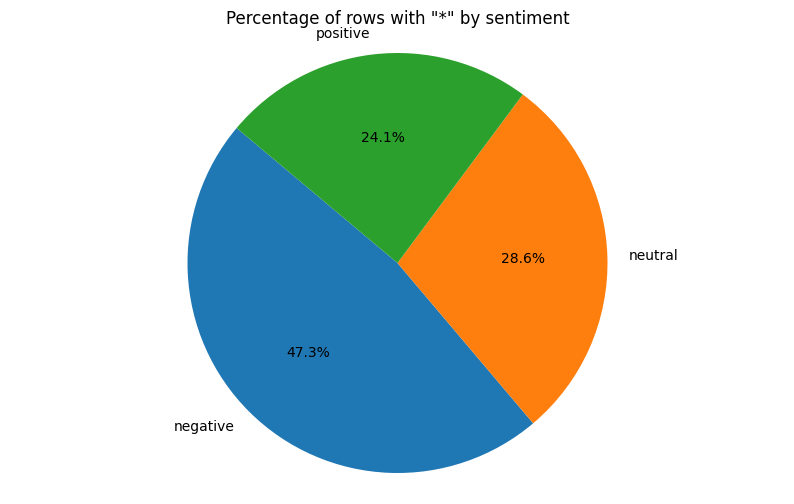

In [ ]:
import matplotlib.pyplot as plt

if 'contains_star' in df.columns:
    df = df.drop(columns=['contains_star'])

df['contains_star'] = df.apply(lambda row: row.astype(str).str.contains('\*').any(), axis=1)

counts = df[df['contains_star']].groupby('sentiment').size()

percentages = counts / counts.sum() * 100

plt.figure(figsize=(10, 6))
plt.pie(percentages, labels=percentages.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')
plt.title('Percentage of rows with "*" by sentiment')
plt.show()

df = df.drop(columns=['contains_star'])


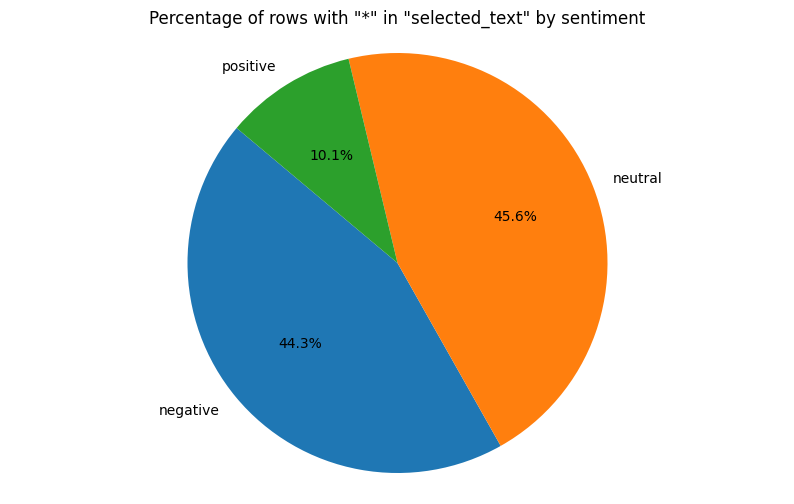

In [ ]:

df['contains_star'] = df['selected_text'].astype(str).str.contains('\*')

counts = df[df['contains_star']].groupby('sentiment').size()

percentages = counts / counts.sum() * 100

plt.figure(figsize=(10, 6))
plt.pie(percentages, labels=percentages.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')
plt.title('Percentage of rows with "*" in "selected_text" by sentiment')
plt.show()

df = df.drop(columns=['contains_star'])


Insults are given in **** format and so does compliments so we cant decide on the importance of * in this texts so we can remove them as well

Now lets see if punctuation matters or not:

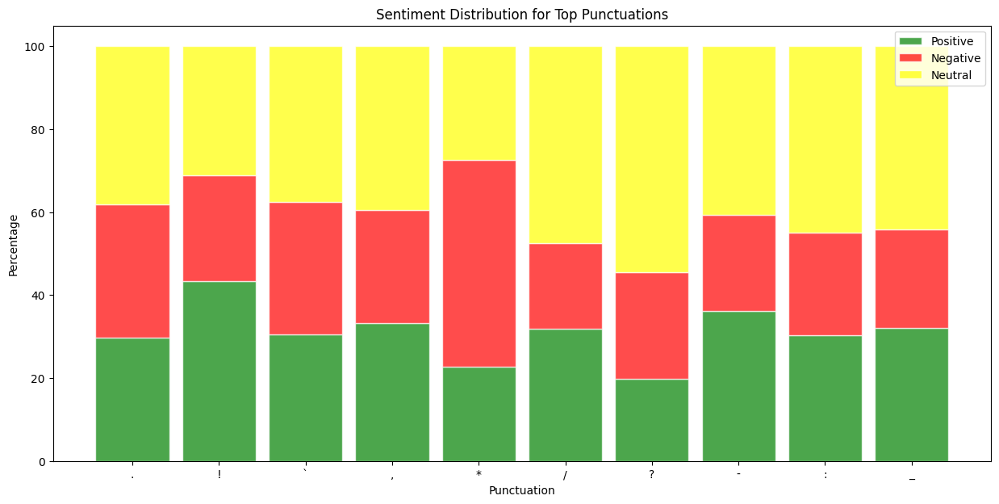

In [ ]:
punctuations = string.punctuation

punctuation_dict = {p:0 for p in punctuations}


for i, row in df.iterrows():
    text = row['text']
    for char in text:
        if char in punctuations:
            punctuation_dict[char] += 1


top_punctuations = dict(Counter(punctuation_dict).most_common(10))


sentiment_dict = {p:{'positive':0, 'negative':0, 'neutral':0} for p in top_punctuations.keys()}


for i, row in df.iterrows():
    text = row['text']
    sentiment = row['sentiment']
    for char in text:
        if char in top_punctuations.keys():
            sentiment_dict[char][sentiment] += 1


labels = sentiment_dict.keys()
positive_counts = [sentiment_dict[punc]['positive'] for punc in labels]
negative_counts = [sentiment_dict[punc]['negative'] for punc in labels]
neutral_counts = [sentiment_dict[punc]['neutral'] for punc in labels]


total_counts = [positive_counts[i] + negative_counts[i] + neutral_counts[i] for i in range(len(labels))]
positive_percentages = [count / total * 100 for count, total in zip(positive_counts, total_counts)]
negative_percentages = [count / total * 100 for count, total in zip(negative_counts, total_counts)]
neutral_percentages = [count / total * 100 for count, total in zip(neutral_counts, total_counts)]


plt.figure(figsize=(15,7))
barWidth = 0.85
plt.bar(labels, positive_percentages, color='green', edgecolor='white', alpha=0.7, width=barWidth, label='Positive')
plt.bar(labels, negative_percentages, bottom=positive_percentages, color='r', edgecolor='white', alpha=0.7, width=barWidth, label='Negative')
plt.bar(labels, neutral_percentages, bottom=[i+j for i,j in zip(positive_percentages, negative_percentages)], color='yellow', edgecolor='white', alpha=0.7, width=barWidth, label='Neutral')

plt.xlabel('Punctuation')
plt.ylabel('Percentage')
plt.legend()
plt.title('Sentiment Distribution for Top Punctuations')
plt.show()


Here are top 10 frequent punctuation and we can see how there is no pattern and we are safe to delete them

Given the lack of unique attributes that would necessitate not using the NLTK stop words, I will continue to utilize this package. For tokenization, I will employ nltk.tokenize and evaluate the outcomes. Additionally, I will conduct both stemming and lemmatizing to assess their impact on improving or reducing accuracy.



In [ ]:
import pandas as pd
df = pd.read_csv('train_pardis.csv')

In [ ]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

def clean_text_A(text):
    # Tokenizes
    words = word_tokenize(text)

    # Make text lowercase
    words = [word.lower() for word in words]

    # Removes hyperlinks
    words = [re.sub(r'http\S+|www.\S+', '', word) for word in words]

    # Removes emojis and other special characters
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Remove punctuation
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Removes numbers
    words = [word for word in words if not word.isdigit()]

    # Removes useless words "stopwords"
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if not word in stop_words]

    # Stemming/Lemmatization
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]

    return ' '.join(words)

df['cleaned_A_text'] = df['text'].apply(clean_text_A)
df['cleaned_A_selected_text'] = df['selected_text'].apply(clean_text_A)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
df

,textID,text,selected_text,sentiment,tweet_length,word_count,sentiment_score_TextBlob,sentiment_score_TextBlob_selected,sentiment_score_Vader,sentiment_score_Vader_selected,...,sentiment_score_Vader_0.05,sentiment_score_Vader_0.3,sentiment_score_Vader_0.5,sentiment_score_Vader_selected_0.05,sentiment_score_Vader_selected_0.3,sentiment_score_Vader_selected_0.5,sentiment_score_TextBlob_selected_0.05,sentiment_score_TextBlob_selected_0.3,sentiment_score_TextBlob_selected_0.5,cleaned_A_text
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,36,7,0.000000,0.0,0.0000,0.0000,...,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,responded going
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,46,10,-0.976562,-0.5,-0.7437,-0.5904,...,negative,negative,negative,negative,negative,negative,negative,negative,neutral,sooo sad miss san diego
2,088c60f138,my boss is bullying me...,bullying me,negative,25,5,0.000000,0.0,-0.5994,-0.5994,...,negative,negative,negative,negative,negative,negative,neutral,neutral,neutral,bos bullying
3,9642c003ef,what interview! leave me alone,leave me alone,negative,31,5,0.000000,0.0,-0.3595,-0.2960,...,negative,negative,neutral,negative,neutral,neutral,neutral,neutral,neutral,interview leave alone
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,75,14,0.000000,0.0,0.0000,0.0000,...,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,son put release already bought
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27475,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,77,16,0.000000,0.0,0.1027,-0.3182,...,positive,neutral,neutral,negative,negative,neutral,neutral,neutral,neutral,wish could come see u denver husband lost job ...
27476,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,122,23,0.184091,0.0,0.3818,0.0000,...,positive,positive,neutral,neutral,neutral,neutral,neutral,neutral,neutral,wondered rake client made clear net force ...
27477,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,111,22,0.366667,0.7,0.9136,0.7430,...,positive,positive,positive,positive,positive,positive,positive,positive,positive,yay good enjoy break probably need hectic we...
27478,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,27,6,0.300000,0.3,0.3291,0.3291,...,positive,positive,neutral,positive,positive,neutral,positive,neutral,neutral,worth


This is the entry 10:

 Both of you

 after doing the cleaning process it will be "" so we must think about it as well another case is There!

In [ ]:
from nltk.stem import PorterStemmer
# Initialize stemmer
stemmer = PorterStemmer()

def clean_text_B(text):
    # Tokenizes
    words = word_tokenize(text)

    # Make text lowercase
    words = [word.lower() for word in words]

    # Removes hyperlinks
    words = [re.sub(r'http\S+|www.\S+', '', word) for word in words]

    # Removes emojis and other special characters
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Remove punctuation
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Removes numbers
    words = [word for word in words if not word.isdigit()]

    # Removes useless words "stopwords"
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if not word in stop_words]

    # Stemming
    words = [stemmer.stem(word) for word in words]

    return ' '.join(words)

# Apply the function to your text column
df['cleaned_B_text'] = df['text'].apply(clean_text_B)
df['cleaned_B_selected_text'] = df['selected_text'].apply(clean_text_B)

In [ ]:
df

,textID,text,selected_text,sentiment,tweet_length,word_count,sentiment_score_TextBlob,sentiment_score_TextBlob_selected,sentiment_score_Vader,sentiment_score_Vader_selected,...,sentiment_score_Vader_0.3,sentiment_score_Vader_0.5,sentiment_score_Vader_selected_0.05,sentiment_score_Vader_selected_0.3,sentiment_score_Vader_selected_0.5,sentiment_score_TextBlob_selected_0.05,sentiment_score_TextBlob_selected_0.3,sentiment_score_TextBlob_selected_0.5,cleaned_A_text,cleaned_B_text
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,36,7,0.000000,0.0,0.0000,0.0000,...,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,responded going,respond go
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,46,10,-0.976562,-0.5,-0.7437,-0.5904,...,negative,negative,negative,negative,negative,negative,negative,neutral,sooo sad miss san diego,sooo sad miss san diego
2,088c60f138,my boss is bullying me...,bullying me,negative,25,5,0.000000,0.0,-0.5994,-0.5994,...,negative,negative,negative,negative,negative,neutral,neutral,neutral,bos bullying,boss bulli
3,9642c003ef,what interview! leave me alone,leave me alone,negative,31,5,0.000000,0.0,-0.3595,-0.2960,...,negative,neutral,negative,neutral,neutral,neutral,neutral,neutral,interview leave alone,interview leav alon
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,75,14,0.000000,0.0,0.0000,0.0000,...,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,son put release already bought,son put releas alreadi bought
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27475,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,77,16,0.000000,0.0,0.1027,-0.3182,...,neutral,neutral,negative,negative,neutral,neutral,neutral,neutral,wish could come see u denver husband lost job ...,wish could come see u denver husband lost job ...
27476,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,122,23,0.184091,0.0,0.3818,0.0000,...,positive,neutral,neutral,neutral,neutral,neutral,neutral,neutral,wondered rake client made clear net force ...,wonder rake client made clear net forc dev...
27477,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,111,22,0.366667,0.7,0.9136,0.7430,...,positive,positive,positive,positive,positive,positive,positive,positive,yay good enjoy break probably need hectic we...,yay good enjoy break probabl need hectic wee...
27478,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,27,6,0.300000,0.3,0.3291,0.3291,...,positive,neutral,positive,positive,neutral,positive,neutral,neutral,worth,worth


In [ ]:

def clean_text_C(text):
    # Tokenizes
    words = word_tokenize(text)

    # Make text lowercase
    words = [word.lower() for word in words]

    # Removes hyperlinks
    words = [re.sub(r'http\S+|www.\S+', '', word) for word in words]

    # Removes emojis and other special characters
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Remove punctuation
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Removes numbers
    words = [word for word in words if not word.isdigit()]

    #Lemmatization
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]

    return ' '.join(words)

df['cleaned_C_text'] = df['text'].apply(clean_text_C)
df['cleaned_C_selected_text'] = df['selected_text'].apply(clean_text_C)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:

# Initialize stemmer
stemmer = PorterStemmer()

def clean_text_D(text):
    # Tokenizes
    words = word_tokenize(text)

    # Make text lowercase
    words = [word.lower() for word in words]

    # Removes hyperlinks
    words = [re.sub(r'http\S+|www.\S+', '', word) for word in words]

    # Removes emojis and other special characters
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Remove punctuation
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Removes numbers
    words = [word for word in words if not word.isdigit()]

    # Stemming
    words = [stemmer.stem(word) for word in words]

    return ' '.join(words)

# Apply the function to your text column
df['cleaned_D_text'] = df['text'].apply(clean_text_D)
df['cleaned_D_selected_text'] = df['selected_text'].apply(clean_text_D)

if after cleaning, you get an empty string replace it with "hi"
spacing problem if you see multiple spaces between words remove the multiple space for example, "hi    ali" to "hi ali"
http problem if you see some http and url please remove them
underscore if you see some underscore slash backslash remove them as well



In [ ]:
def clean_text_E(text):
    # Tokenizes
    words = word_tokenize(text)

    # Make text lowercase
    words = [word.lower() for word in words]

    # Removes hyperlinks
    words = [re.sub(r'http\S+|www.\S+', '', word) for word in words]

    # Removes emojis and other special characters
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Remove punctuation
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Removes numbers
    words = [word for word in words if not word.isdigit()]

    # Removes useless words "stopwords"
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if not word in stop_words]

    # lemmatizer
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]

    cleaned_text = ' '.join(words)

    # If the cleaned text is an empty string, replace it with "hi"
    if cleaned_text.strip() == "":
        cleaned_text = "hi"

    # Removes underscores
    cleaned_text = cleaned_text.replace('_', ' ')

    # Removes multiple spaces
    cleaned_text = re.sub(' +', ' ', cleaned_text)

    return cleaned_text.strip()
df['cleaned_E_text'] = df['text'].apply(clean_text_E)
df['cleaned_E_selected_text'] = df['selected_text'].apply(clean_text_E)

In [ ]:
from spellchecker import SpellChecker
spell = SpellChecker()
misspelled = spell.unknown(["Soooo", "watr", "stud", "wrte"])
for word in misspelled:
    print(spell.correction(word))
    print(spell.candidates(word))

water
{'wart', 'watt', 'water', 'war', 'wat'}
write
{'wre', 'wite', 'wrote', 'write'}


"see wat mean bout foll0w friidays called lose f0llowers friday smh"

we need to fix this misspelling so we use pyspellchecker but it does not handle leetspeak (where numbers are used to represent letters, like ‘foll0w’). If you have a lot of text in this format, you might need a more specialized solution. For example, you could create a custom dictionary to map numbers to their corresponding letters (like {‘0’: ‘o’, ‘1’: ‘i’, …}) and apply this before the spell correction.

In [ ]:
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
import string
import numpy as np
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from spellchecker import SpellChecker
from tqdm import tqdm
tqdm.pandas()

def clean_text_F(text):
    # Leetspeak dictionary
    leet_dict = {'0': 'o', '1': 'i', '3': 'e', '4': 'a', '5': 's', '7': 't'}

    # Replace leetspeak with corresponding letters
    for k, v in leet_dict.items():
        text = text.replace(k, v)

    # Tokenizes
    words = word_tokenize(text)

    # Make text lowercase
    words = [word.lower() for word in words]

    # Removes hyperlinks
    words = [re.sub(r'http\S+|www.\S+', '', word) for word in words]

    # Removes emojis and other special characters
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Remove punctuation
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Removes numbers
    words = [word for word in words if not word.isdigit()]

    # Removes tokens that contain a number
    words = [word for word in words if not any(char.isdigit() for char in word)]

    # Removes useless words "stopwords"
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if not word in stop_words]

    # lemmatizer
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]

    cleaned_text = ' '.join(words)

    # If the cleaned text is an empty string, replace it with "hi"
    if cleaned_text.strip() == "":
        cleaned_text = "hi"

    # Removes underscores
    cleaned_text = cleaned_text.replace('_', ' ')

    # Removes multiple spaces
    cleaned_text = re.sub(' +', ' ', cleaned_text)

    # Spell checking
    spell = SpellChecker()
    corrected_words = []
    for word in cleaned_text.split():
        corrected_word = spell.correction(word)
        if corrected_word is not None:
            corrected_words.append(corrected_word)
        else:
            corrected_words.append("")  # or some default value

    return ' '.join(corrected_words)
import pandas as pd
df = pd.read_csv('train_pardis_clean_new.csv')
df['cleaned_F_text'] = df['text'].progress_apply(clean_text_F)
df['cleaned_F_selected_text'] = df['selected_text'].progress_apply(clean_text_F)

df.to_csv('train_pardis_clean_newest.csv', index=False)

100%|██████████| 27480/27480 [32:24<00:00, 14.13it/s]


In [ ]:
def clean_text_G(text):
    # Leetspeak dictionary
    leet_dict = {'0': 'o', '1': 'i', '3': 'e', '4': 'a', '5': 's', '7': 't'}

    # Replace leetspeak with corresponding letters
    for k, v in leet_dict.items():
        text = text.replace(k, v)

    # Tokenizes
    words = word_tokenize(text)

    # Make text lowercase
    words = [word.lower() for word in words]

    # Removes hyperlinks
    words = [re.sub(r'http\S+|www.\S+', '', word) for word in words]

    # Removes emojis and other special characters
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Remove punctuation
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Removes numbers
    words = [word for word in words if not word.isdigit()]

    # Removes tokens that contain a number
    words = [word for word in words if not any(char.isdigit() for char in word)]

    # Removes useless words "stopwords"
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if not word in stop_words]

    # lemmatizer
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]

    # Removes more than two consecutive repeating characters
    words = [re.sub(r'(.)\1{2,}', r'\1', word) for word in words]

    cleaned_text = ' '.join(words)

    # If the cleaned text is an empty string, replace it with "hi"
    if cleaned_text.strip() == "":
        cleaned_text = "hi"

    # Removes underscores
    cleaned_text = cleaned_text.replace('_', ' ')

    # Removes multiple spaces
    cleaned_text = re.sub(' +', ' ', cleaned_text)

    # Spell checking
    spell = SpellChecker()
    corrected_words = []
    for word in cleaned_text.split():
        corrected_word = spell.correction(word)
        if corrected_word is not None:
            corrected_words.append(corrected_word)
        else:
            corrected_words.append("")

    return ' '.join(corrected_words)
import pandas as pd
df = pd.read_csv('train_pardis_clean_newest.csv')
df['cleaned_G_text'] = df['text'].progress_apply(clean_text_G)
df['cleaned_G_selected_text'] = df['selected_text'].progress_apply(clean_text_G)

df.to_csv('train_pardis_clean_newest_all.csv', index=False)

100%|██████████| 27480/27480 [30:32<00:00, 15.00it/s]


In [ ]:
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
import string
import numpy as np
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer

from spellchecker import SpellChecker
from tqdm import tqdm
tqdm.pandas()


import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from spellchecker import SpellChecker

def clean_text_P(text):
    # Leetspeak dictionary
    leet_dict = {'0': 'o', '1': 'i', '3': 'e', '4': 'a', '5': 's', '7': 't'}

    # Replace leetspeak with corresponding letters
    for k, v in leet_dict.items():
        text = text.replace(k, v)

    # Tokenizes
    words = word_tokenize(text)

    # Make text lowercase
    words = [word.lower() for word in words]

    # Removes hyperlinks
    words = [re.sub(r'http\S+|www.\S+', '', word) for word in words]

    # Removes emojis and other special characters
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Remove punctuation
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Removes numbers
    words = [word for word in words if not word.isdigit()]

    # Removes tokens that contain a number
    words = [word for word in words if not any(char.isdigit() for char in word)]

    # Removes useless words "stopwords"
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if not word in stop_words]

    # lemmatizer
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]

    # Removes more than two consecutive repeating characters
    words = [re.sub(r'(.)\1{2,}', r'\1', word) for word in words]

    cleaned_text = ' '.join(words)

    # If the cleaned text is an empty string, replace it with "hi"
    if cleaned_text.strip() == "":
        cleaned_text = "hi"

    # Removes underscores
    cleaned_text = cleaned_text.replace('_', ' ')

    # Removes multiple spaces
    cleaned_text = re.sub(' +', ' ', cleaned_text)

    # Spell checking
    spell = SpellChecker()
    corrected_words = []
    for word in cleaned_text.split():
        corrected_word = spell.correction(word)
        if corrected_word is not None:
            corrected_words.append(corrected_word)
        else:
            corrected_words.append(word)  # or some default value
    cleaned_text = ' '.join(corrected_words)
    if 'god' not in text.lower() and 'god' in cleaned_text:
        cleaned_text = cleaned_text.replace('god', 'good')
    if cleaned_text.strip() == "":
        cleaned_text = "wall"
    return cleaned_text

import pandas as pd
df['cleaned_P_text'] = df['text'].progress_apply(clean_text_P)
df['cleaned_P_selected_text'] = df['selected_text'].progress_apply(clean_text_P)
df.to_csv('FINAL.csv', index=False)



100%|██████████| 27480/27480 [55:46<00:00,  8.21it/s]


In [ ]:
df = pd.read_csv('train_pardis_clean_new.csv')
df

,textID,text,selected_text,sentiment,tweet_length,word_count,sentiment_score_TextBlob,sentiment_score_TextBlob_selected,sentiment_score_Vader,sentiment_score_Vader_selected,...,cleaned_A_text,cleaned_B_text,cleaned_C_text,cleaned_D_text,cleaned_D_selected_text,cleaned_C_selected_text,cleaned_B_selected_text,cleaned_A_selected_text,cleaned_E_text,cleaned_E_selected_text
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,36,7,0.000000,0.0,0.0000,0.0000,...,responded going,respond go,i d have responded if i were going,i d have respond if i were go,i d have respond if i were go,i d have responded if i were going,respond go,responded going,responded going,responded going
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,46,10,-0.976562,-0.5,-0.7437,-0.5904,...,sooo sad miss san diego,sooo sad miss san diego,sooo sad i will miss you here in san diego,sooo sad i will miss you here in san diego,sooo sad,sooo sad,sooo sad,sooo sad,sooo sad miss san diego,sooo sad
2,088c60f138,my boss is bullying me...,bullying me,negative,25,5,0.000000,0.0,-0.5994,-0.5994,...,bos bullying,boss bulli,my bos is bullying me,my boss is bulli me,bulli me,bullying me,bulli,bullying,bos bullying,bullying
3,9642c003ef,what interview! leave me alone,leave me alone,negative,31,5,0.000000,0.0,-0.3595,-0.2960,...,interview leave alone,interview leav alon,what interview leave me alone,what interview leav me alon,leav me alon,leave me alone,leav alon,leave alone,interview leave alone,leave alone
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,75,14,0.000000,0.0,0.0000,0.0000,...,son put release already bought,son put releas alreadi bought,son of why couldn t they put them on the...,son of whi couldn t they put them on the...,son of,son of,son,son,son put release already bought,son
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27475,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,77,16,0.000000,0.0,0.1027,-0.3182,...,wish could come see u denver husband lost job ...,wish could come see u denver husband lost job ...,wish we could come see u on denver husband los...,wish we could come see u on denver husband los...,d lost,d lost,lost,lost,wish could come see u denver husband lost job ...,lost
27476,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,122,23,0.184091,0.0,0.3818,0.0000,...,wondered rake client made clear net force ...,wonder rake client made clear net forc dev...,i ve wondered about rake to the client ha ma...,i ve wonder about rake to the client ha made...,don t forc,don t force,forc,force,wondered rake client made clear net force devs...,force
27477,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,111,22,0.366667,0.7,0.9136,0.7430,...,yay good enjoy break probably need hectic we...,yay good enjoy break probabl need hectic wee...,yay good for both of you enjoy the break you...,yay good for both of you enjoy the break you...,yay good for both of you,yay good for both of you,yay good,yay good,yay good enjoy break probably need hectic week...,yay good
27478,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,27,6,0.300000,0.3,0.3291,0.3291,...,worth,worth,but it wa worth it,but it wa worth it,but it wa worth it,but it wa worth it,worth,worth,worth,worth


In [ ]:
df

,textID,text,selected_text,sentiment,tweet_length,word_count,sentiment_score_TextBlob,sentiment_score_TextBlob_selected,sentiment_score_Vader,sentiment_score_Vader_selected,...,cleaned_A_text,cleaned_B_text,cleaned_C_text,cleaned_D_text,cleaned_D_selected_text,cleaned_C_selected_text,cleaned_B_selected_text,cleaned_A_selected_text,cleaned_E_text,cleaned_E_selected_text
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,36,7,0.000000,0.0,0.0000,0.0000,...,responded going,respond go,i d have responded if i were going,i d have respond if i were go,i d have respond if i were go,i d have responded if i were going,respond go,responded going,responded going,responded going
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,46,10,-0.976562,-0.5,-0.7437,-0.5904,...,sooo sad miss san diego,sooo sad miss san diego,sooo sad i will miss you here in san diego,sooo sad i will miss you here in san diego,sooo sad,sooo sad,sooo sad,sooo sad,sooo sad miss san diego,sooo sad
2,088c60f138,my boss is bullying me...,bullying me,negative,25,5,0.000000,0.0,-0.5994,-0.5994,...,bos bullying,boss bulli,my bos is bullying me,my boss is bulli me,bulli me,bullying me,bulli,bullying,bos bullying,bullying
3,9642c003ef,what interview! leave me alone,leave me alone,negative,31,5,0.000000,0.0,-0.3595,-0.2960,...,interview leave alone,interview leav alon,what interview leave me alone,what interview leav me alon,leav me alon,leave me alone,leav alon,leave alone,interview leave alone,leave alone
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,75,14,0.000000,0.0,0.0000,0.0000,...,son put release already bought,son put releas alreadi bought,son of why couldn t they put them on the...,son of whi couldn t they put them on the...,son of,son of,son,son,son put release already bought,son
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27475,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,77,16,0.000000,0.0,0.1027,-0.3182,...,wish could come see u denver husband lost job ...,wish could come see u denver husband lost job ...,wish we could come see u on denver husband los...,wish we could come see u on denver husband los...,d lost,d lost,lost,lost,wish could come see u denver husband lost job ...,lost
27476,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,122,23,0.184091,0.0,0.3818,0.0000,...,wondered rake client made clear net force ...,wonder rake client made clear net forc dev...,i ve wondered about rake to the client ha ma...,i ve wonder about rake to the client ha made...,don t forc,don t force,forc,force,wondered rake client made clear net force devs...,force
27477,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,111,22,0.366667,0.7,0.9136,0.7430,...,yay good enjoy break probably need hectic we...,yay good enjoy break probabl need hectic wee...,yay good for both of you enjoy the break you...,yay good for both of you enjoy the break you...,yay good for both of you,yay good for both of you,yay good,yay good,yay good enjoy break probably need hectic week...,yay good
27478,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,27,6,0.300000,0.3,0.3291,0.3291,...,worth,worth,but it wa worth it,but it wa worth it,but it wa worth it,but it wa worth it,worth,worth,worth,worth


In [ ]:
df.to_csv('train_pardis_clean.csv', index=False)

Now we have our cleaned data lets see the feautures we did before and check them with now

# analysis on cleaned data

## Exploring the dataset

In [ ]:
"""import pandas as pd
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')
# The path to your file on Google Drive
file_path = '/content/drive/MyDrive/train_pardis_NLP_HW1.csv'

# Read the CSV file from Google Drive into a DataFrame
df = pd.read_csv(file_path)
"""

Mounted at /content/drive


From 4 columns we now have 30, as we examined many feautures

In [ ]:
print("\nNaN values in the DataFrame:")
print(df.isna().sum())


NaN values in the DataFrame:
textID                                      0
text                                        0
selected_text                               0
sentiment                                   0
tweet_length                                0
word_count                                  0
sentiment_score_TextBlob                    0
sentiment_score_TextBlob_selected           0
sentiment_score_Vader                       0
sentiment_score_Vader_selected              0
sentiment_score_TextBlob_0.05               0
sentiment_score_TextBlob_0.3                0
sentiment_score_TextBlob_0.5                0
sentiment_score_Vader_0.05                  0
sentiment_score_Vader_0.3                   0
sentiment_score_Vader_0.5                   0
sentiment_score_Vader_selected_0.05         0
sentiment_score_Vader_selected_0.3          0
sentiment_score_Vader_selected_0.5          0
sentiment_score_TextBlob_selected_0.05      0
sentiment_score_TextBlob_selected_0.3       0
sent

In [ ]:
df.head()

,textID,text,selected_text,sentiment,tweet_length,word_count,sentiment_score_TextBlob,sentiment_score_TextBlob_selected,sentiment_score_Vader,sentiment_score_Vader_selected,...,cleaned_B_selected_text,cleaned_A_selected_text,cleaned_E_text,cleaned_E_selected_text,cleaned_F_text,cleaned_F_selected_text,cleaned_G_text,cleaned_G_selected_text,cleaned_P_text,cleaned_P_selected_text
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,36,7,0.000000,0.0,0.0000,0.0000,...,respond go,responded going,responded going,responded going,responded going,responded going,responded going,responded going,responded going,responded going
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,46,10,-0.976562,-0.5,-0.7437,-0.5904,...,sooo sad,sooo sad,sooo sad miss san diego,sooo sad,sooo sad miss san diego,sooo sad,so sad miss san diego,so sad,so sad miss san diego,so sad
2,088c60f138,my boss is bullying me...,bullying me,negative,25,5,0.000000,0.0,-0.5994,-0.5994,...,bulli,bullying,bos bullying,bullying,boy bullying,bullying,boy bullying,bullying,boy bullying,bullying
3,9642c003ef,what interview! leave me alone,leave me alone,negative,31,5,0.000000,0.0,-0.3595,-0.2960,...,leav alon,leave alone,interview leave alone,leave alone,interview leave alone,leave alone,interview leave alone,leave alone,interview leave alone,leave alone
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,75,14,0.000000,0.0,0.0000,0.0000,...,son,son,son put release already bought,son,son put release already bought,son,son put release already bought,son,son put release already bought,son


Now we have 27,480 tweets, lets see the plots for the detected sentiments

In [ ]:
df.describe()

,tweet_length,word_count,sentiment_score_TextBlob,sentiment_score_TextBlob_selected,sentiment_score_Vader,sentiment_score_Vader_selected
count,27480.000000,27480.000000,27480.000000,27480.000000,27480.000000,27480.000000
mean,68.330022,12.902875,0.124092,0.107286,0.168773,0.125359
std,35.603870,6.925938,0.359920,0.385185,0.457936,0.402281
min,3.000000,1.000000,-1.000000,-1.000000,-0.972600,-0.972600
25%,39.000000,7.000000,0.000000,0.000000,0.000000,-0.051600
50%,64.000000,12.000000,0.000000,0.000000,0.000000,0.000000
75%,97.000000,18.000000,0.328571,0.300000,0.571900,0.458800
max,141.000000,33.000000,1.000000,1.000000,0.984000,0.975600


So we have a fair share of rach sentiment and our data wouldnt have much bias, lets have a word cloud to see the top words o each sentiment

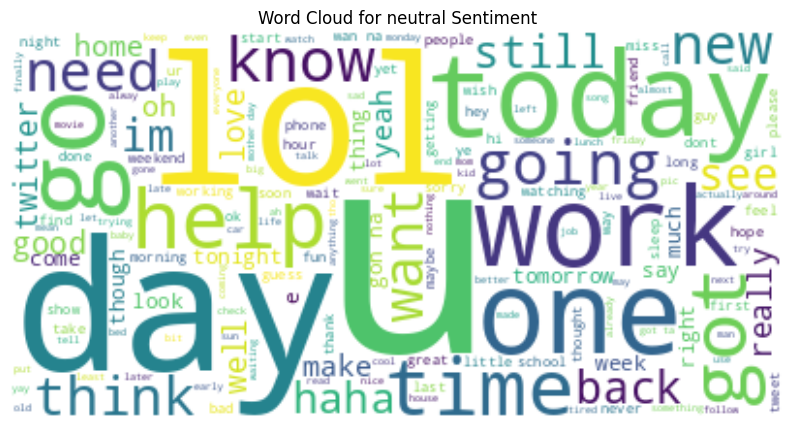

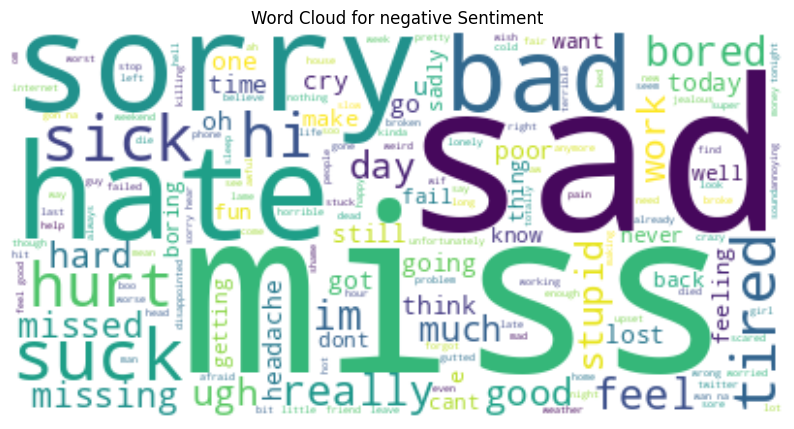

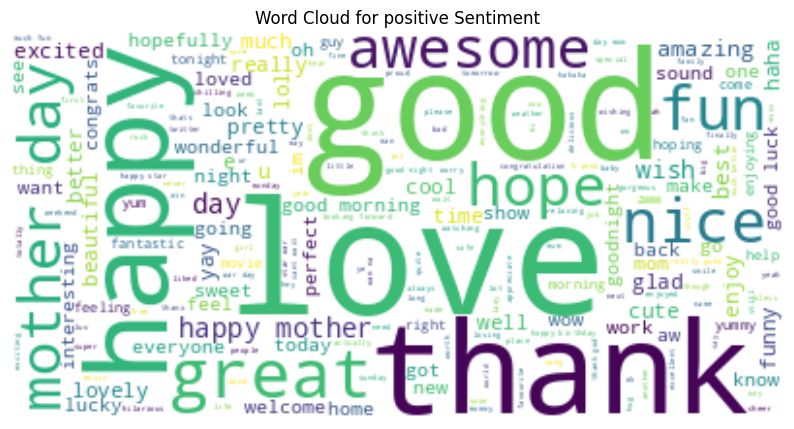

In [ ]:
# Word Cloud for each sentiment
sentiments = df['sentiment'].unique()
for sentiment in sentiments:
    wc = WordCloud(background_color='white').generate(' '.join(df[df['sentiment'] == sentiment]['cleaned_P_selected_text']))
    plt.figure(figsize=(10, 6))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {sentiment} Sentiment')
    plt.show()

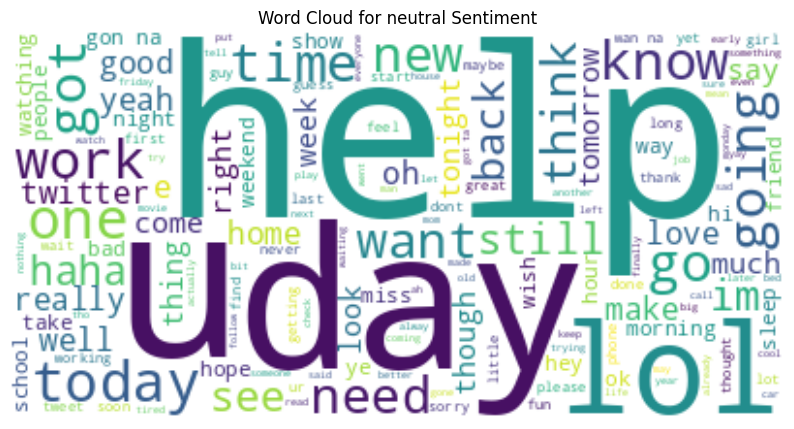

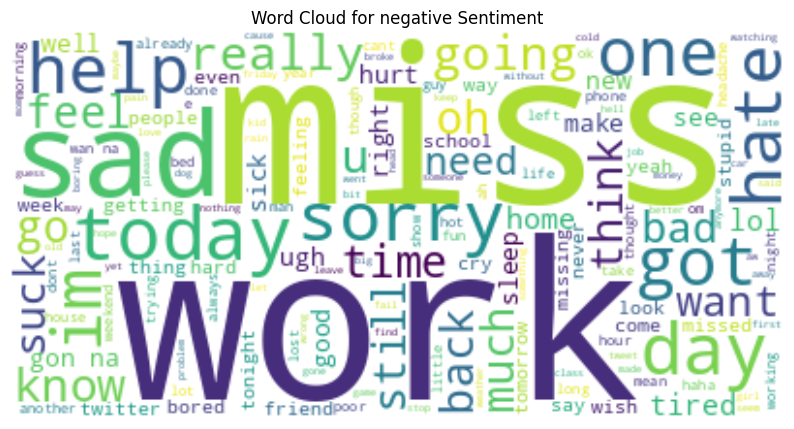

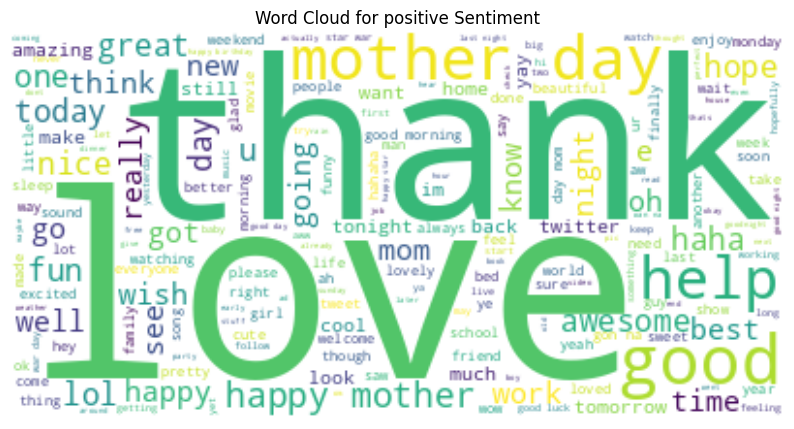

In [ ]:
# Word Cloud for each sentiment
sentiments = df['sentiment'].unique()
for sentiment in sentiments:
    wc = WordCloud(background_color='white').generate(' '.join(df[df['sentiment'] == sentiment]['cleaned_P_text']))
    plt.figure(figsize=(10, 6))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {sentiment} Sentiment')
    plt.show()

In [ ]:
# Top Words in each sentiment
for sentiment in sentiments:
    top_words = pd.Series(' '.join(df[df['sentiment'] == sentiment]['text']).split()).value_counts()[:10]
    print(f'Top words for {sentiment} sentiment:\n{top_words}\n')

Top words for neutral sentiment:
to     4057
I      3365
the    3329
a      2438
my     1800
and    1713
i      1507
in     1501
you    1433
for    1412
dtype: int64

Top words for negative sentiment:
I      2956
to     2838
the    2301
my     1778
a      1758
i      1550
and    1442
is     1245
in     1045
it      889
dtype: int64

Top words for positive sentiment:
to     2914
the    2758
I      2481
a      2305
you    1583
and    1522
my     1354
for    1308
i      1206
is     1065
dtype: int64



In [ ]:
# Top Words in each sentiment
for sentiment in sentiments:
    top_words = pd.Series(' '.join(df[df['sentiment'] == sentiment]['cleaned_P_text']).split()).value_counts()[:10]
    print(f'Top words for {sentiment} sentiment:\n{top_words}\n')

Top words for neutral sentiment:
day      691
get      670
help     654
go       646
i        581
got      537
work     524
lol      499
u        499
going    481
dtype: int64

Top words for negative sentiment:
like     486
get      470
go       455
miss     447
day      435
work     420
sad      402
got      361
sorry    359
im       358
dtype: int64

Top words for positive sentiment:
day       1396
good      1095
love       979
happy      862
mother     671
thanks     570
great      491
help       474
i          470
like       433
dtype: int64



seems like a little more work :( here is the final function

In [ ]:

from tqdm import tqdm
tqdm.pandas()



import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from spellchecker import SpellChecker
import contractions
from bs4 import BeautifulSoup

# slang dictionary
slang_dict = {
    'gg': 'good game',
    'gj': 'good job',
    'gl': 'good luck',
    'gr8': 'great',
    'h8': 'hate',
    'ily': 'I love you',
    'awt': 'adorable',
    'bamf': 'good',
    'ly': 'love you',
    'qt': 'cutie',
    'biatch': 'bad',
    'b****': 'bad',
    'fml': 'bad',
    'stfu': 'bad',
    'pos': 'bad',
    'smdh': 'bad',
    'smh': 'bad',
    'alol': 'good',
    'fomo': 'fear of missing out',
    'fud': 'fear, uncertainty, doubt',
    'fy': 'good',
    'lls': 'laughing like crazy',
    'pita': 'bad',
    'roflcopter': 'good',
    'yaas': 'yes',
    'goals': 'aspirations',
    'lit': 'exciting',
    'flex': 'show off',
    'snatched': 'in shape',
    'boujee': 'high class',

    'cray': 'crazy in a good way',
    'jelly': 'jealous',
    'adorbs': 'adorable',
    'amazeballs': 'amazing',
    'babe': 'endearing term for a woman',
    'baller': 'cool',
    'boo': 'romantic partner',
    'fire': 'really good',
    'legit': 'legitimate',
    'litty': 'exciting',
    'shipping': 'supporting a relationship',
    'slay': 'do really well',
    'yaaas': 'expression of excitement',

    'basic': 'boring',
    'bruh': 'expressing frustration',
    'fugly': 'extremely ugly',
    'hangry': 'angry from hunger',
    'ratchet': 'trashy',
    'salty': 'bitter',
    'thirsty': 'desperate',
    'ghost': 'stop contacting suddenly',
    'janky': 'dysfunctional',
    'woke': 'pretentious',
    'airhead': 'stupid',
    'bummer': 'disappointing',
    'butthurt': 'overly offended',
    'dingus': 'fool',
    'douche': 'jerk',
    'drama queen': 'overly dramatic',
    'dumbass': 'stupid',
    'dumba**': 'stupid',
    'epic fail': 'huge failure',
    'lameoid': 'lame person',
    'loser': 'unsuccessful person',
    'nerd': 'overly intellectual',
    'noob': 'inexperienced',
    'psycho': 'crazy person',
    'shady': 'untrustworthy',
    'trainwreck': 'disaster',
    'try-hard': 'person trying too hard',
}


def clean_text_Final(text):
    # Remove standalone numbers
    text = re.sub(r'\b\d+\b', '', text)

    # Handle contractions
    text = contractions.fix(text)

    # Remove HTML tags
    text = BeautifulSoup(text, "html.parser").get_text()

    # Leetspeak dictionary
    leet_dict = {'0': 'o', '1': 'i', '3': 'e', '4': 'a', '5': 's', '7': 't'}
    # Replace leetspeak with corresponding letters
    for k, v in leet_dict.items():
        text = text.replace(k, v)

    # Replace slang words before tokenization
    text = " ".join(slang_dict.get(word.lower(), word.lower()) for word in text.split())

    # Tokenizes
    words = word_tokenize(text)

    # Make text lowercase
    words = [word.lower() for word in words]

    # Removes hyperlinks
    words = [re.sub(r'http\S+|www.\S+', '', word) for word in words]

    # Removes emojis and other special characters
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Removes tokens that contain a number
    words = [word for word in words if not any(char.isdigit() for char in word)]

    # Removes useless words "stopwords"
    stop_words = set(stopwords.words('english'))

    # List of negative words to keep
    negative_words = ['no', 'not', 'nor', 'neither', 'never', 'none']

    # Remove stop words except the negative ones
    words = [word for word in words if not (word in stop_words and word not in negative_words)]

    # Removes more than two consecutive repeating characters
    words = [re.sub(r'(.)\1{2,}', r'\1', word) for word in words]

    # lemmatizer
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]
    cleaned_text = ' '.join(words)

    # Removes underscores
    cleaned_text = cleaned_text.replace('_', ' ')

    # Removes multiple spaces
    cleaned_text = re.sub(' +', ' ', cleaned_text)

    # Replace null
    if cleaned_text.strip() == "":
        cleaned_text = "wall"

    # Spell checking
    spell = SpellChecker()
    corrected_words = []
    for word in cleaned_text.split():
        corrected_word = spell.correction(word)
        if corrected_word is not None:
            corrected_words.append(corrected_word)
        else:
            corrected_words.append(word)
    cleaned_text = ' '.join(corrected_words)

    # Special case for good
    if 'god' not in text.lower() and 'god' in cleaned_text:
        cleaned_text = cleaned_text.replace('god', 'good')

    return cleaned_text

import pandas as pd


df['cleaned_Final_text'] = df['text'].progress_apply(clean_text_Final)
df['cleaned_Final_selected_text'] = df['selected_text'].progress_apply(clean_text_Final)

df.to_csv('final_finish.csv', index=False)
"""
import os
from google.colab import drive
drive.mount('/content/drive')
# Specify the path to the file
file_path = "/content/drive/MyDrive/train_pardis_NLP_HW1.csv"

# Check if the file exists
if os.path.exists(file_path):
    # Delete the file
    os.remove(file_path)
    print("File deleted.")
else:
    print("The file does not exist.")
#df.to_csv('train_pardis_clean_newest_all.csv', index=False)
#df.to_csv('/content/drive/MyDrive/train_pardis_NLP_HW1.csv', index=False)
#print("done")
"""



  0%|          | 6/27480 [00:01<1:45:44,  4.33it/s]<ipython-input-16-1d3afe9955e4>:102: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  text = BeautifulSoup(text, "html.parser").get_text()
  0%|          | 6/27480 [00:00<26:46, 17.10it/s]<ipython-input-16-1d3afe9955e4>:102: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  text = BeautifulSoup(text, "html.parser").get_text()
100%|██████████| 27480/27480 [50:29<00:00,  9.07it/s]


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
File deleted.
done


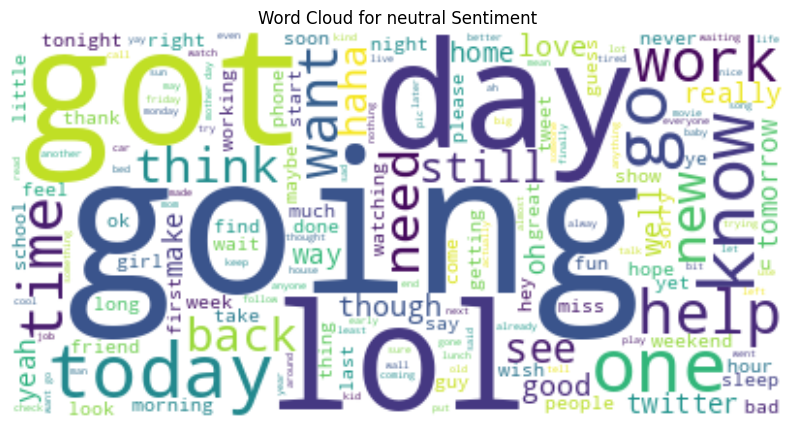

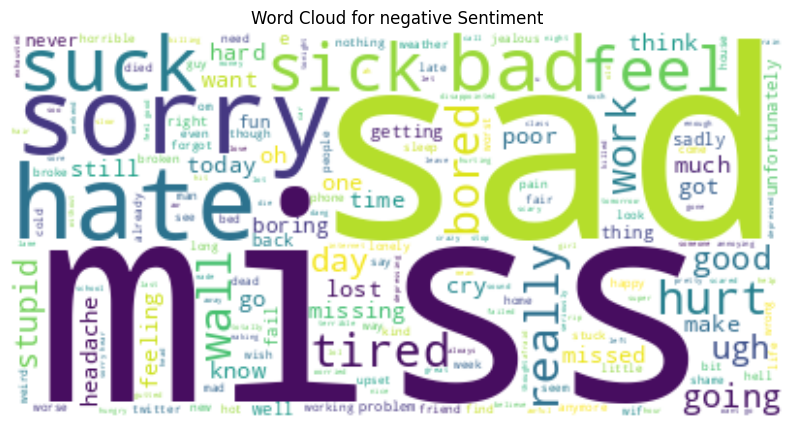

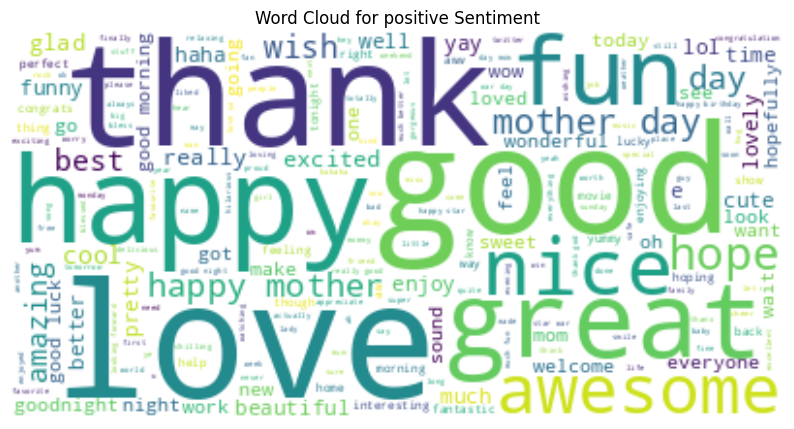

In [ ]:
# Word Cloud for each sentiment
sentiments = df['sentiment'].unique()
for sentiment in sentiments:
    wc = WordCloud(background_color='white').generate(' '.join(df[df['sentiment'] == sentiment]['cleaned_Final_selected_text']))
    plt.figure(figsize=(10, 6))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {sentiment} Sentiment')
    plt.show()

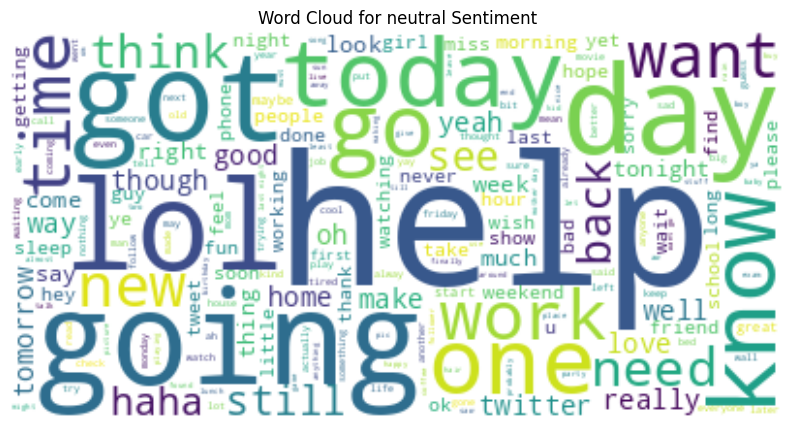

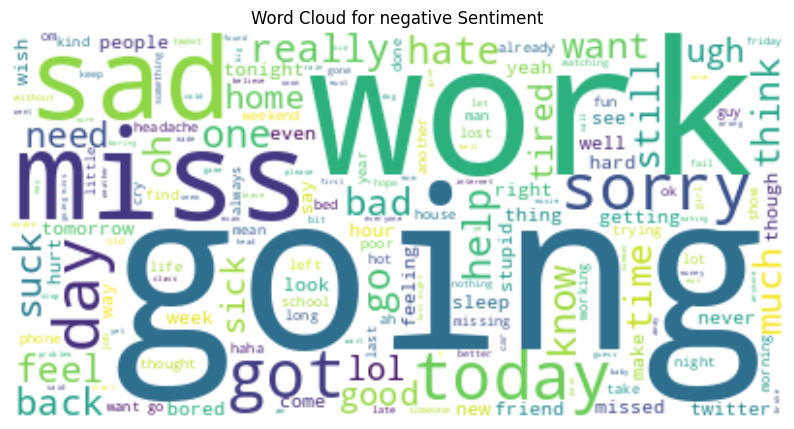

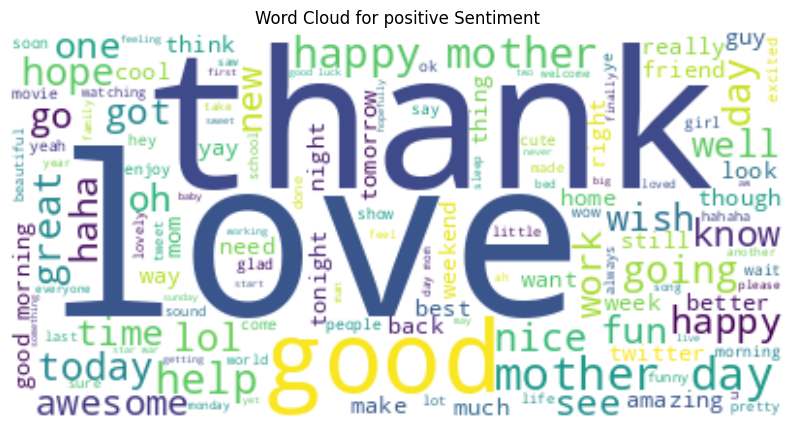

In [ ]:
# Word Cloud for each sentiment
sentiments = df['sentiment'].unique()
for sentiment in sentiments:
    wc = WordCloud(background_color='white').generate(' '.join(df[df['sentiment'] == sentiment]['cleaned_Final_text']))
    plt.figure(figsize=(10, 6))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {sentiment} Sentiment')
    plt.show()

In [ ]:
# Top Words in each sentiment
for sentiment in sentiments:
    top_words = pd.Series(' '.join(df[df['sentiment'] == sentiment]['cleaned_Final_text']).split()).value_counts()[:10]
    print(f'Top words for {sentiment} sentiment:\n{top_words}\n')

Top words for neutral sentiment:
not      1210
get       671
day       670
help      654
going     652
go        644
no        627
i         575
got       537
work      524
dtype: int64

Top words for negative sentiment:
not      1333
no        617
going     515
like      486
get       470
go        454
miss      444
day       425
work      420
sad       402
dtype: int64

Top words for positive sentiment:
day       1378
good      1099
love      1026
happy      862
mother     671
thanks     599
not        523
great      499
help       474
i          468
dtype: int64



In [ ]:
# Top Words in each sentiment
for sentiment in sentiments:
    top_words = pd.Series(' '.join(df[df['sentiment'] == sentiment]['cleaned_Final_selected_text']).split()).value_counts()[:10]
    print(f'Top words for {sentiment} sentiment:\n{top_words}\n')

Top words for neutral sentiment:
not      1195
get       658
day       653
going     643
go        633
no        618
got       525
i         517
work      514
want      487
dtype: int64

Top words for negative sentiment:
not      614
miss     375
sad      346
sorry    303
hate     267
bad      258
no       246
suck     225
feel     173
sick     173
dtype: int64

Top words for positive sentiment:
good       853
love       808
happy      736
day        491
thanks     468
great      374
fun        293
nice       271
mother     270
awesome    256
dtype: int64



In [ ]:
df

,textID,text,selected_text,sentiment,tweet_length,word_count,sentiment_score_TextBlob,sentiment_score_TextBlob_selected,sentiment_score_Vader,sentiment_score_Vader_selected,...,cleaned_E_text,cleaned_E_selected_text,cleaned_F_text,cleaned_F_selected_text,cleaned_G_text,cleaned_G_selected_text,cleaned_P_text,cleaned_P_selected_text,cleaned_Final_text,cleaned_Final_selected_text
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,36,7,0.000000,0.0,0.0000,0.0000,...,responded going,responded going,responded going,responded going,responded going,responded going,responded going,responded going,responded going,responded going
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,46,10,-0.976562,-0.5,-0.7437,-0.5904,...,sooo sad miss san diego,sooo sad,sooo sad miss san diego,sooo sad,so sad miss san diego,so sad,so sad miss san diego,so sad,so sad miss san diego,so sad
2,088c60f138,my boss is bullying me...,bullying me,negative,25,5,0.000000,0.0,-0.5994,-0.5994,...,bos bullying,bullying,boy bullying,bullying,boy bullying,bullying,boy bullying,bullying,boy bullying,bullying
3,9642c003ef,what interview! leave me alone,leave me alone,negative,31,5,0.000000,0.0,-0.3595,-0.2960,...,interview leave alone,leave alone,interview leave alone,leave alone,interview leave alone,leave alone,interview leave alone,leave alone,interview leave alone,leave alone
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,75,14,0.000000,0.0,0.0000,0.0000,...,son put release already bought,son,son put release already bought,son,son put release already bought,son,son put release already bought,son,son put release already bought,son
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27475,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,77,16,0.000000,0.0,0.1027,-0.3182,...,wish could come see u denver husband lost job ...,lost,wish could come see u denver husband lost job ...,lost,wish could come see u denver husband lost job ...,lost,wish could come see u denver husband lost job ...,lost,wish could come see denver husband lost job af...,lost
27476,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,122,23,0.184091,0.0,0.3818,0.0000,...,wondered rake client made clear net force devs...,force,wondered rake client made clear net force des ...,force,wondered rake client made clear net force des ...,force,wondered rake client made clear net force des ...,force,wondered rake client made clear net force des ...,force
27477,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,111,22,0.366667,0.7,0.9136,0.7430,...,yay good enjoy break probably need hectic week...,yay good,yay good enjoy break probably need hectic week...,yay good,yay good enjoy break probably need hectic week...,yay good,yay good enjoy break probably need hectic week...,yay good,yay good enjoy break probably need hectic week...,yay good
27478,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,27,6,0.300000,0.3,0.3291,0.3291,...,worth,worth,worth,worth,worth,worth,worth,worth,worth,worth


Now we want to see if a pattern exists between the length and sentiment or not

lets have a Sentiment Score as well, Sentiment scores are continuous numbers that range from -1 to 1, where -1 represents extremely negative sentiment, 1 represents extremely positive sentiment, and 0 represents neutral sentiment. This allows us to capture varying degrees of positivity or negativity in the text, which might not be possible with categorical sentiment labels alone.

A sentiment scoring tool like TextBlob would capture this difference.

In [ ]:
df

,textID,text,selected_text,sentiment,tweet_length,word_count,sentiment_score_TextBlob,sentiment_score_TextBlob_selected,sentiment_score_Vader,sentiment_score_Vader_selected,...,cleaned_E_selected_text,cleaned_F_text,cleaned_F_selected_text,cleaned_G_text,cleaned_G_selected_text,cleaned_P_text,cleaned_P_selected_text,cleaned_Final_text,cleaned_Final_selected_text,sentiment_score_TextBlob_cleaned
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,36,7,0.000000,0.0,0.0000,0.0000,...,responded going,responded going,responded going,responded going,responded going,responded going,responded going,responded going,responded going,0.000000
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,46,10,-0.976562,-0.5,-0.7437,-0.5904,...,sooo sad,sooo sad miss san diego,sooo sad,so sad miss san diego,so sad,so sad miss san diego,so sad,so sad miss san diego,so sad,-0.500000
2,088c60f138,my boss is bullying me...,bullying me,negative,25,5,0.000000,0.0,-0.5994,-0.5994,...,bullying,boy bullying,bullying,boy bullying,bullying,boy bullying,bullying,boy bullying,bullying,0.000000
3,9642c003ef,what interview! leave me alone,leave me alone,negative,31,5,0.000000,0.0,-0.3595,-0.2960,...,leave alone,interview leave alone,leave alone,interview leave alone,leave alone,interview leave alone,leave alone,interview leave alone,leave alone,0.000000
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,75,14,0.000000,0.0,0.0000,0.0000,...,son,son put release already bought,son,son put release already bought,son,son put release already bought,son,son put release already bought,son,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27475,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,77,16,0.000000,0.0,0.1027,-0.3182,...,lost,wish could come see u denver husband lost job ...,lost,wish could come see u denver husband lost job ...,lost,wish could come see u denver husband lost job ...,lost,wish could come see denver husband lost job af...,lost,0.000000
27476,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,122,23,0.184091,0.0,0.3818,0.0000,...,force,wondered rake client made clear net force des ...,force,wondered rake client made clear net force des ...,force,wondered rake client made clear net force des ...,force,wondered rake client made clear net force des ...,force,0.184091
27477,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,111,22,0.366667,0.7,0.9136,0.7430,...,yay good,yay good enjoy break probably need hectic week...,yay good,yay good enjoy break probably need hectic week...,yay good,yay good enjoy break probably need hectic week...,yay good,yay good enjoy break probably need hectic week...,yay good,0.550000
27478,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,27,6,0.300000,0.3,0.3291,0.3291,...,worth,worth,worth,worth,worth,worth,worth,worth,worth,0.300000


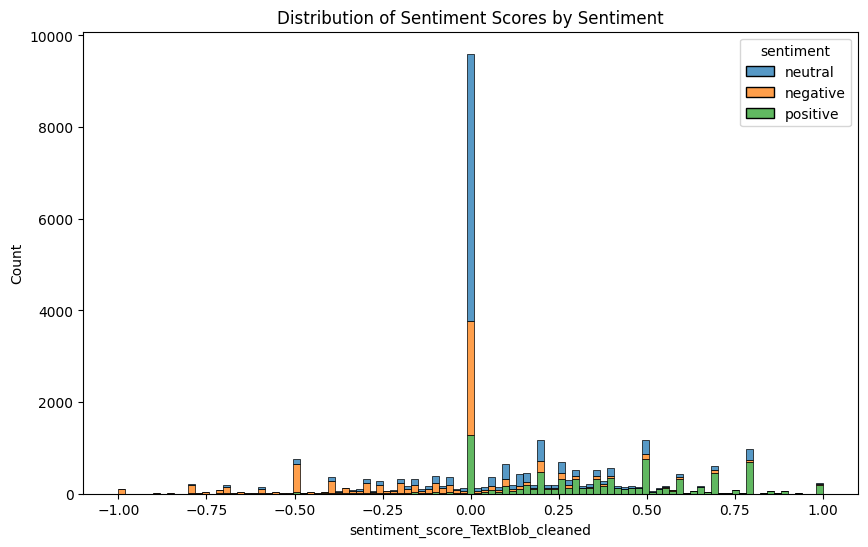

In [ ]:
# Sentiment Score
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from textblob import TextBlob
df['sentiment_score_TextBlob_cleaned'] = df['cleaned_Final_text'].apply(lambda x: TextBlob(x).sentiment.polarity)
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='sentiment_score_TextBlob_cleaned', hue='sentiment', multiple='stack')
plt.title('Distribution of Sentiment Scores by Sentiment')
plt.show()


Lets do a sentiment score for selected text as well

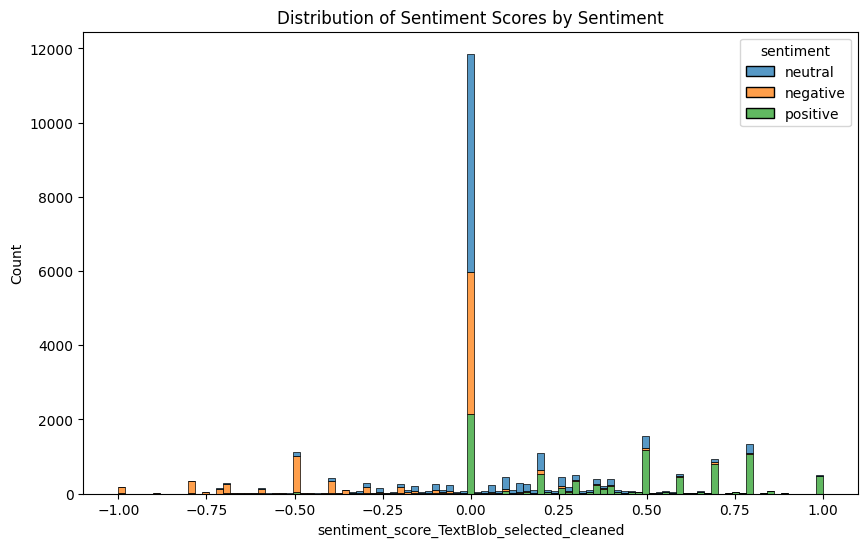

In [ ]:
# Sentiment Score
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from textblob import TextBlob
df['sentiment_score_TextBlob_selected_cleaned'] = df['cleaned_Final_selected_text'].apply(lambda x: TextBlob(x).sentiment.polarity)
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='sentiment_score_TextBlob_selected_cleaned', hue='sentiment', multiple='stack')
plt.title('Distribution of Sentiment Scores by Sentiment')
plt.show()


Funny how Sentiment scores doesnt completly align with our predefined sentiments, lets see some cases:

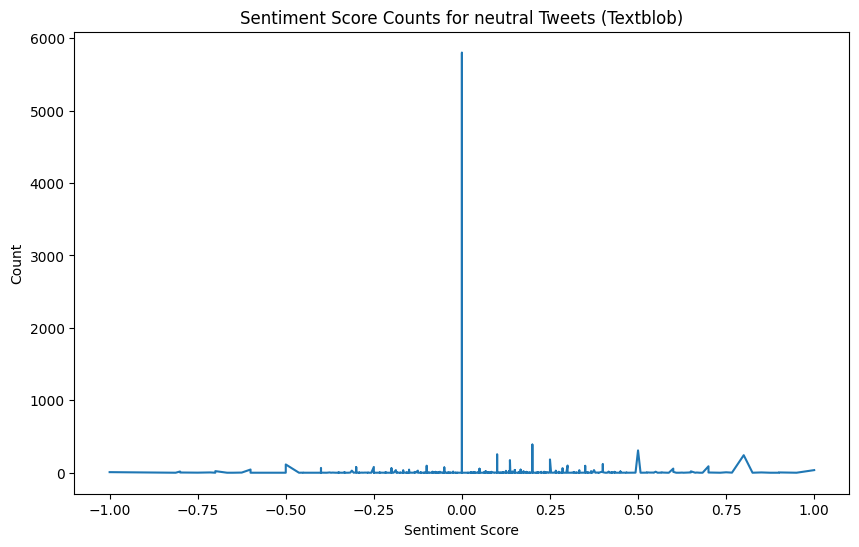

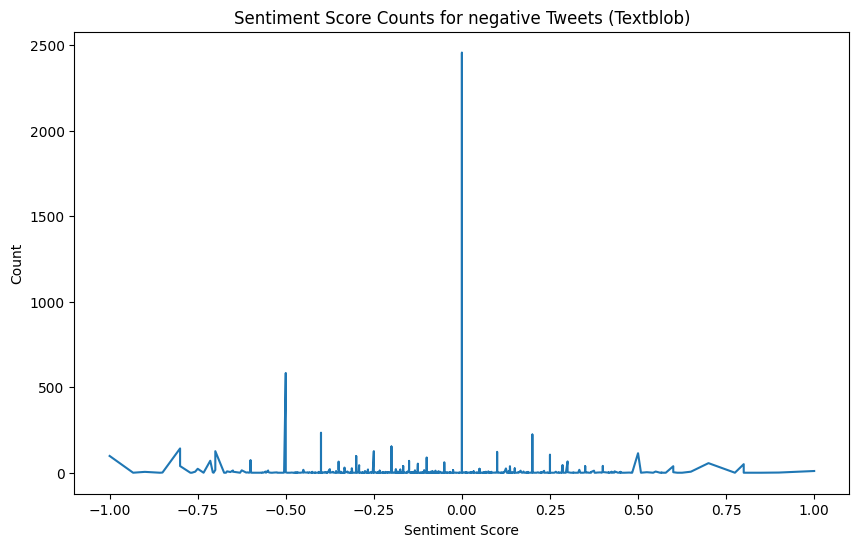

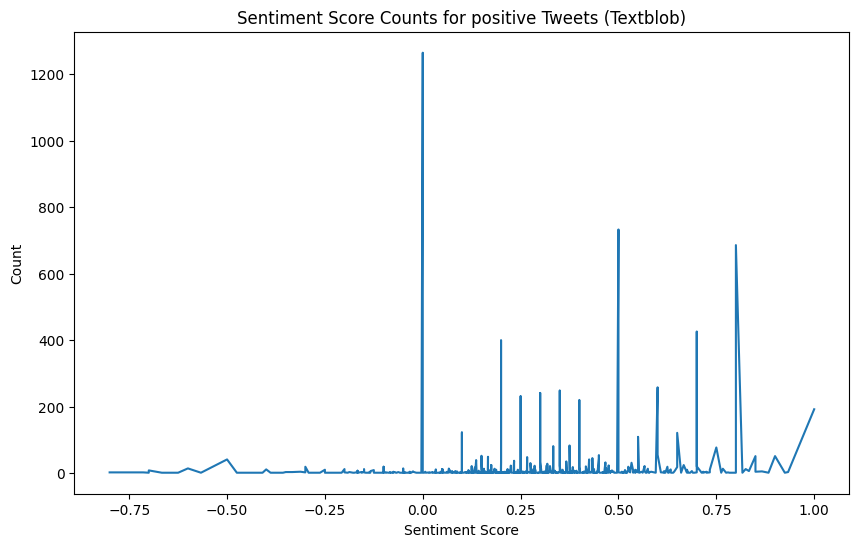

In [ ]:
import matplotlib.pyplot as plt


sentiments = df['sentiment'].unique()


for sentiment in sentiments:
    # Filter the DataFrame for the current sentiment
    df_sentiment = df[df['sentiment'] == sentiment]

    # Calculate the sentiment score counts
    score_counts = df_sentiment['sentiment_score_TextBlob_cleaned'].value_counts().sort_index()

    plt.figure(figsize=(10, 6))
    plt.plot(score_counts.index, score_counts.values)
    plt.title(f'Sentiment Score Counts for {sentiment} Tweets (Textblob)')
    plt.xlabel('Sentiment Score')
    plt.ylabel('Count')
    plt.show()


now for selected text:

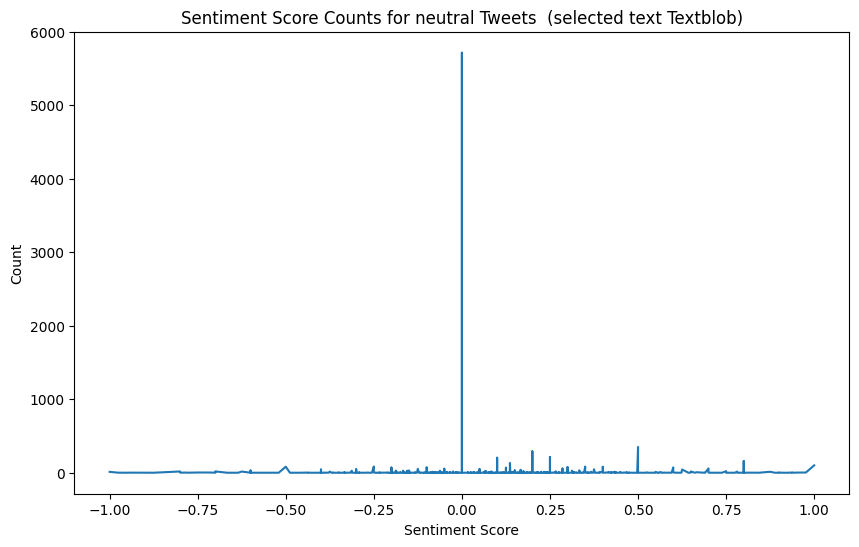

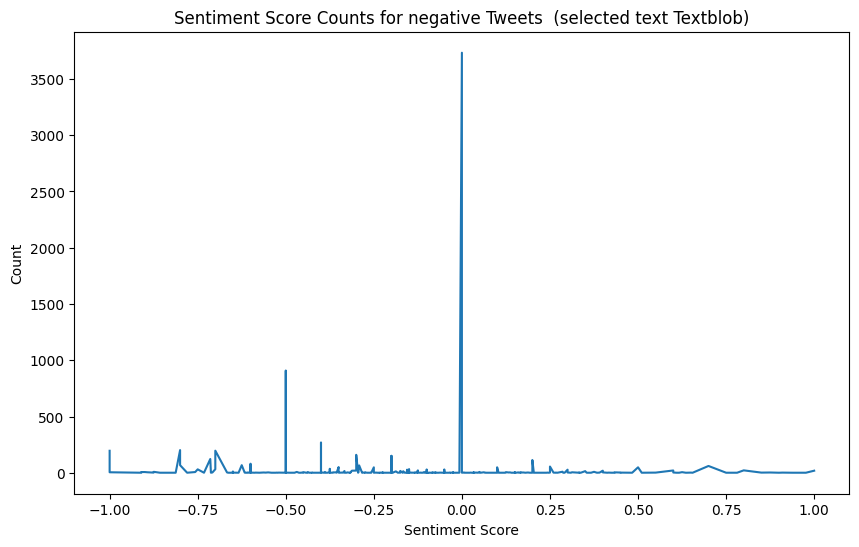

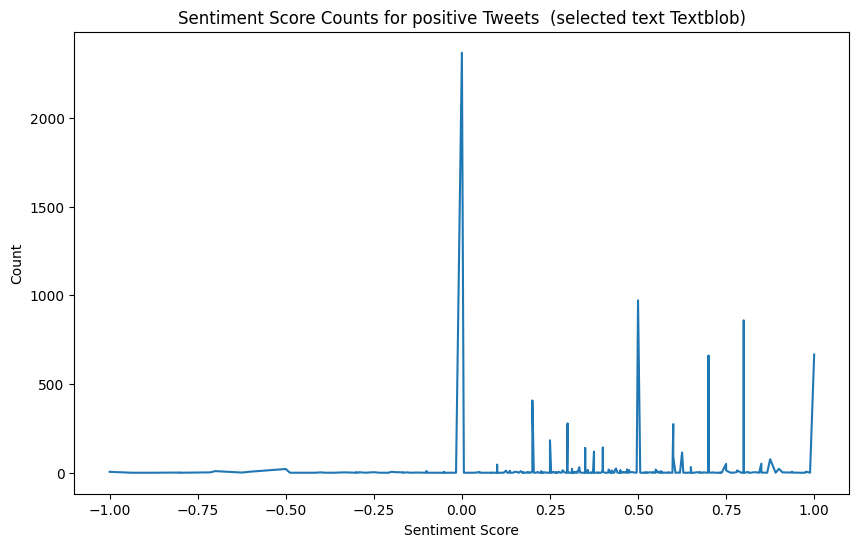

In [ ]:
import matplotlib.pyplot as plt


sentiments = df['sentiment'].unique()

for sentiment in sentiments:
    # Filter the DataFrame for the current sentiment
    df_sentiment = df[df['sentiment'] == sentiment]

    # Calculate the sentiment score counts
    score_counts = df_sentiment['sentiment_score_TextBlob_selected_cleaned'].value_counts().sort_index()

    plt.figure(figsize=(10, 6))
    plt.plot(score_counts.index, score_counts.values)
    plt.title(f'Sentiment Score Counts for {sentiment} Tweets  (selected text Textblob)')
    plt.xlabel('Sentiment Score')
    plt.ylabel('Count')
    plt.show()


We can defintly see the diffrence for the selected text vs the whole text and this shows how important extracting the selected text is

We can see Sentiment scores are mostly 0 (detecting as neutral) while the dataset suggest other wise

really interesting how Sentiment score isnt working !!!

In [ ]:
!pip install vaderSentiment

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 3.2 MB/s eta 0:00:00


In [ ]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

analyzer = SentimentIntensityAnalyzer()

# Calculate VADER sentiment scores
df['sentiment_score_Vader_cleaned'] = df['cleaned_Final_text'].apply(lambda x: analyzer.polarity_scores(x)['compound'])

df


,textID,text,selected_text,sentiment,tweet_length,word_count,sentiment_score_TextBlob,sentiment_score_TextBlob_selected,sentiment_score_Vader,sentiment_score_Vader_selected,...,cleaned_F_selected_text,cleaned_G_text,cleaned_G_selected_text,cleaned_P_text,cleaned_P_selected_text,cleaned_Final_text,cleaned_Final_selected_text,sentiment_score_TextBlob_cleaned,sentiment_score_TextBlob_selected_cleaned,sentiment_score_Vader_cleaned
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,36,7,0.000000,0.0,0.0000,0.0000,...,responded going,responded going,responded going,responded going,responded going,responded going,responded going,0.000000,0.0,0.0000
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,46,10,-0.976562,-0.5,-0.7437,-0.5904,...,sooo sad,so sad miss san diego,so sad,so sad miss san diego,so sad,so sad miss san diego,so sad,-0.500000,-0.5,-0.6453
2,088c60f138,my boss is bullying me...,bullying me,negative,25,5,0.000000,0.0,-0.5994,-0.5994,...,bullying,boy bullying,bullying,boy bullying,bullying,boy bullying,bullying,0.000000,0.0,-0.5994
3,9642c003ef,what interview! leave me alone,leave me alone,negative,31,5,0.000000,0.0,-0.3595,-0.2960,...,leave alone,interview leave alone,leave alone,interview leave alone,leave alone,interview leave alone,leave alone,0.000000,0.0,-0.2960
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,75,14,0.000000,0.0,0.0000,0.0000,...,son,son put release already bought,son,son put release already bought,son,son put release already bought,son,0.000000,0.0,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27475,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,77,16,0.000000,0.0,0.1027,-0.3182,...,lost,wish could come see u denver husband lost job ...,lost,wish could come see u denver husband lost job ...,lost,wish could come see denver husband lost job af...,lost,0.000000,0.0,0.1027
27476,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,122,23,0.184091,0.0,0.3818,0.0000,...,force,wondered rake client made clear net force des ...,force,wondered rake client made clear net force des ...,force,wondered rake client made clear net force des ...,force,0.184091,0.0,0.3818
27477,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,111,22,0.366667,0.7,0.9136,0.7430,...,yay good,yay good enjoy break probably need hectic week...,yay good,yay good enjoy break probably need hectic week...,yay good,yay good enjoy break probably need hectic week...,yay good,0.550000,0.7,0.9136
27478,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,27,6,0.300000,0.3,0.3291,0.3291,...,worth,worth,worth,worth,worth,worth,worth,0.300000,0.3,0.2263


In [ ]:

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

analyzer = SentimentIntensityAnalyzer()

# Calculate VADER sentiment scores
df['sentiment_score_Vader_selected_cleaned'] = df['cleaned_Final_selected_text'].apply(lambda x: analyzer.polarity_scores(x)['compound'])
df


,textID,text,selected_text,sentiment,tweet_length,word_count,sentiment_score_TextBlob,sentiment_score_TextBlob_selected,sentiment_score_Vader,sentiment_score_Vader_selected,...,sentiment_score_TextBlob_selected_cleaned_0.05,sentiment_score_TextBlob_selected_cleaned_0.3,sentiment_score_TextBlob_selected_cleaned_0.5,sentiment_score_Vader_cleaned_0.05,sentiment_score_Vader_cleaned_0.3,sentiment_score_Vader_cleaned_0.5,sentiment_score_Vader_selected_cleaned_0.05,sentiment_score_Vader_selected_cleaned_0.3,sentiment_score_Vader_selected_cleaned_0.5,sentiment_score_Vader_new
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,36,7,0.000000,0.0,0.0000,0.0000,...,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,0.0000
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,46,10,-0.976562,-0.5,-0.7437,-0.5904,...,negative,negative,neutral,negative,negative,negative,negative,negative,negative,-0.7437
2,088c60f138,my boss is bullying me...,bullying me,negative,25,5,0.000000,0.0,-0.5994,-0.5994,...,neutral,neutral,neutral,negative,negative,negative,negative,negative,negative,-0.5994
3,9642c003ef,what interview! leave me alone,leave me alone,negative,31,5,0.000000,0.0,-0.3595,-0.2960,...,neutral,neutral,neutral,negative,neutral,neutral,negative,neutral,neutral,-0.3595
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,75,14,0.000000,0.0,0.0000,0.0000,...,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27475,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,77,16,0.000000,0.0,0.1027,-0.3182,...,neutral,neutral,neutral,positive,neutral,neutral,negative,negative,neutral,0.1027
27476,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,122,23,0.184091,0.0,0.3818,0.0000,...,neutral,neutral,neutral,positive,positive,neutral,neutral,neutral,neutral,0.3818
27477,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,111,22,0.366667,0.7,0.9136,0.7430,...,positive,positive,positive,positive,positive,positive,positive,positive,positive,0.9136
27478,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,27,6,0.300000,0.3,0.3291,0.3291,...,positive,neutral,neutral,positive,neutral,neutral,positive,neutral,neutral,0.3291


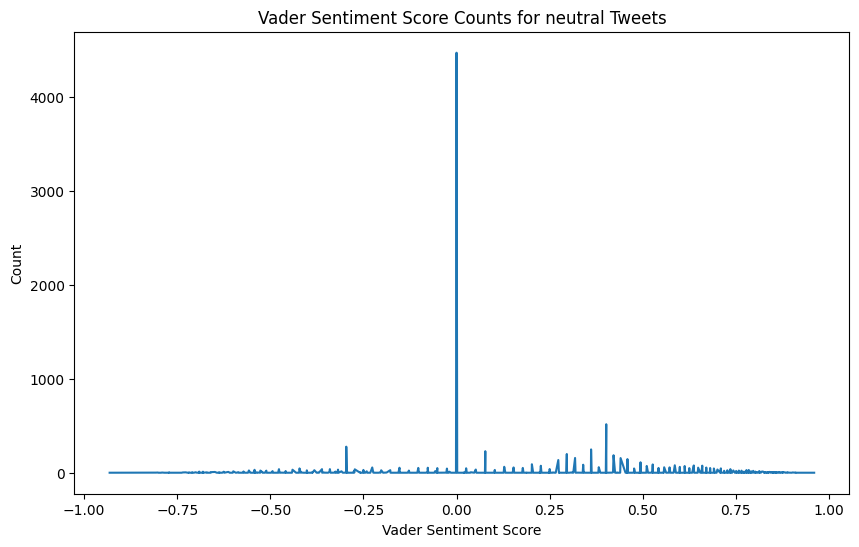

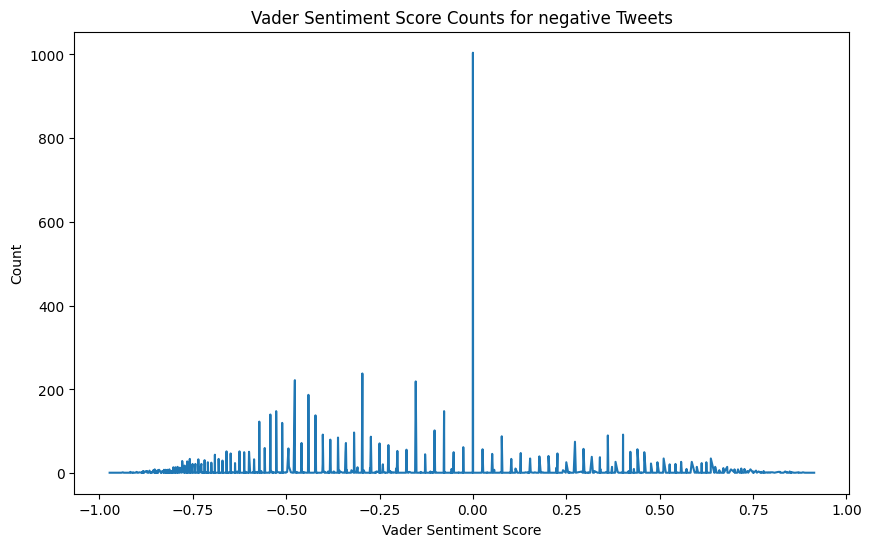

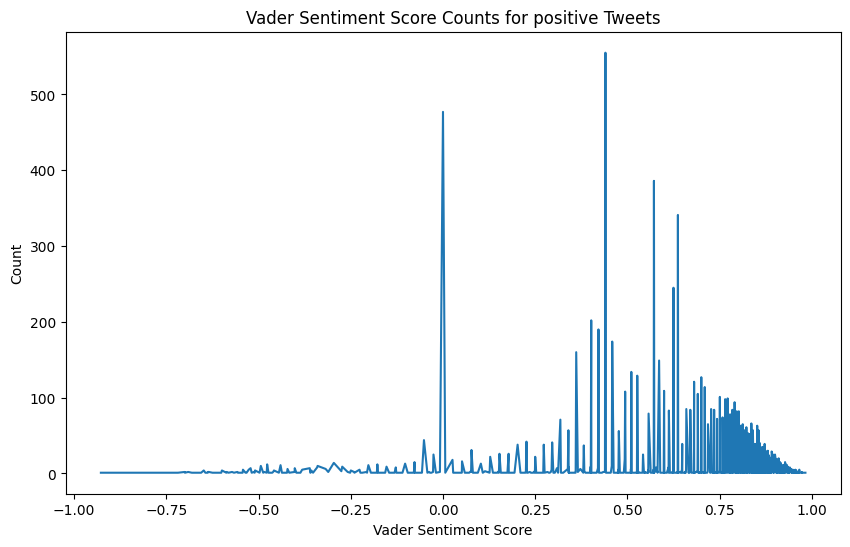

In [ ]:
import matplotlib.pyplot as plt

sentiments = df['sentiment'].unique()

for sentiment in sentiments:
    # Filter the DataFrame for the current sentiment
    df_sentiment = df[df['sentiment'] == sentiment]

    # Calculate the sentiment score counts
    score_counts = df_sentiment['sentiment_score_Vader_cleaned'].value_counts().sort_index()

    plt.figure(figsize=(10, 6))
    plt.plot(score_counts.index, score_counts.values)
    plt.title(f'Vader Sentiment Score Counts for {sentiment} Tweets')
    plt.xlabel('Vader Sentiment Score')
    plt.ylabel('Count')
    plt.show()


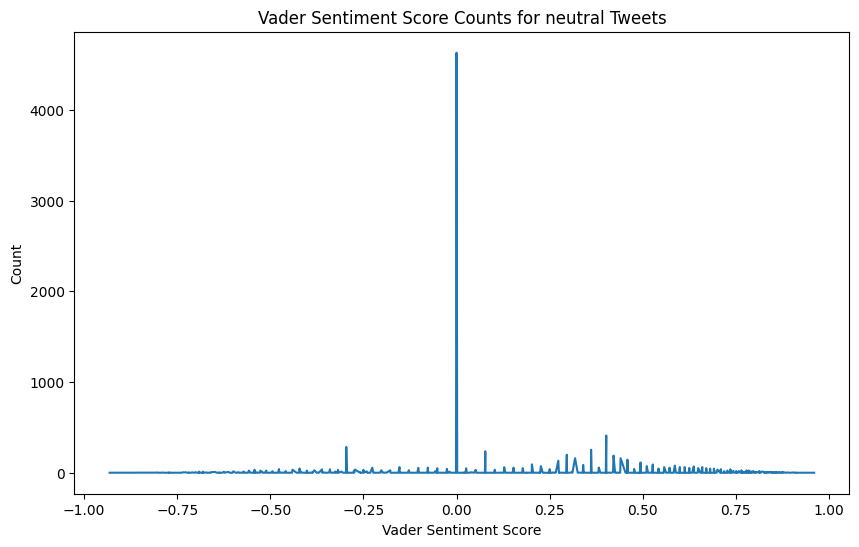

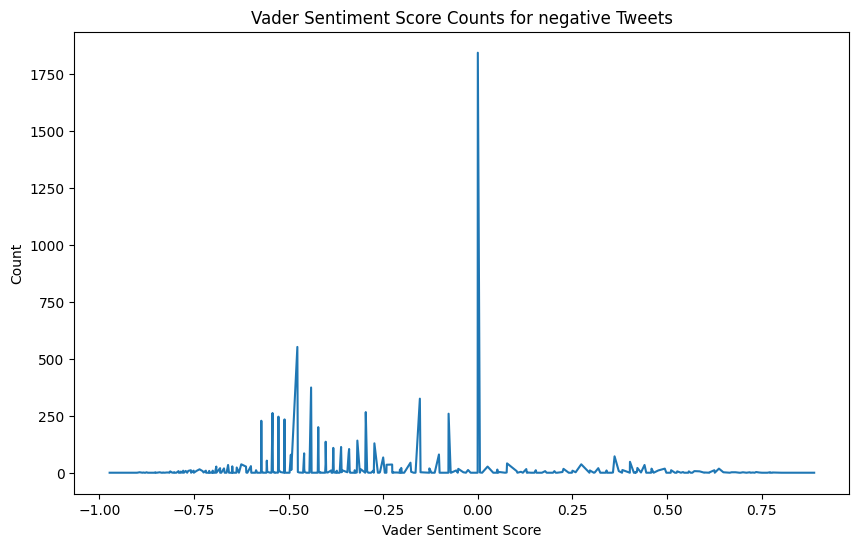

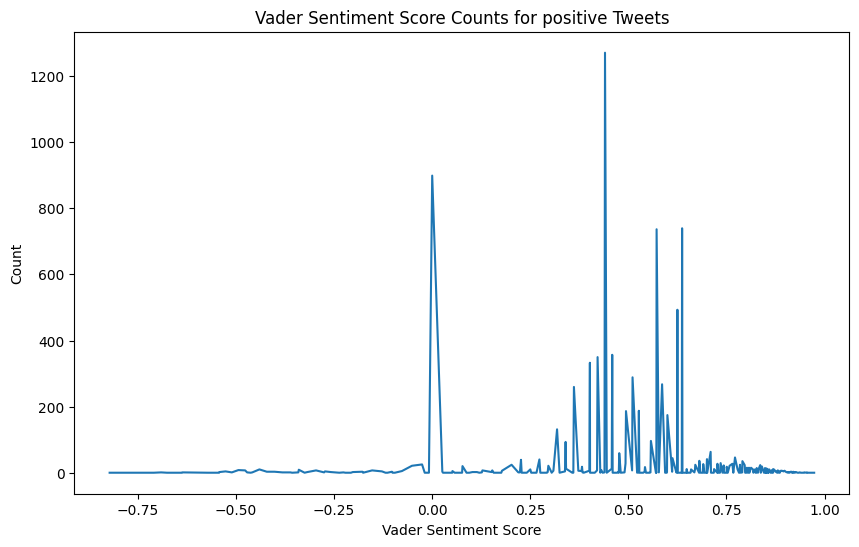

In [ ]:
import matplotlib.pyplot as plt


sentiments = df['sentiment'].unique()

for sentiment in sentiments:

    df_sentiment = df[df['sentiment'] == sentiment]

    # Calculate the sentiment score counts
    score_counts = df_sentiment['sentiment_score_Vader_selected_cleaned'].value_counts().sort_index()

    plt.figure(figsize=(10, 6))
    plt.plot(score_counts.index, score_counts.values)
    plt.title(f'Vader Sentiment Score Counts for {sentiment} Tweets')
    plt.xlabel('Vader Sentiment Score')
    plt.ylabel('Count')
    plt.show()


wow!! Vader works much better than textBlob lets see the accuracy as well

For this part I am using 3 thresholds, 0.05,0.3,0.5

In [ ]:
df

,textID,text,selected_text,sentiment,tweet_length,word_count,sentiment_score_TextBlob,sentiment_score_TextBlob_selected,sentiment_score_Vader,sentiment_score_Vader_selected,...,cleaned_G_text,cleaned_G_selected_text,cleaned_P_text,cleaned_P_selected_text,cleaned_Final_text,cleaned_Final_selected_text,sentiment_score_TextBlob_cleaned,sentiment_score_TextBlob_selected_cleaned,sentiment_score_Vader_cleaned,sentiment_score_Vader_selected_cleaned
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,36,7,0.000000,0.0,0.0000,0.0000,...,responded going,responded going,responded going,responded going,responded going,responded going,0.000000,0.0,0.0000,0.0000
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,46,10,-0.976562,-0.5,-0.7437,-0.5904,...,so sad miss san diego,so sad,so sad miss san diego,so sad,so sad miss san diego,so sad,-0.500000,-0.5,-0.6453,-0.5256
2,088c60f138,my boss is bullying me...,bullying me,negative,25,5,0.000000,0.0,-0.5994,-0.5994,...,boy bullying,bullying,boy bullying,bullying,boy bullying,bullying,0.000000,0.0,-0.5994,-0.5994
3,9642c003ef,what interview! leave me alone,leave me alone,negative,31,5,0.000000,0.0,-0.3595,-0.2960,...,interview leave alone,leave alone,interview leave alone,leave alone,interview leave alone,leave alone,0.000000,0.0,-0.2960,-0.2960
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,75,14,0.000000,0.0,0.0000,0.0000,...,son put release already bought,son,son put release already bought,son,son put release already bought,son,0.000000,0.0,0.0000,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27475,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,77,16,0.000000,0.0,0.1027,-0.3182,...,wish could come see u denver husband lost job ...,lost,wish could come see u denver husband lost job ...,lost,wish could come see denver husband lost job af...,lost,0.000000,0.0,0.1027,-0.3182
27476,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,122,23,0.184091,0.0,0.3818,0.0000,...,wondered rake client made clear net force des ...,force,wondered rake client made clear net force des ...,force,wondered rake client made clear net force des ...,force,0.184091,0.0,0.3818,0.0000
27477,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,111,22,0.366667,0.7,0.9136,0.7430,...,yay good enjoy break probably need hectic week...,yay good,yay good enjoy break probably need hectic week...,yay good,yay good enjoy break probably need hectic week...,yay good,0.550000,0.7,0.9136,0.7430
27478,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,27,6,0.300000,0.3,0.3291,0.3291,...,worth,worth,worth,worth,worth,worth,0.300000,0.3,0.2263,0.2263


In [ ]:

def categorize_sentiment(score, alpha):
    if score > alpha:
        return 'positive'
    elif -1*alpha <=score <= alpha:
        return 'neutral'
    else:
        return 'negative'

# List of sentiment scores
sentiment_scores = ['sentiment_score_TextBlob_cleaned', 'sentiment_score_TextBlob_selected_cleaned',"sentiment_score_Vader_cleaned","sentiment_score_Vader_selected_cleaned"]

# List of alphas
alphas = [0.05, 0.3, 0.5]

for score in sentiment_scores:
    for alpha in alphas:
        df[f'{score}_{alpha}'] = df[score].apply(lambda x: categorize_sentiment(x, alpha))


In [ ]:
print(df.columns)

Index(['textID', 'text', 'selected_text', 'sentiment', 'tweet_length',
       'word_count', 'sentiment_score_TextBlob',
       'sentiment_score_TextBlob_selected', 'sentiment_score_Vader',
       'sentiment_score_Vader_selected', 'sentiment_score_TextBlob_0.05',
       'sentiment_score_TextBlob_0.3', 'sentiment_score_TextBlob_0.5',
       'sentiment_score_Vader_0.05', 'sentiment_score_Vader_0.3',
       'sentiment_score_Vader_0.5', 'sentiment_score_Vader_selected_0.05',
       'sentiment_score_Vader_selected_0.3',
       'sentiment_score_Vader_selected_0.5',
       'sentiment_score_TextBlob_selected_0.05',
       'sentiment_score_TextBlob_selected_0.3',
       'sentiment_score_TextBlob_selected_0.5', 'cleaned_A_text',
       'cleaned_B_text', 'cleaned_C_text', 'cleaned_D_text',
       'cleaned_D_selected_text', 'cleaned_C_selected_text',
       'cleaned_B_selected_text', 'cleaned_A_selected_text', 'cleaned_E_text',
       'cleaned_E_selected_text', 'cleaned_F_text', 'cleaned_F_selected

In [ ]:
import numpy as np
from google.colab import autoviz

def scatter_plot(df, x_colname, y_colname, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(6 * figscale, 6 * figscale))
  df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha)
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plot(df, *['sentiment_score_TextBlob_cleaned', 'sentiment_score_Vader_cleaned'], **{})
chart

<Figure size 600x600 with 0 Axes>

In [ ]:
import numpy as np
from google.colab import autoviz

def scatter_plot(df, x_colname, y_colname, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(6 * figscale, 6 * figscale))
  df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha)
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plot(df, *['sentiment_score_TextBlob_selected_cleaned', 'sentiment_score_Vader_selected_cleaned'], **{})
chart

<Figure size 600x600 with 0 Axes>

Very interesting how selected data has a higher correlation than the whole text!!!

In [ ]:
import numpy as np
from google.colab import autoviz

def scatter_plot(df, x_colname, y_colname, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(6 * figscale, 6 * figscale))
  df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha)
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plot(df, *['sentiment_score_TextBlob_selected_cleaned', 'sentiment_score_TextBlob_cleaned'], **{})
chart

<Figure size 600x600 with 0 Axes>

In [ ]:
import numpy as np
from google.colab import autoviz

def scatter_plot(df, x_colname, y_colname, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(6 * figscale, 6 * figscale))
  df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha)
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plot(df, *['sentiment_score_Vader_selected_cleaned', 'sentiment_score_Vader_cleaned'], **{})
chart

<Figure size 600x600 with 0 Axes>

Again this is so amazing!!!!!
No matter what that 0 is always going to be a problem but we can see how TextBlob has more unity when using selected vs the whole text than Vader its really interesting now lets see what happens to the accuracy

In [ ]:
df

,textID,text,selected_text,sentiment,tweet_length,word_count,sentiment_score_TextBlob,sentiment_score_TextBlob_selected,sentiment_score_Vader,sentiment_score_Vader_selected,...,sentiment_score_TextBlob_cleaned_0.5,sentiment_score_TextBlob_selected_cleaned_0.05,sentiment_score_TextBlob_selected_cleaned_0.3,sentiment_score_TextBlob_selected_cleaned_0.5,sentiment_score_Vader_cleaned_0.05,sentiment_score_Vader_cleaned_0.3,sentiment_score_Vader_cleaned_0.5,sentiment_score_Vader_selected_cleaned_0.05,sentiment_score_Vader_selected_cleaned_0.3,sentiment_score_Vader_selected_cleaned_0.5
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,36,7,0.000000,0.0,0.0000,0.0000,...,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,46,10,-0.976562,-0.5,-0.7437,-0.5904,...,neutral,negative,negative,neutral,negative,negative,negative,negative,negative,negative
2,088c60f138,my boss is bullying me...,bullying me,negative,25,5,0.000000,0.0,-0.5994,-0.5994,...,neutral,neutral,neutral,neutral,negative,negative,negative,negative,negative,negative
3,9642c003ef,what interview! leave me alone,leave me alone,negative,31,5,0.000000,0.0,-0.3595,-0.2960,...,neutral,neutral,neutral,neutral,negative,neutral,neutral,negative,neutral,neutral
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,75,14,0.000000,0.0,0.0000,0.0000,...,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27475,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,77,16,0.000000,0.0,0.1027,-0.3182,...,neutral,neutral,neutral,neutral,positive,neutral,neutral,negative,negative,neutral
27476,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,122,23,0.184091,0.0,0.3818,0.0000,...,neutral,neutral,neutral,neutral,positive,positive,neutral,neutral,neutral,neutral
27477,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,111,22,0.366667,0.7,0.9136,0.7430,...,positive,positive,positive,positive,positive,positive,positive,positive,positive,positive
27478,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,27,6,0.300000,0.3,0.3291,0.3291,...,neutral,positive,neutral,neutral,positive,neutral,neutral,positive,neutral,neutral


In [ ]:
from sklearn.metrics import accuracy_score

sentiment_scores = [col for col in df.columns if col.startswith('sentiment_score_TextBlob_cleaned_0') or col.startswith('sentiment_score_Vader_cleaned_0')]

# Calculate and print accuracy for each sentiment score
for score in sentiment_scores:
    accuracy = accuracy_score(df['sentiment'], df[score])
    print(f'Accuracy of {score}: {accuracy}')


Accuracy of sentiment_score_TextBlob_cleaned_0.05: 0.6
Accuracy of sentiment_score_TextBlob_cleaned_0.3: 0.5826419213973799
Accuracy of sentiment_score_TextBlob_cleaned_0.5: 0.49697962154294034
Accuracy of sentiment_score_Vader_cleaned_0.05: 0.6179403202328967
Accuracy of sentiment_score_Vader_cleaned_0.3: 0.6269286754002911
Accuracy of sentiment_score_Vader_cleaned_0.5: 0.5947962154294032


In [ ]:
from sklearn.metrics import accuracy_score


sentiment_scores = [col for col in df.columns if col.startswith('sentiment_score_TextBlob_selected_cleaned_0') or col.startswith('sentiment_score_Vader_selected_cleaned_0')]

# Calculate and print accuracy for each sentiment score
for score in sentiment_scores:
    accuracy = accuracy_score(df['sentiment'], df[score])
    print(f'Accuracy of {score}: {accuracy}')


Accuracy of sentiment_score_TextBlob_selected_cleaned_0.05: 0.574745269286754
Accuracy of sentiment_score_TextBlob_selected_cleaned_0.3: 0.6127365356622999
Accuracy of sentiment_score_TextBlob_selected_cleaned_0.5: 0.5303857350800583
Accuracy of sentiment_score_Vader_selected_cleaned_0.05: 0.6349708879184862
Accuracy of sentiment_score_Vader_selected_cleaned_0.3: 0.6508005822416303
Accuracy of sentiment_score_Vader_selected_cleaned_0.5: 0.5348981077147016


In [ ]:
from sklearn.metrics import accuracy_score


sentiment_scores = [col for col in df.columns if col.startswith('sentiment_score_TextBlob_0') or col.startswith('sentiment_score_Vader_0')]

# Calculate and print accuracy for each sentiment score
for score in sentiment_scores:
    accuracy = accuracy_score(df['sentiment'], df[score])
    print(f'Accuracy of {score}: {accuracy}')


Accuracy of sentiment_score_TextBlob_0.05: 0.5902110625909752
Accuracy of sentiment_score_TextBlob_0.3: 0.5805312954876274
Accuracy of sentiment_score_TextBlob_0.5: 0.506513828238719
Accuracy of sentiment_score_Vader_0.05: 0.6362809315866085
Accuracy of sentiment_score_Vader_0.3: 0.6445414847161572
Accuracy of sentiment_score_Vader_0.5: 0.6069141193595342


In [ ]:

sentiment_scores = [col for col in df.columns if col.startswith('sentiment_score_TextBlob_selected_0') or col.startswith('sentiment_score_Vader_selected_0')]

# Calculate and print accuracy for each sentiment score
for score in sentiment_scores:
    accuracy = accuracy_score(df['sentiment'], df[score])
    print(f'Accuracy of {score}: {accuracy}')


Accuracy of sentiment_score_Vader_selected_0.05: 0.6402838427947598
Accuracy of sentiment_score_Vader_selected_0.3: 0.6485443959243086
Accuracy of sentiment_score_Vader_selected_0.5: 0.535844250363901
Accuracy of sentiment_score_TextBlob_selected_0.05: 0.5635371179039301
Accuracy of sentiment_score_TextBlob_selected_0.3: 0.6019286754002912
Accuracy of sentiment_score_TextBlob_selected_0.5: 0.5302037845705968


In [ ]:
"""
import os

# Specify the path to the file
file_path = "/content/drive/MyDrive/train_pardis_NLP_HW1.csv"

# Check if the file exists
if os.path.exists(file_path):
    # Delete the file
    os.remove(file_path)
    print("File deleted.")
else:
    print("The file does not exist.")
"""

File deleted.


In [ ]:
df

,textID,text,selected_text,sentiment,tweet_length,word_count,sentiment_score_TextBlob,sentiment_score_TextBlob_selected,sentiment_score_Vader,sentiment_score_Vader_selected,...,sentiment_score_TextBlob_cleaned_0.5,sentiment_score_TextBlob_selected_cleaned_0.05,sentiment_score_TextBlob_selected_cleaned_0.3,sentiment_score_TextBlob_selected_cleaned_0.5,sentiment_score_Vader_cleaned_0.05,sentiment_score_Vader_cleaned_0.3,sentiment_score_Vader_cleaned_0.5,sentiment_score_Vader_selected_cleaned_0.05,sentiment_score_Vader_selected_cleaned_0.3,sentiment_score_Vader_selected_cleaned_0.5
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,36,7,0.000000,0.0,0.0000,0.0000,...,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,46,10,-0.976562,-0.5,-0.7437,-0.5904,...,neutral,negative,negative,neutral,negative,negative,negative,negative,negative,negative
2,088c60f138,my boss is bullying me...,bullying me,negative,25,5,0.000000,0.0,-0.5994,-0.5994,...,neutral,neutral,neutral,neutral,negative,negative,negative,negative,negative,negative
3,9642c003ef,what interview! leave me alone,leave me alone,negative,31,5,0.000000,0.0,-0.3595,-0.2960,...,neutral,neutral,neutral,neutral,negative,neutral,neutral,negative,neutral,neutral
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,75,14,0.000000,0.0,0.0000,0.0000,...,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral,neutral
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27475,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,77,16,0.000000,0.0,0.1027,-0.3182,...,neutral,neutral,neutral,neutral,positive,neutral,neutral,negative,negative,neutral
27476,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,122,23,0.184091,0.0,0.3818,0.0000,...,neutral,neutral,neutral,neutral,positive,positive,neutral,neutral,neutral,neutral
27477,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,111,22,0.366667,0.7,0.9136,0.7430,...,positive,positive,positive,positive,positive,positive,positive,positive,positive,positive
27478,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,27,6,0.300000,0.3,0.3291,0.3291,...,neutral,positive,neutral,neutral,positive,neutral,neutral,positive,neutral,neutral


#additional findings

## first look

crawling my own data:


In [ ]:
"""
function scrapeCommentsWithoutReplies(){
  var ss = SpreadsheetApp.getActiveSpreadsheet();
  var result=[['Name','Comment','Time','Likes','Reply Count']];
  var vid = ss.getSheets()[0].getRange(1,1).getValue();
  var nextPageToken=undefined;

  while(1){
    var data = YouTube.CommentThreads.list('snippet', {videoId: vid, maxResults: 100, pageToken: nextPageToken})
    nextPageToken=data.nextPageToken
    //console.log(nextPageToken);
    for (var row=0; row<data.items.length; row++) {
      result.push([data.items[row].snippet.topLevelComment.snippet.authorDisplayName,
                   data.items[row].snippet.topLevelComment.snippet.textDisplay,
                   data.items[row].snippet.topLevelComment.snippet.publishedAt,
                   data.items[row].snippet.topLevelComment.snippet.likeCount,
                   data.items[row].snippet.totalReplyCount]);
    }
    if(nextPageToken =="" || typeof nextPageToken === "undefined"){
      break;
    }
  }
var newSheet=ss.insertSheet(ss.getNumSheets())
newSheet.getRange(1, 1,result.length,5).setValues(result)

}
"""

doing preprocessing on my new data:

In [ ]:
df = pd.read_csv('Star_wars.csv')
print(df.shape)

(25038, 3)


In [ ]:
df.head(5)

,Name,Comment,Likes
0,CSWF,Garbage,2
1,Mikaミカ,Luke skywalker fought an inter dimensional inc...,0
2,Métis master,Just remembering how naive I was thinking “tha...,1
3,VINIÇÃO YT,Trash.😢,2
4,Dean Esposito,"tbh this trailer was pretty fantastic, it has ...",0


In [ ]:
print("\nNaN values in the DataFrame:")
print(df.isna().sum())


NaN values in the DataFrame:
Name       4
Comment    3
Likes      0
dtype: int64


We found some Nan values lets see what it was and how can we replace it

In [ ]:
print("Rows with NaN values:")
print(df[df.isna().any(axis=1)])

Rows with NaN values:
                  Name                                            Comment  \
5758   Pappuram Godara                                                NaN   
8813               NaN                                        legit shook   
8818               NaN                                     looks fan made   
11014              NaN                 <b>SPOILER ALERT</b> Han Solo dies   
12779       Mo_Taku899                                                NaN   
16290            Na Bo                                                NaN   
22633              NaN  Wait is there gonna be another superweapon?! D...   

       Likes  
5758       0  
8813       0  
8818       0  
11014      1  
12779      0  
16290      0  
22633      0  


we dont have the Text and it is not a numerical value (if it was we could replace it with the mean or median value) and we have many more rows to do the analysis so we remove this Nan value from our dataset

In [ ]:
# Remove the rows where NaN values exist
df.dropna(inplace=True)
print("\nDataFrame after removing NaN values:")
print(df.isna().sum())


DataFrame after removing NaN values:
Name       0
Comment    0
Likes      0
dtype: int64


In [ ]:
print(df.shape)

(25031, 3)


Now we have 25,031 tweets, lets see the histograms for the detected sentiments

In [ ]:
df.describe()

,Likes
count,25031.000000
mean,12.376613
std,136.604014
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,10429.000000


So we have a fair share of rach sentiment and our data wouldnt have much bias, lets have a word cloud to see the top words o each sentiment

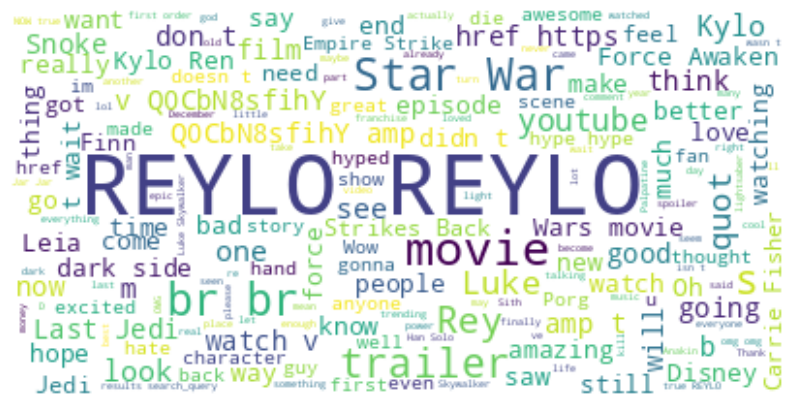

In [ ]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

text = ' '.join(df['Comment'])

wc = WordCloud(background_color='white').generate(text)

# Display the generated image
plt.figure(figsize=(10, 6))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
import pandas as pd
from collections import Counter


words = ' '.join(df['Comment']).split()
word_counts = Counter(words)


top_10_words = word_counts.most_common(10)


print(f'{"Rank":<5}{"Word":<15}{"Frequency"}')
for i, (word, freq) in enumerate(top_10_words, 1):
    print(f'{i:<5}{word:<15}{freq}')


Rank Word           Frequency
1    REYLO          20127
2    the            13091
3    I              6657
4    to             6596
5    is             5780
6    and            5007
7    a              4852
8    this           4299
9    of             3972
10   in             3280


We can see that it looks messy and bad because we need to do some preprocessing on the text for example normalization, removal of stop words,stemming,lemmitization,... But lets continue our EDA and see more like length of tweets and number of words

In [ ]:
df['comment_length'] = df['Comment'].apply(len)
df['word_count'] = df['Comment'].apply(lambda x: len(str(x).split()))

In [ ]:
import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df, *['Likes'], **{})
chart

In [ ]:
import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df, *['word_count'], **{})
chart

In [ ]:
import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df, *['comment_length'], **{})
chart

In [ ]:
import numpy as np
from google.colab import autoviz

def scatter_plot(df, x_colname, y_colname, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(6 * figscale, 6 * figscale))
  df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha)
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plot(df, *['comment_length', 'word_count'], **{})
chart

<Figure size 600x600 with 0 Axes>

Thats really interesting!! but lets see what happens when we see if there is a pattern in here

Calculate the average comment length for each sentiment

In [ ]:
average_length_comment = df['comment_length'].mean()
average_length_word = df['word_count'].mean()
print("Average comment length:\n", average_length_comment)
print("Average word_count:\n", average_length_word)

Average comment length:
 79.34680995565499
Average word_count:
 13.631097439175422


lets have a Sentiment Score as well, Sentiment scores are continuous numbers that range from -1 to 1, where -1 represents extremely negative sentiment, 1 represents extremely positive sentiment, and 0 represents neutral sentiment. This allows us to capture varying degrees of positivity or negativity in the text, which might not be possible with categorical sentiment labels alone.

A sentiment scoring tool like TextBlob would capture this difference.

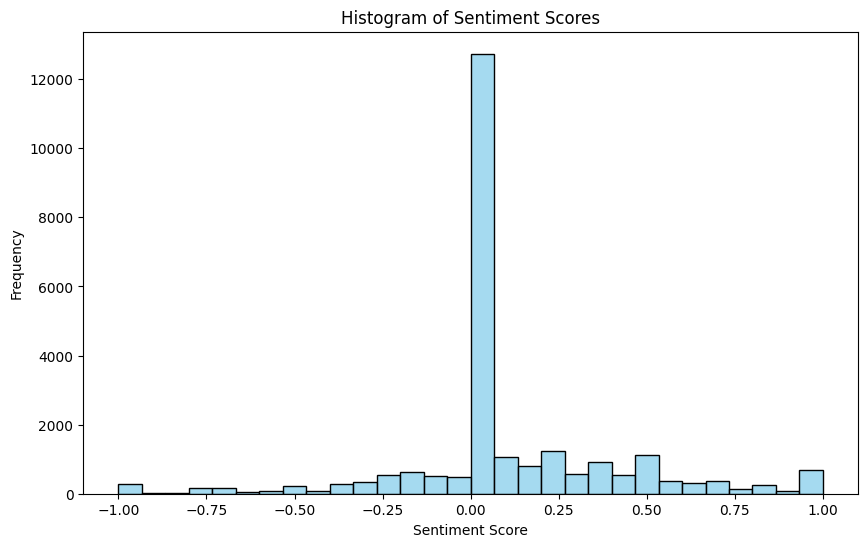

In [ ]:
# Sentiment Score
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from textblob import TextBlob
df['sentiment_score_TextBlob'] = df['Comment'].apply(lambda x: TextBlob(x).sentiment.polarity)
plt.figure(figsize=(10, 6))
sns.histplot(df['sentiment_score_TextBlob'], bins=30, kde=False, color='skyblue')
plt.title('Histogram of Sentiment Scores')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.show()


We can see Sentiment scores are mostly 0 (detecting as neutral) while the dataset suggest other wise

In [ ]:
!pip install vaderSentiment

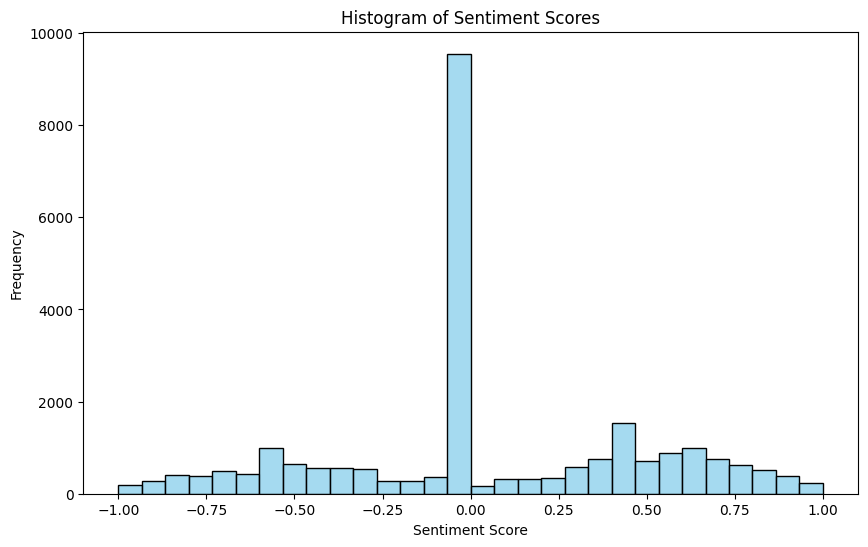

In [ ]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

analyzer = SentimentIntensityAnalyzer()
df['sentiment_score_Vader'] = df['Comment'].apply(lambda x: analyzer.polarity_scores(x)['compound'])
plt.figure(figsize=(10, 6))
sns.histplot(df['sentiment_score_Vader'], bins=30, kde=False, color='skyblue')
plt.title('Histogram of Sentiment Scores')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.show()


For this part I am using 3 thresholds, 0.05,0.3,0.5

In [ ]:
def categorize_sentiment(score, alpha):
    if score > alpha:
        return 'positive'
    elif -1*alpha <=score <= alpha:
        return 'neutral'
    else:
        return 'negative'

# List of sentiment scores
sentiment_scores = ['sentiment_score_TextBlob', 'sentiment_score_Vader']

# List of alphas
alphas = [0.05, 0.3, 0.5]

for score in sentiment_scores:
    for alpha in alphas:
        df[f'{score}_{alpha}'] = df[score].apply(lambda x: categorize_sentiment(x, alpha))


In [ ]:
print(df.columns)

Index(['Name', 'Comment', 'Likes', 'comment_length', 'word_count',
       'sentiment_score_TextBlob', 'sentiment_score_Vader',
       'sentiment_score_TextBlob_0.05', 'sentiment_score_TextBlob_0.3',
       'sentiment_score_TextBlob_0.5', 'sentiment_score_Vader_0.05',
       'sentiment_score_Vader_0.3', 'sentiment_score_Vader_0.5'],
      dtype='object')


In [ ]:
import numpy as np
from google.colab import autoviz

def scatter_plot(df, x_colname, y_colname, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(6 * figscale, 6 * figscale))
  df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha)
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plot(df, *['sentiment_score_TextBlob', 'sentiment_score_Vader'], **{})
chart

<Figure size 600x600 with 0 Axes>

##Preprocessing

Now lets see if punctuation matters or not:

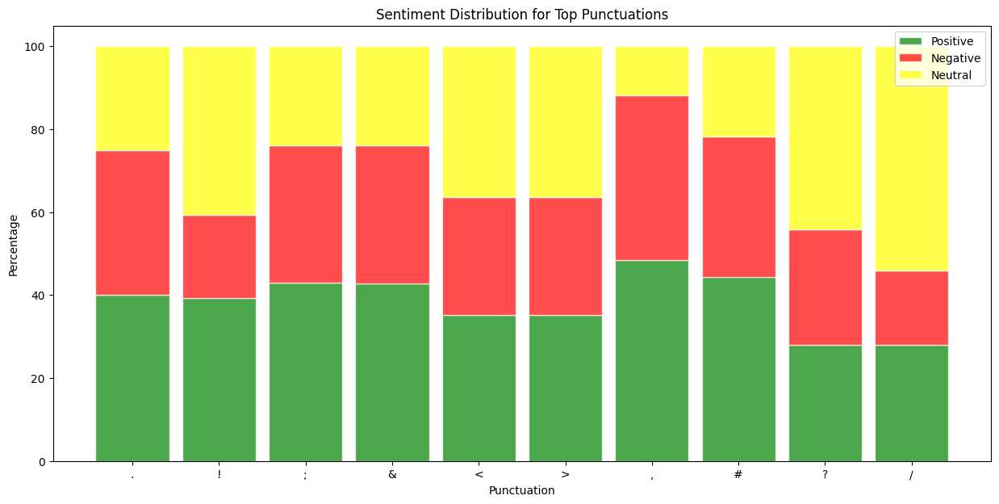

In [ ]:

punctuations = string.punctuation


punctuation_dict = {p:0 for p in punctuations}

for i, row in df.iterrows():
    text = row['Comment']
    for char in text:
        if char in punctuations:
            punctuation_dict[char] += 1

top_punctuations = dict(Counter(punctuation_dict).most_common(10))

sentiment_dict = {p:{'positive':0, 'negative':0, 'neutral':0} for p in top_punctuations.keys()}

for i, row in df.iterrows():
    text = row['Comment']
    sentiment = row['sentiment_score_Vader_0.05']
    for char in text:
        if char in top_punctuations.keys():
            sentiment_dict[char][sentiment] += 1

labels = sentiment_dict.keys()
positive_counts = [sentiment_dict[punc]['positive'] for punc in labels]
negative_counts = [sentiment_dict[punc]['negative'] for punc in labels]
neutral_counts = [sentiment_dict[punc]['neutral'] for punc in labels]


total_counts = [positive_counts[i] + negative_counts[i] + neutral_counts[i] for i in range(len(labels))]
positive_percentages = [count / total * 100 for count, total in zip(positive_counts, total_counts)]
negative_percentages = [count / total * 100 for count, total in zip(negative_counts, total_counts)]
neutral_percentages = [count / total * 100 for count, total in zip(neutral_counts, total_counts)]

# Plot
plt.figure(figsize=(15,7))
barWidth = 0.85
plt.bar(labels, positive_percentages, color='green', edgecolor='white', alpha=0.7, width=barWidth, label='Positive')
plt.bar(labels, negative_percentages, bottom=positive_percentages, color='r', edgecolor='white', alpha=0.7, width=barWidth, label='Negative')
plt.bar(labels, neutral_percentages, bottom=[i+j for i,j in zip(positive_percentages, negative_percentages)], color='yellow', edgecolor='white', alpha=0.7, width=barWidth, label='Neutral')

plt.xlabel('Punctuation')
plt.ylabel('Percentage')
plt.legend()
plt.title('Sentiment Distribution for Top Punctuations')
plt.show()


Here are top 10 frequent punctuation and we can see how there is no pattern and we are safe to delete them

There isnt much unique attribute to not use the NLTK stop words, so I will stick to that package. I will do a stemming and lemmatizing to see how it can increase or decrease accuracy.

In [ ]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize

nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

def clean_text_A(text):
    # Tokenizes
    words = word_tokenize(text)

    # Make text lowercase
    words = [word.lower() for word in words]

    # Removes hyperlinks
    words = [re.sub(r'http\S+|www.\S+', '', word) for word in words]

    # Removes emojis and other special characters
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Remove punctuation
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Removes numbers
    words = [word for word in words if not word.isdigit()]

    return ' '.join(words)

df['cleaned_A_text'] = df['Comment'].apply(clean_text_A)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

def clean_text_A1(text):
    # Tokenizes
    words = word_tokenize(text)

    # Make text lowercase
    words = [word.lower() for word in words]

    # Removes hyperlinks
    words = [re.sub(r'http\S+|www.\S+', '', word) for word in words]

    # Removes emojis and other special characters
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Remove punctuation
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Removes numbers
    words = [word for word in words if not word.isdigit()]

    # Removes useless words "stopwords"
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if not word in stop_words]

    # Stemming/Lemmatization
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]

    return ' '.join(words)

df['cleaned_A1_text'] = df['Comment'].apply(clean_text_A1)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
from nltk.stem import PorterStemmer
stemmer = PorterStemmer()

def clean_text_B(text):
    # Tokenizes
    words = word_tokenize(text)

    # Make text lowercase
    words = [word.lower() for word in words]

    # Removes hyperlinks
    words = [re.sub(r'http\S+|www.\S+', '', word) for word in words]

    # Removes emojis and other special characters
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Remove punctuation
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Removes numbers
    words = [word for word in words if not word.isdigit()]

    # Removes useless words "stopwords"
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if not word in stop_words]

    # Stemming
    words = [stemmer.stem(word) for word in words]

    return ' '.join(words)

df['cleaned_B_text'] = df['Comment'].apply(clean_text_B)

In [ ]:
def clean_text_C(text):
    # Tokenizes
    words = word_tokenize(text)

    # Make text lowercase
    words = [word.lower() for word in words]

    # Removes hyperlinks
    words = [re.sub(r'http\S+|www.\S+', '', word) for word in words]

    # Removes emojis and other special characters
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Remove punctuation
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Removes numbers
    words = [word for word in words if not word.isdigit()]

    # Stemming/Lemmatization
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]

    return ' '.join(words)

df['cleaned_C_text'] = df['Comment'].apply(clean_text_C)


In [ ]:

# Initialize stemmer
stemmer = PorterStemmer()

def clean_text_D(text):
    # Tokenizes
    words = word_tokenize(text)

    # Make text lowercase
    words = [word.lower() for word in words]

    # Removes hyperlinks
    words = [re.sub(r'http\S+|www.\S+', '', word) for word in words]

    # Removes emojis and other special characters
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Remove punctuation
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Removes numbers
    words = [word for word in words if not word.isdigit()]

    # Stemming
    words = [stemmer.stem(word) for word in words]

    return ' '.join(words)
df['cleaned_D_text'] = df['Comment'].apply(clean_text_D)


if after cleaning, you get an empty string replace it with "hi"
spacing problem if you see multiple spaces between words remove the multiple space for example, "hi    ali" to "hi ali"
http problem if you see some http and url please remove them
underscore if you see some underscore slash backslash remove them as well



In [ ]:
def clean_text_E(text):
    # Tokenizes
    words = word_tokenize(text)

    # Make text lowercase
    words = [word.lower() for word in words]

    # Removes hyperlinks
    words = [re.sub(r'http\S+|www.\S+', '', word) for word in words]

    # Removes emojis and other special characters
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Remove punctuation
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Removes numbers
    words = [word for word in words if not word.isdigit()]

    # Removes useless words "stopwords"
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if not word in stop_words]

    # lemmatizer
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]

    cleaned_text = ' '.join(words)

    # If the cleaned text is an empty string, replace it with "hi"
    if cleaned_text.strip() == "":
        cleaned_text = "hi"

    # Removes underscores
    cleaned_text = cleaned_text.replace('_', ' ')

    # Removes multiple spaces
    cleaned_text = re.sub(' +', ' ', cleaned_text)

    return cleaned_text.strip()
df['cleaned_E_text'] = df['Comment'].apply(clean_text_E)

"see wat mean bout foll0w friidays called lose f0llowers friday smh"

we need to fix this misspelling so we use pyspellchecker but it does not handle leetspeak (where numbers are used to represent letters, like ‘foll0w’). If you have a lot of text in this format, you might need a more specialized solution. For example, you could create a custom dictionary to map numbers to their corresponding letters (like {‘0’: ‘o’, ‘1’: ‘i’, …}) and apply this before the spell correction.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
import string
import numpy as np
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from spellchecker import SpellChecker
from tqdm import tqdm
tqdm.pandas()
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from spellchecker import SpellChecker

def clean_text_P(text):
    # Leetspeak dictionary
    leet_dict = {'0': 'o', '1': 'i', '3': 'e', '4': 'a', '5': 's', '7': 't'}

    # Replace leetspeak with corresponding letters
    for k, v in leet_dict.items():
        text = text.replace(k, v)

    # Tokenizes
    words = word_tokenize(text)

    # Make text lowercase
    words = [word.lower() for word in words]

    # Removes hyperlinks
    words = [re.sub(r'http\S+|www.\S+', '', word) for word in words]

    # Removes emojis and other special characters
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Remove punctuation
    words = [re.sub(r'[^\w\s]', '', word) for word in words]

    # Removes numbers
    words = [word for word in words if not word.isdigit()]

    # Removes tokens that contain a number
    words = [word for word in words if not any(char.isdigit() for char in word)]

    # Removes useless words "stopwords"
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if not word in stop_words]

    # lemmatizer
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]

    # Removes more than two consecutive repeating characters
    words = [re.sub(r'(.)\1{2,}', r'\1', word) for word in words]

    cleaned_text = ' '.join(words)

    # If the cleaned text is an empty string, replace it with "hi"
    if cleaned_text.strip() == "":
        cleaned_text = "hi"

    # Removes underscores
    cleaned_text = cleaned_text.replace('_', ' ')

    # Removes multiple spaces
    cleaned_text = re.sub(' +', ' ', cleaned_text)

    # Spell checking
    spell = SpellChecker()
    corrected_words = []
    for word in cleaned_text.split():
        corrected_word = spell.correction(word)
        if corrected_word is not None:
            corrected_words.append(corrected_word)
        else:
            corrected_words.append(word)
    cleaned_text = ' '.join(corrected_words)
    if 'god' not in text.lower() and 'god' in cleaned_text:
        cleaned_text = cleaned_text.replace('god', 'good')
    if cleaned_text.strip() == "":
        cleaned_text = "wall"
    return cleaned_text

import pandas as pd
df['cleaned_P_text'] = df['Comment'].progress_apply(clean_text_P)
df.to_csv('FINAL_star.csv', index=False)



100%|██████████| 25031/25031 [1:22:46<00:00,  5.04it/s]


In [ ]:
df = pd.read_csv('FINAL_star.csv')
df

,Name,Comment,Likes,comment_length,word_count,sentiment_score_TextBlob,sentiment_score_Vader,sentiment_score_TextBlob_0.05,sentiment_score_TextBlob_0.3,sentiment_score_TextBlob_0.5,sentiment_score_Vader_0.05,sentiment_score_Vader_0.3,sentiment_score_Vader_0.5,cleaned_A_text,cleaned_A1_text,cleaned_B_text,cleaned_C_text,cleaned_D_text,cleaned_E_text,cleaned_P_text
0,CSWF,Garbage,2,7,1,0.000000,0.0000,neutral,neutral,neutral,neutral,neutral,neutral,garbage,garbage,garbag,garbage,garbag,garbage,garbage
1,Mikaミカ,Luke skywalker fought an inter dimensional inc...,0,146,25,0.000000,-0.4588,neutral,neutral,neutral,negative,negative,neutral,luke skywalker fought an inter dimensional inc...,luke skywalker fought inter dimensional incarn...,luke skywalk fought inter dimension incarn cha...,luke skywalker fought an inter dimensional inc...,luke skywalk fought an inter dimension incarn ...,luke skywalker fought inter dimensional incarn...,luke skywalker fought inter dimensional incarn...
2,Métis master,Just remembering how naive I was thinking “tha...,1,124,21,0.166667,0.8689,positive,neutral,neutral,positive,positive,positive,just remembering how naive i was thinking tha...,remembering naive thinking fun everyone gon...,rememb naiv think fun everyon gon na love ...,just remembering how naive i wa thinking that...,just rememb how naiv i wa think that wa fun ...,remembering naive thinking fun everyone gon na...,remembering naive thinking fun everyone gon na...
3,VINIÇÃO YT,Trash.😢,2,7,1,0.000000,-0.4767,neutral,neutral,neutral,negative,negative,neutral,trash,trash,trash,trash,trash,trash,trash
4,Dean Esposito,"tbh this trailer was pretty fantastic, it has ...",0,112,20,0.304167,0.8479,positive,positive,neutral,positive,positive,positive,tbh this trailer was pretty fantastic it has ...,tbh trailer pretty fantastic subtle hint thin...,tbh trailer pretti fantast subtl hint thing m...,tbh this trailer wa pretty fantastic it ha su...,tbh thi trailer wa pretti fantast it ha subtl...,tbh trailer pretty fantastic subtle hint thing...,tbe trailer pretty fantastic subtle hint thing...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25026,Antoine Monod,Han shot first,0,14,3,0.250000,0.0000,positive,neutral,neutral,neutral,neutral,neutral,han shot first,han shot first,han shot first,han shot first,han shot first,han shot first,han shot first
25027,JaydenXV,YYEWSSSSSSSSSSSSSSSS,0,20,1,0.000000,0.0000,neutral,neutral,neutral,neutral,neutral,neutral,yyewssssssssssssssss,yyewssssssssssssssss,yyewssssssssssssssss,yyewssssssssssssssss,yyewssssssssssssssss,yyewssssssssssssssss,eyes
25028,Foofoo14,All aboard the hype train!,1,26,5,0.000000,0.1007,neutral,neutral,neutral,positive,neutral,neutral,all aboard the hype train,aboard hype train,aboard hype train,all aboard the hype train,all aboard the hype train,aboard hype train,aboard hype train
25029,Matias Guzman,I miss Carrie Fisher :&#39;(,0,28,5,0.000000,-0.1531,neutral,neutral,neutral,negative,neutral,neutral,i miss carrie fisher,miss carrie fisher,miss carri fisher,i miss carrie fisher,i miss carri fisher,miss carrie fisher,miss carrie fisher


In [ ]:
from tqdm import tqdm
tqdm.pandas()
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from spellchecker import SpellChecker
import contractions
from bs4 import BeautifulSoup

# slang dictionary
slang_dict = {

    'gr8': 'great',
    'h8': 'hate',
    'ily': 'I love you',
    'lol': 'laugh out loud',
    'omg': 'oh my god',
    'plz': 'please',
    'thx': 'thanks',
    'ship': 'relationship',
    'squad': 'group of friends',


    'idc': 'I don\'t care',
    'yaas': 'yes',
    'asap': 'as soon as possible',
    'extra': 'over the top',
    'goals': 'aspirations',
    'lit': 'exciting',
    'flex': 'show off',


    'cray': 'crazy in a good way',
    'fire': 'really good',
    'legit': 'legitimate',
    'shipping': 'supporting a relationship',
    'slay': 'do really well',
    'yaaas': 'expression of excitement',
    'hype': 'good hype',


    'basic': 'boring',
    'bruh': 'expressing frustration',
    'ratchet': 'trashy',
    # Even more negative slangs
    'airhead': 'stupid',
    'bummer': 'disappointing',
    'douche': 'jerk',
    'dumbass': 'stupid',
    'epic fail': 'huge failure',
    'loser': 'unsuccessful person',
    'lmao': 'laughing',
    'lmfao': 'laughing',
    'wtf': 'what the heck',
    'aka': 'also known as',
    'wth': 'what the hell',
    'bs': 'bullshit',
    'goat': 'greatest of all time',
    'garbage': 'bad garbage',
    'b****': 'bitch',
    'f***': 'fuck'
}


import spacy
nlp = spacy.load("en_core_web_sm")
# List of words/phrases to preserve
preserve_list = ['luke', 'leia', 'chewbacca', 'rey', 'snoke', 'kylo', 'reylo']
bigram_list = ['luke skywalker', 'darth vader', 'star wars', 'kylo ren', 'star war', 'han solo','carrie fisher']
stop_words = set(stopwords.words('english'))
# List of negative words to keep
negative_words = ['no', 'not', 'nor', 'neither', 'never', 'none']
def clean_text_F(text):
    named_entities=[]
    # Lowercase all the text
    text = text.lower()
    # Check if there was a phrase in the original text that was in preserved list
    for phrase in preserve_list:
        if phrase in text:
            named_entities.append(phrase)
    # Check if in the text there was a word from the bigram list
    for bigram in bigram_list:
        if bigram in text:
            named_entities.append(bigram.replace(" ", ""))
            text = text.replace(bigram, bigram.replace(" ", ""))
    # Replace slang words before tokenization
    text = " ".join(slang_dict.get(word, word) for word in text.split())
    # Remove standalone numbers
    text = re.sub(r'\b\d+\b', '', text)
    # Leetspeak dictionary
    leet_dict = {'0': 'o', '1': 'i'}
    # Replace leetspeak with corresponding letters
    for k, v in leet_dict.items():
        text = text.replace(k, v)
    # Handle contractions
    text = contractions.fix(text)
    # Remove HTML tags
    text = BeautifulSoup(text, "html.parser").get_text()
    # Tokenizes
    words = word_tokenize(text)
    # Removes hyperlinks
    words = [re.sub(r'http\S+|www.\S+', '', word) for word in words]
    # Removes emojis and other special characters
    words = [re.sub(r'[^\w\s]', '', word) for word in words]
    # Removes tokens that contain a number
    words = [word for word in words if not any(char.isdigit() for char in word)]
    # Removes more than two consecutive repeating characters
    words = [re.sub(r'(.)\1{2,}', r'\1', word) for word in words]
    # Remove stop words except the negative ones
    words = [word for word in words if not (word in stop_words and word not in negative_words)]
    cleaned_text = ' '.join(words)
    # Removes underscores
    cleaned_text = cleaned_text.replace('_', ' ')
    # Removes multiple spaces
    cleaned_text = re.sub(' +', ' ', cleaned_text)
    # Replace null with a neutral term like "unknown"
    if cleaned_text.strip() == "":
        return cleaned_text
    lemmatizer = WordNetLemmatizer()
    spell = SpellChecker()
    corrected_words = []
    for word in cleaned_text.split():
        if word not in named_entities:
            # Apply lemmatization and spell checking only on non-named entities and non-preserved words/phrases
            word = lemmatizer.lemmatize(word)
            corrected_word = spell.correction(word)
            if corrected_word is not None:
                corrected_words.append(corrected_word)
        else:
            corrected_words.append(word)
    cleaned_text = ' '.join(corrected_words)
    # Special case for good
    if 'god' not in text.lower() and 'god' in cleaned_text:
        cleaned_text = cleaned_text.replace('god', 'good')
    return cleaned_text

df['cleaned_Final_star_text'] = df['Comment'].progress_apply(clean_text_F)
df.to_csv('FINAL_star_new.csv', index=False)

  0%|          | 52/25031 [00:09<1:22:12,  5.06it/s]<ipython-input-5-933db006d645>:104: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  text = BeautifulSoup(text, "html.parser").get_text()
100%|██████████| 25031/25031 [55:36<00:00,  7.50it/s]


In [ ]:
df = pd.read_csv('FINAL_star_new.csv')

In [ ]:
from tqdm import tqdm
tqdm.pandas()
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from spellchecker import SpellChecker
import contractions
from bs4 import BeautifulSoup

# slang dictionary
slang_dict = {

    'gr8': 'great',
    'h8': 'hate',
    'ily': 'I love you',
    'lol': 'laugh out loud',
    'omg': 'oh my god',
    'plz': 'please',
    'thx': 'thanks',
    'ship': 'relationship',
    'squad': 'group of friends',


    'idc': 'I don\'t care',
    'yaas': 'yes',
    'asap': 'as soon as possible',
    'extra': 'over the top',
    'goals': 'aspirations',
    'lit': 'exciting',
    'flex': 'show off',


    'cray': 'crazy in a good way',
    'fire': 'really good',
    'legit': 'legitimate',
    'shipping': 'supporting a relationship',
    'slay': 'do really well',
    'yaaas': 'expression of excitement',
    'hype': 'good hype',


    'basic': 'boring',
    'bruh': 'expressing frustration',
    'ratchet': 'trashy',

    'airhead': 'stupid',
    'bummer': 'disappointing',
    'douche': 'jerk',
    'dumbass': 'stupid',
    'epic fail': 'huge failure',
    'loser': 'unsuccessful person',
    'lmao': 'laughing',
    'lmfao': 'laughing',
    'wtf': 'what the heck',
    'aka': 'also known as',
    'wth': 'what the hell',
    'bs': 'bullshit',
    'goat': 'greatest of all time',
    'garbage': 'bad garbage',
    'b****': 'bitch',
    'f***': 'fuck'
}


import spacy
nlp = spacy.load("en_core_web_sm")
# List of words/phrases to preserve
preserve_list = ['luke', 'leia', 'chewbacca', 'rey', 'snoke', 'kylo', 'reylo']
bigram_list = ['luke skywalker', 'darth vader', 'star wars', 'kylo ren', 'star war', 'han solo','carrie fisher']
# Removes useless words "stopwords"
stop_words = set(stopwords.words('english'))
nlp = spacy.load("en_core_web_sm")
# List of negative words to keep
negative_words = ['no', 'not', 'nor', 'neither', 'never', 'none']
def clean_text_F(text):
    doc = nlp(text)
    named_entities = [str(i) for i in doc.ents]
    # Lowercase all the text
    text = text.lower()
    # Check if there was a phrase in the original text that was in preserved list
    for phrase in preserve_list:
        if phrase in text:
            named_entities.append(phrase)
    # Check if in the text there was a word from the bigram list
    for bigram in bigram_list:
        if bigram in text:
            named_entities.append(bigram.replace(" ", ""))
            text = text.replace(bigram, bigram.replace(" ", ""))
    # Replace slang words before tokenization
    text = " ".join(slang_dict.get(word, word) for word in text.split())
    # Remove standalone numbers
    text = re.sub(r'\b\d+\b', '', text)
    # Leetspeak dictionary
    leet_dict = {'0': 'o', '1': 'i'}
    # Replace leetspeak with corresponding letters
    for k, v in leet_dict.items():
        text = text.replace(k, v)
    # Handle contractions
    text = contractions.fix(text)
    # Remove HTML tags
    text = BeautifulSoup(text, "html.parser").get_text()
    # Tokenizes
    words = word_tokenize(text)
    # Removes hyperlinks
    words = [re.sub(r'http\S+|www.\S+', '', word) for word in words]
    # Removes emojis and other special characters
    words = [re.sub(r'[^\w\s]', '', word) for word in words]
    # Removes tokens that contain a number
    words = [word for word in words if not any(char.isdigit() for char in word)]
    # Removes more than two consecutive repeating characters
    words = [re.sub(r'(.)\1{2,}', r'\1', word) for word in words]
    # Remove stop words except the negative ones
    words = [word for word in words if not (word in stop_words and word not in negative_words)]
    cleaned_text = ' '.join(words)

    # Removes underscores
    cleaned_text = cleaned_text.replace('_', ' ')

    # Removes multiple spaces
    cleaned_text = re.sub(' +', ' ', cleaned_text)

    # Replace null with a neutral term like "unknown"
    if cleaned_text.strip() == "":
        return "unknown"
    lemmatizer = WordNetLemmatizer()
    spell = SpellChecker()
    corrected_words = []

    for word in cleaned_text.split():
        if word not in named_entities:
            # Apply lemmatization and spell checking only on non-named entities and non-preserved words/phrases
            word = lemmatizer.lemmatize(word)
            corrected_word = spell.correction(word)
            if corrected_word is not None:
                corrected_words.append(corrected_word)
            else:
                corrected_words.append("unknown")
        else:
            corrected_words.append(word)

    cleaned_text = ' '.join(corrected_words)
    # Special case for good
    if 'god' not in text.lower() and 'god' in cleaned_text:
        cleaned_text = cleaned_text.replace('god', 'good')
    return cleaned_text
df['cleaned_Final_star_unknown_text'] = df['Comment'].progress_apply(clean_text_F)
df.to_csv('FINAL_star_newest.csv', index=False)

  0%|          | 52/25031 [00:09<3:46:13,  1.84it/s]<ipython-input-9-249583ba918d>:105: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  text = BeautifulSoup(text, "html.parser").get_text()
100%|██████████| 25031/25031 [1:06:36<00:00,  6.26it/s]


Now we have our cleaned data lets see the feautures we did before and check them with now

##analyze

In [ ]:
print("\nNaN values in the DataFrame:")
print(df.isna().sum())


NaN values in the DataFrame:
Name                                 0
Comment                              0
Likes                                0
comment_length                       0
word_count                           0
sentiment_score_TextBlob             0
sentiment_score_Vader                0
sentiment_score_TextBlob_0.05        0
sentiment_score_TextBlob_0.3         0
sentiment_score_TextBlob_0.5         0
sentiment_score_Vader_0.05           0
sentiment_score_Vader_0.3            0
sentiment_score_Vader_0.5            0
cleaned_A_text                     132
cleaned_A1_text                    185
cleaned_B_text                     185
cleaned_C_text                     132
cleaned_D_text                     132
cleaned_E_text                       0
cleaned_P_text                       0
cleaned_Final_star_text            585
cleaned_Final_star_unknown_text      0
dtype: int64


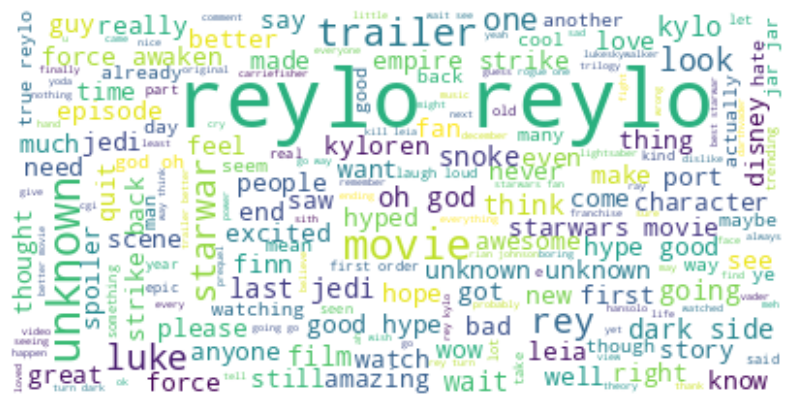

In [ ]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt


text = ' '.join(df['cleaned_Final_star_unknown_text'])

# Create and generate a word cloud image
wc = WordCloud(background_color='white').generate(text)

plt.figure(figsize=(10, 6))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
import pandas as pd
from collections import Counter

words = ' '.join(df['cleaned_Final_star_unknown_text']).split()
word_counts = Counter(words)

# Get the 10 most common words
top_10_words = word_counts.most_common(10)

# Print the words in a table-like format
print(f'{"Rank":<5}{"Word":<15}{"Frequency"}')
for i, (word, freq) in enumerate(top_10_words, 1):
    print(f'{i:<5}{word:<15}{freq}')


Rank Word           Frequency
1    reylo          20249
2    movie          4288
3    unknown        3157
4    not            2921
5    trailer        2651
6    starwars       2477
7    rey            2241
8    like           2075
9    luke           1805
10   good           1732


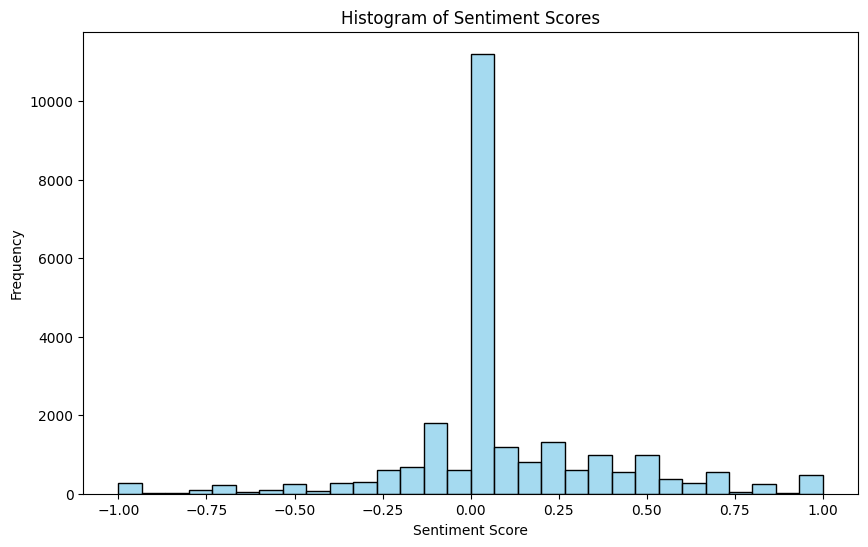

In [ ]:
# Sentiment Score
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from textblob import TextBlob
df['sentiment_score_TextBlob_final'] = df['cleaned_Final_star_unknown_text'].apply(lambda x: TextBlob(x).sentiment.polarity)
plt.figure(figsize=(10, 6))
sns.histplot(df['sentiment_score_TextBlob_final'], bins=30, kde=False, color='skyblue')
plt.title('Histogram of Sentiment Scores')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.show()


In [ ]:
!pip install vaderSentiment

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 2.9 MB/s eta 0:00:00


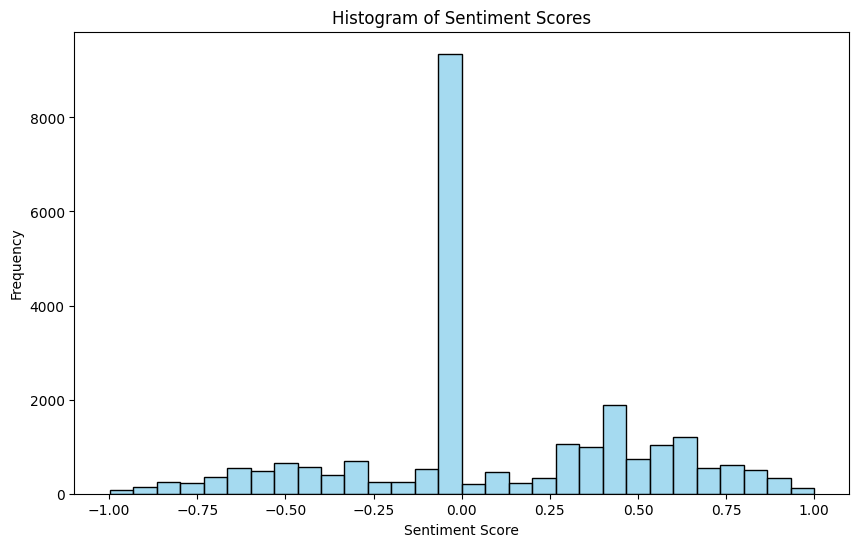

In [ ]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

analyzer = SentimentIntensityAnalyzer()
df['sentiment_score_Vader_final'] = df['cleaned_Final_star_unknown_text'].apply(lambda x: analyzer.polarity_scores(x)['compound'])
plt.figure(figsize=(10, 6))
sns.histplot(df['sentiment_score_Vader_final'], bins=30, kde=False, color='skyblue')
plt.title('Histogram of Sentiment Scores')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.show()


In [ ]:
def categorize_sentiment(score, alpha):
    if score > alpha:
        return 'positive'
    elif -1*alpha <=score <= alpha:
        return 'neutral'
    else:
        return 'negative'

# List of sentiment scores
sentiment_scores = ['sentiment_score_TextBlob_final', 'sentiment_score_Vader_final']

# List of alphas
alphas = [0.05, 0.3, 0.5]

for score in sentiment_scores:
    for alpha in alphas:
        df[f'{score}_{alpha}'] = df[score].apply(lambda x: categorize_sentiment(x, alpha))


In [ ]:
import numpy as np
from google.colab import autoviz

def scatter_plot(df, x_colname, y_colname, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(6 * figscale, 6 * figscale))
  df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha)
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plot(df, *['sentiment_score_TextBlob_final', 'sentiment_score_Vader_final'], **{})
chart

<Figure size 600x600 with 0 Axes>

In [ ]:
df.to_csv('FINAL_star_newest2.csv', index=False)

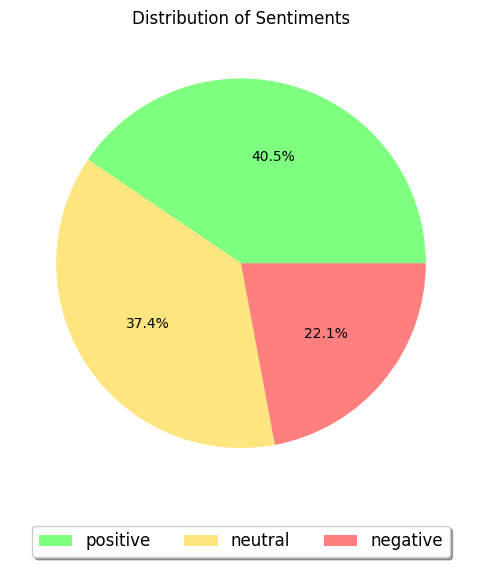

In [ ]:

sentiment_counts = df['sentiment_score_Vader_final_0.05'].value_counts(normalize=True)

colors = [(0, 1, 0, 0.5),(1, 0.8, 0, 0.5),  (1, 0, 0, 0.5)]


plt.figure(figsize=(7, 6))
patches, _, _ = plt.pie(sentiment_counts, autopct='%1.1f%%', colors=colors)


plt.legend(patches, sentiment_counts.index, loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=5, fontsize=12)

plt.title('Distribution of Sentiments')
plt.show()


##keyword extraction

I am using nltk.rake() to do the keyword extraction from both the original and cleaned text

In [ ]:
import pandas as pd
#df = pd.read_csv('FINAL_star_wars.csv')

In [ ]:
!pip3 install pytextrank
import nltk
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
import pandas as pd
from rake_nltk import Rake
r = Rake()

def extract_keywords(text):
    r.extract_keywords_from_text(text)
    return r.get_ranked_phrases()


df['cleaned_keyword'] = df['cleaned_Final_star_unknown_text'].apply(extract_keywords)
df['text_keyword'] = df['Comment'].apply(extract_keywords)

In [ ]:
df.to_csv('FINAL_star_newest2_news.csv', index=False)

In [ ]:
df

,Name,Comment,Likes,comment_length,word_count,sentiment_score_TextBlob,sentiment_score_Vader,sentiment_score_TextBlob_0.05,sentiment_score_TextBlob_0.3,sentiment_score_TextBlob_0.5,...,sentiment_score_TextBlob_final,sentiment_score_Vader_final,sentiment_score_TextBlob_final_0.05,sentiment_score_TextBlob_final_0.3,sentiment_score_TextBlob_final_0.5,sentiment_score_Vader_final_0.05,sentiment_score_Vader_final_0.3,sentiment_score_Vader_final_0.5,cleaned_keyword,text_keyword
0,CSWF,Garbage,2,7,1,0.000000,0.0000,neutral,neutral,neutral,...,-0.700000,-0.5423,negative,negative,negative,negative,negative,negative,[bad garbage],[garbage]
1,Mikaミカ,Luke skywalker fought an inter dimensional inc...,0,146,25,0.000000,-0.4588,neutral,neutral,neutral,...,0.000000,-0.7717,neutral,neutral,neutral,negative,negative,negative,[lukeskywalker fought inter dimensional incarn...,"[force yet someone cracking, luke skywalker fo..."
2,Métis master,Just remembering how naive I was thinking “tha...,1,124,21,0.166667,0.8689,positive,neutral,neutral,...,0.166667,0.8689,positive,neutral,neutral,positive,positive,positive,[remembering naive thinking fun everyone going...,"[thinking “, gonna love, everyone ’, ”, talk, ..."
3,VINIÇÃO YT,Trash.😢,2,7,1,0.000000,-0.4767,neutral,neutral,neutral,...,0.000000,0.0000,neutral,neutral,neutral,neutral,neutral,neutral,[trash],[trash .😢]
4,Dean Esposito,"tbh this trailer was pretty fantastic, it has ...",0,112,20,0.304167,0.8479,positive,positive,neutral,...,0.363333,0.9099,positive,positive,neutral,positive,positive,positive,[honest trailer pretty fantastic subtle hint t...,"[incredibly well edited, subtle hints, pretty ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25026,Antoine Monod,Han shot first,0,14,3,0.250000,0.0000,positive,neutral,neutral,...,0.250000,0.0000,positive,neutral,neutral,neutral,neutral,neutral,[han shot first],[han shot first]
25027,JaydenXV,YYEWSSSSSSSSSSSSSSSS,0,20,1,0.000000,0.0000,neutral,neutral,neutral,...,0.000000,0.0000,neutral,neutral,neutral,neutral,neutral,neutral,[eyes],[yyewssssssssssssssss]
25028,Foofoo14,All aboard the hype train!,1,26,5,0.000000,0.1007,neutral,neutral,neutral,...,0.700000,0.4588,positive,positive,positive,positive,positive,neutral,[aboard good hype train],"[hype train, aboard]"
25029,Matias Guzman,I miss Carrie Fisher :&#39;(,0,28,5,0.000000,-0.1531,neutral,neutral,neutral,...,0.000000,-0.1531,neutral,neutral,neutral,negative,neutral,neutral,[miss carriefisher],[miss carrie fisher :&# 39 ;(]
